



# **Trabalho IA**

**Professor: Jonathan de Andrade Silva**

**Aluno: Pedro dos Santos Zanelato**

**RGA: 2021.1904.009-2**



**Base de Dados 1: https://archive.ics.uci.edu/ml/datasets/banknote+authentication**

**Base de Dados 2: https://archive.ics.uci.edu/ml/datasets/Liver+Disorders**

## Importando bibliotecas

In [ ]:
import random
import numpy as np
import pandas as pd 
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from joblib import dump, load
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.manifold import TSNE
from scipy.spatial.distance import pdist, squareform, cdist
from scipy.cluster.hierarchy import linkage, single, complete, average, ward, dendrogram, to_tree, fcluster

## Base de dados artificial
Utilizei o *make-blobs* para criar minha base de dados artificial.

Fiz 150 amostras com 7 centroids.

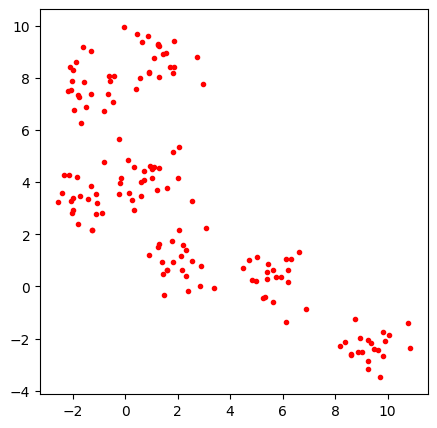

In [ ]:
X,y = make_blobs(centers=7, n_samples=150, random_state=0, cluster_std=0.7)
plt.figure(figsize=(5, 5))
plt.plot(X[:,0],X[:,1],'.r')
plt.show()

Defini aleatoriamente os centroides iniciais e utilizei o algoritmo de KMédias para achar os centroides preditos.

Para cada valor no intervalo de 0 a 10 utiliza-se o KMédias e calcula-se a métrica ARI. Além disso, o algoritmo guarda o melhor resultado e sua métrica para depois apresenta-lo.

In [ ]:
bestMetric = 0
bestCluster = []
for numberClusters in range(2,11,1):
  bestLocalMetric = 0
  for i in range(1000): # 1000 interações para cada número de clusters - [0, 10]
    arrayRandom = random.sample(range(0, len(X)), numberClusters) # calcula array aleatório do tamanho do cluster
    arrayRandom.sort()
    initial_centroids = X[arrayRandom,:]
    kmeans = KMeans(n_init=1,n_clusters=numberClusters,init=initial_centroids) # utilização do mkédias
    kmeans.fit(X)
    metricNew = metrics.adjusted_rand_score(y, kmeans.labels_) # utilizando ARI
    if bestLocalMetric < metricNew: # guarda melhor métrica daquele valor de cluster
      bestLocalMetric = metricNew 
    if bestMetric < metricNew: # guarda melhor métrica entre todos os valores de cluster
      bestMetric = metricNew
      bestCluster = arrayRandom
  print("Metrica atual: ", bestLocalMetric, "Número atual de clusters: ", numberClusters)
print("Melhor métrica: ", bestMetric, "Número de clusters: ", len(bestCluster))

Metrica atual:  0.22677341846117577 Número atual de clusters:  2
Metrica atual:  0.4556203164857404 Número atual de clusters:  3
Metrica atual:  0.6020240083244491 Número atual de clusters:  4
Metrica atual:  0.7134530571566763 Número atual de clusters:  5
Metrica atual:  0.8306149331873891 Número atual de clusters:  6
Metrica atual:  0.9536187404280286 Número atual de clusters:  7
Metrica atual:  0.9386516842668742 Número atual de clusters:  8
Metrica atual:  0.9180372344982118 Número atual de clusters:  9
Metrica atual:  0.9078496502105018 Número atual de clusters:  10
Melhor métrica:  0.9536187404280286 Número de clusters:  7


Mostrando os melhores centroides encontrados:

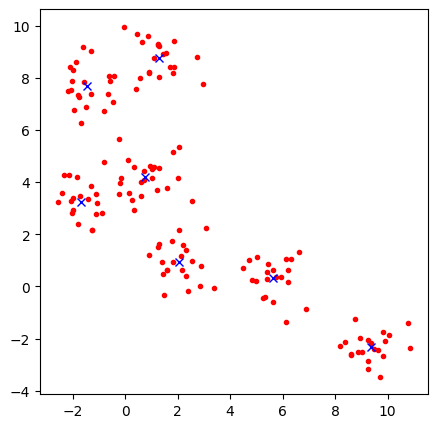

In [ ]:
initial_centroids = X[bestCluster,:]
kmeans = KMeans(n_init=1,n_clusters=len(bestCluster),init=initial_centroids)
kmeans.fit(X)
plt.figure(figsize=(5, 5))
plt.plot(X[:,0],X[:,1],'.r')
plt.plot(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],'xb')
plt.show()

ARI (Adjusted Rand Index) do melhor resultado:

In [ ]:
metrics.adjusted_rand_score(y, kmeans.labels_)

0.9536187404280286

Vamos agora para os algoritmos hierárquicos.

Primeiro, definimos os dados:

In [ ]:
data = pd.DataFrame(X[:,:],columns=['A1','A2'])
dataArray = np.array(data)
print('Dados:')
data

Dados:


,A1,A2
0,-1.971996,3.391386
1,1.081277,8.770972
2,8.855134,-2.497715
3,6.641133,1.333631
4,1.611242,0.643745
...,...,...
145,10.787520,-1.395600
146,-1.887231,8.617371
147,0.876456,9.587397
148,5.618192,-0.595304


Calculamos a matriz de distâncias:

In [ ]:
dist = pd.DataFrame(squareform(pdist(data[['A1', 'A2']]), 'euclidean'), columns=data.index.values, index=data.index.values)
print('\nMatriz de distâncias:')
dist


Matriz de distâncias:


,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
0,0.000000,6.185663,12.325107,8.855526,4.515432,7.919759,9.825369,2.121607,7.110777,5.235065,...,5.806876,7.843122,7.660200,12.488728,14.057490,13.627931,5.226673,6.819401,8.573485,5.134837
1,6.185663,0.000000,13.690002,9.285797,8.144488,9.302148,11.251755,5.276357,8.578754,8.446525,...,2.710143,9.031285,9.404258,13.577492,14.813387,14.055972,2.972479,0.841725,10.407244,7.923302
2,12.325107,13.690002,0.000000,4.425044,7.895742,4.588530,2.558228,10.623447,5.414447,7.140757,...,15.676634,4.785394,4.716706,0.592947,2.004323,2.224584,15.457799,14.481340,3.754592,7.190808
3,8.855526,9.285797,4.425044,0.000000,5.076982,1.458221,2.217694,6.876745,1.942659,4.400477,...,11.380976,1.274308,1.979645,4.292013,5.603856,4.963994,11.215430,10.067579,2.183392,4.090136
4,4.515432,8.144488,7.895742,5.076982,0.000000,3.807223,5.482817,3.282768,3.136097,0.759879,...,9.124934,3.849859,3.417044,8.115753,9.719559,9.400160,8.707355,8.973785,4.194149,1.014562
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,13.627931,14.055972,2.224584,4.963994,9.400160,5.708978,3.941932,11.751123,6.519227,8.643095,...,16.289457,5.793975,6.007417,1.666836,0.967490,0.000000,16.152676,14.793762,5.230911,8.560420
146,5.226673,2.972479,15.457799,11.215430,8.707355,10.889404,12.919229,5.431384,10.083968,9.223241,...,0.638587,10.674089,10.859511,15.440856,16.818971,16.152676,0.000000,2.928979,11.882961,8.833800
147,6.819401,0.841725,14.481340,10.067579,8.973785,10.121894,12.059444,6.053187,9.406228,9.284682,...,2.505673,9.847161,10.232894,14.356268,15.566791,14.793762,2.928979,0.000000,11.232607,8.763776
148,8.573485,10.407244,3.754592,2.183392,4.194149,1.154064,1.292221,6.886315,1.832133,3.434271,...,12.154577,1.473558,1.024282,3.928713,5.526171,5.230911,11.882961,11.232607,0.000000,3.438725


Para fazer o agrupamento hierárquico precisamos calcular somente a parte superior da matriz de distancias. Assim fazemos:

In [ ]:
distances = pdist(dataArray)

Agora, basta fazer os agrupamentos.

Começaremos pelo Single Linkage

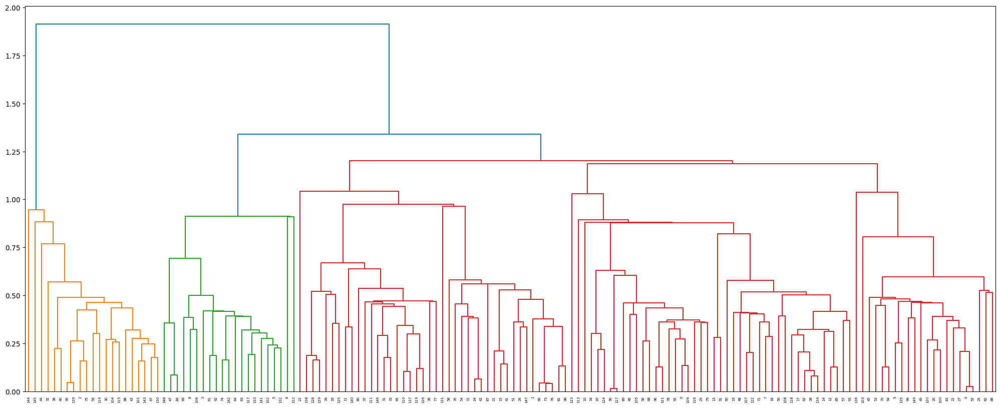

In [ ]:
singleLinkage = linkage(distances, 'single')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(singleLinkage)

Depois calculamos o melhor corte:

In [ ]:
step = (distances.max() - distances.min()) / 200 # dividindo o intervalo de distâncias em 200
initialCut = step
bestMetric = 0
bestCut = 0
for i in range(200):
  cut = initialCut + (step * i)
  currentFcluster = fcluster(singleLinkage, cut, criterion='distance') 
  metric = metrics.adjusted_rand_score(y, currentFcluster)
  if(bestMetric < metric):
    bestMetric = metric
    bestCut = cut
bestCluster = fcluster(singleLinkage, bestCut, criterion='distance')
print(fcluster(singleLinkage, bestCut, criterion='distance'))
print("Melhor métrica:", bestMetric, "/ Melhor corte:", bestCut, "/ Número de clusters:", bestCluster.max())

[11  8  1  4 16  4  5 12  4 16 13  7 12 12 12  8  7 12 12 12 16  8 16 10
  8 16  8 16 12 11  1  7  1  7 11  8  7  7  1  7  1  8  8  1  1 16 11  4
 12 16 12  8 16 16  8 11 11 12  8  1 12  4 12  4  4  7  8  1 11  4 16 12
  8  8  4  1  8  7 11 11  7  8 16 16  4 12 16  8  1 11 11 12  4 12 16  1
 11 11  8 16 16  1  4 16  1 11  4 12 12 11  7  7  6 14  1  1 11  4 12  7
 16 11 12 15 11  7  7 11  7  7  1  9  4  4 12 16 17  7  7  1  7  4  4  1
  3  2  7  8  4 16]
Melhor métrica: 0.8752861111737077 / Melhor corte: 0.8483586578716853 / Número de clusters: 17


Usando o Complete Linkage:

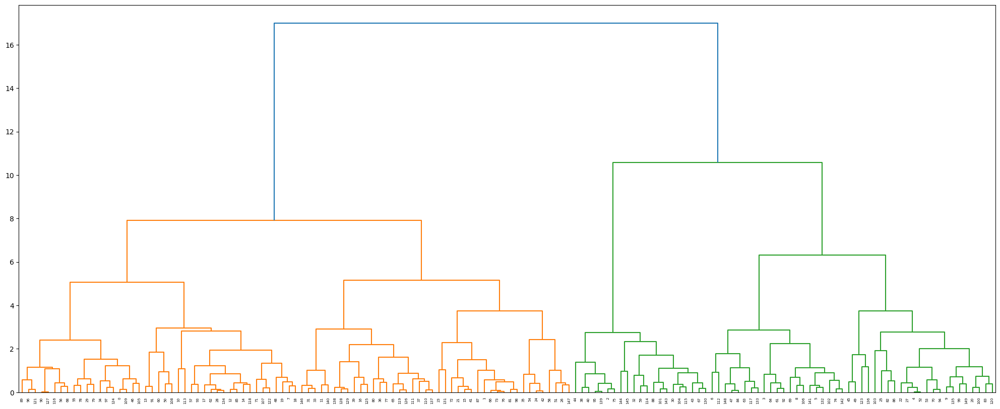

In [ ]:
completeLinkage = linkage(distances, 'complete')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

Calculando o melhor corte:

In [ ]:
bestMetric = 0
bestCut = 0
for i in range(200):
  cut = initialCut + (step * i)
  currentFcluster = fcluster(completeLinkage, cut, criterion='distance') 
  metric = metrics.adjusted_rand_score(y, currentFcluster)
  if(bestMetric < metric):
    bestMetric = metric
    bestCut = cut
bestCluster = fcluster(completeLinkage, bestCut, criterion='distance')
print(fcluster(completeLinkage, bestCut, criterion='distance'))
print("Melhor métrica:", bestMetric, "/ Melhor corte:", bestCut, "/ Número de clusters:", bestCluster.max())

[1 4 5 6 7 6 6 2 6 7 2 3 2 2 2 4 3 2 2 2 7 4 7 4 4 7 4 7 2 1 5 3 5 3 1 4 3
 3 5 3 5 4 4 5 5 7 1 6 2 7 2 4 7 7 4 1 1 2 4 5 2 6 2 6 6 3 4 5 1 6 7 2 4 4
 6 5 4 3 1 1 3 4 7 7 6 2 7 4 5 1 1 2 6 2 7 5 1 1 4 7 7 5 6 7 5 1 6 2 2 1 3
 3 6 2 5 5 1 6 2 3 7 1 2 7 1 3 3 1 3 3 5 4 6 6 2 7 7 3 3 5 3 6 6 5 5 5 3 4
 6 7]
Melhor métrica: 0.9385017489538435 / Melhor corte: 3.8176139604225843 / Número de clusters: 7


Usando o Avarege Linkage:

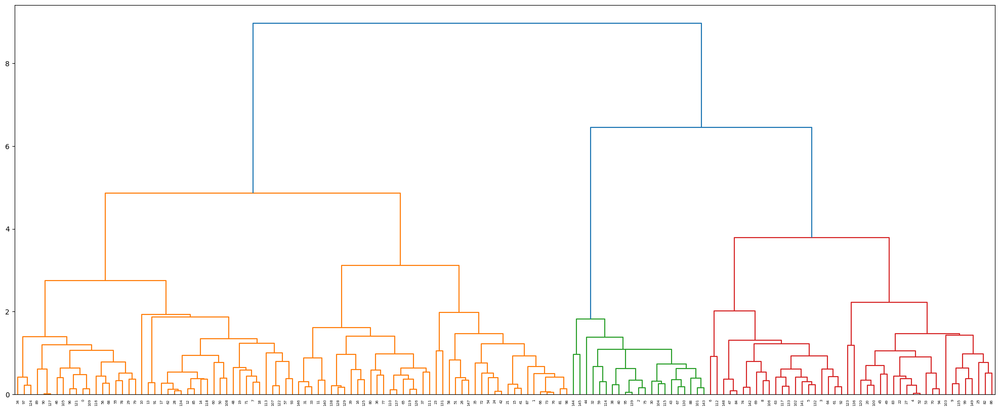

In [ ]:
averageLinkage = linkage(distances, 'average')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(averageLinkage)

Calculando o melhor corte:

In [ ]:
bestMetric = 0
bestCut = 0
for i in range(200):
  cut = initialCut + (step * i)
  currentFcluster = fcluster(averageLinkage, cut, criterion='distance') 
  metric = metrics.adjusted_rand_score(y, currentFcluster)
  if(bestMetric < metric):
    bestMetric = metric
    bestCut = cut
bestCluster = fcluster(averageLinkage, bestCut, criterion='distance')
print(fcluster(averageLinkage, bestCut, criterion='distance'))
print("Melhor métrica:", bestMetric, "/ Melhor corte:", bestCut, "/ Número de clusters:", bestCluster.max())

[1 4 5 6 7 6 6 2 6 7 2 3 2 2 2 4 3 2 2 2 7 4 7 4 4 7 4 7 2 1 5 3 5 3 1 4 3
 3 5 3 5 4 4 5 5 7 1 6 2 7 2 4 7 7 4 1 1 2 4 5 2 6 2 6 6 3 4 5 1 6 7 2 4 4
 6 5 4 3 1 1 3 4 7 7 6 2 7 4 5 1 1 2 6 2 7 5 1 1 4 7 7 5 6 7 5 1 6 2 2 1 3
 3 6 2 5 5 1 6 2 3 7 1 2 7 1 3 3 1 3 3 5 4 6 6 2 7 7 3 3 5 3 6 6 5 5 5 3 4
 6 7]
Melhor métrica: 0.9385017489538435 / Melhor corte: 2.2905683762535505 / Número de clusters: 7


Usando o Centroid Linkage:

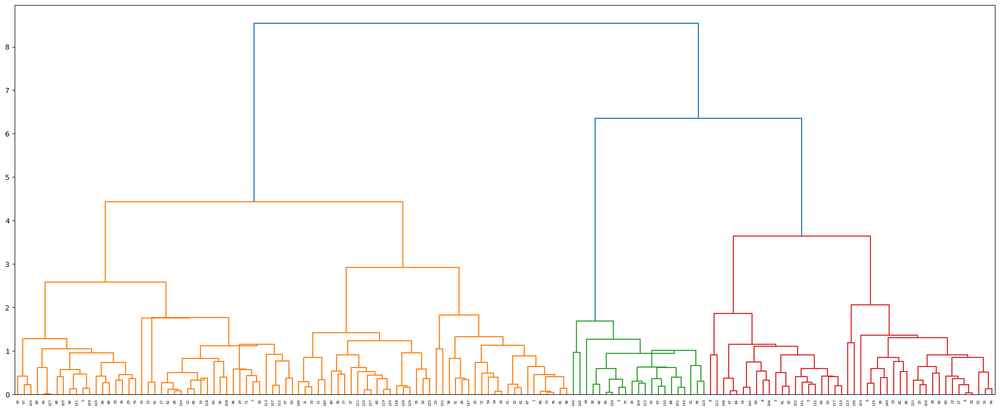

In [ ]:
centroidLinkage = linkage(distances, 'centroid')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(centroidLinkage)

Calculando o melhor corte:


In [ ]:
bestMetric = 0
bestCut = 0
for i in range(200):
  cut = initialCut + (step * i)
  currentFcluster = fcluster(centroidLinkage, cut, criterion='distance') 
  metric = metrics.adjusted_rand_score(y, currentFcluster)
  if(bestMetric < metric):
    bestMetric = metric
    bestCut = cut
bestCluster = fcluster(centroidLinkage, bestCut, criterion='distance')
print(fcluster(centroidLinkage, bestCut, criterion='distance'))
print("Melhor métrica:", bestMetric, "/ Melhor corte:", bestCut, "/ Número de clusters:", bestCluster.max())

[1 4 5 6 7 6 6 2 6 7 2 3 2 2 2 4 3 2 2 2 7 4 7 4 4 7 4 7 2 1 5 3 5 3 1 4 3
 3 5 3 5 4 4 5 5 7 1 6 2 7 2 4 7 7 4 1 1 2 4 5 2 6 2 6 6 3 4 5 1 6 7 2 4 4
 6 5 4 3 1 1 3 4 7 7 6 2 7 4 5 1 1 2 6 2 7 5 1 1 4 7 7 5 6 7 5 1 6 2 2 1 3
 3 6 2 5 5 1 6 2 3 7 1 2 7 1 3 3 1 3 3 5 4 6 6 2 7 7 3 3 5 3 6 6 5 5 5 3 4
 6 7]
Melhor métrica: 0.9385017489538435 / Melhor corte: 2.1208966446792137 / Número de clusters: 7


##Base de dados real 1






###Vizualizando dados


Importando base de dados que irá ser utlizada:

In [ ]:
cols1 = ['variance', 'skewness', 'curtosis', 'entropy', 'class']
df1 = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00267/data_banknote_authentication.txt", names=cols1)
df1[df1['class'] == 0]

,variance,skewness,curtosis,entropy,class
0,3.62160,8.66610,-2.807300,-0.44699,0
1,4.54590,8.16740,-2.458600,-1.46210,0
2,3.86600,-2.63830,1.924200,0.10645,0
3,3.45660,9.52280,-4.011200,-3.59440,0
4,0.32924,-4.45520,4.571800,-0.98880,0
...,...,...,...,...,...
757,2.66060,3.16810,1.961900,0.18662,0
758,3.93100,1.85410,-0.023425,1.23140,0
759,0.01727,8.69300,1.398900,-3.96680,0
760,3.24140,0.40971,1.401500,1.19520,0


###Classe 0


####KMédias

Selecionando linhas com da classe 0:

In [ ]:
data = df1[df1['class'] == 0][['variance', 'skewness', 'curtosis', 'entropy']].to_numpy()
data

array([[ 3.6216 ,  8.6661 , -2.8073 , -0.44699],
       [ 4.5459 ,  8.1674 , -2.4586 , -1.4621 ],
       [ 3.866  , -2.6383 ,  1.9242 ,  0.10645],
       ...,
       [ 0.01727,  8.693  ,  1.3989 , -3.9668 ],
       [ 3.2414 ,  0.40971,  1.4015 ,  1.1952 ],
       [ 2.2504 ,  3.5757 ,  0.35273,  0.2836 ]])

Definido a função de silhueta:

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = KMeans(n_clusters=numberClusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(localData)
    silhouette_avg = silhouette_score(localData, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 1], localData[:, 3], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 1] e localData[:, 3] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 1], centers[:, 3], marker="o", c="white", alpha=1, s=200, edgecolor="k",)
    # centers[:, 1] e centers[:, 3] Escolhe os valores das colunas 3 e 5 que compoem o vetor que representa os centroids

    for i, c in enumerate(centers):
        ax2.scatter(c[1], c[3], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Executando a função:

Número de clusters = 2 A média de silhueta : 0.5025064215297603
Número de clusters = 3 A média de silhueta : 0.3748172173382498
Número de clusters = 4 A média de silhueta : 0.36673047580234736
Número de clusters = 5 A média de silhueta : 0.3744315693224467
Número de clusters = 6 A média de silhueta : 0.39247064739015425
Número de clusters = 7 A média de silhueta : 0.3745827029747115
Número de clusters = 8 A média de silhueta : 0.3898322451466044
Número de clusters = 9 A média de silhueta : 0.4003876195670746


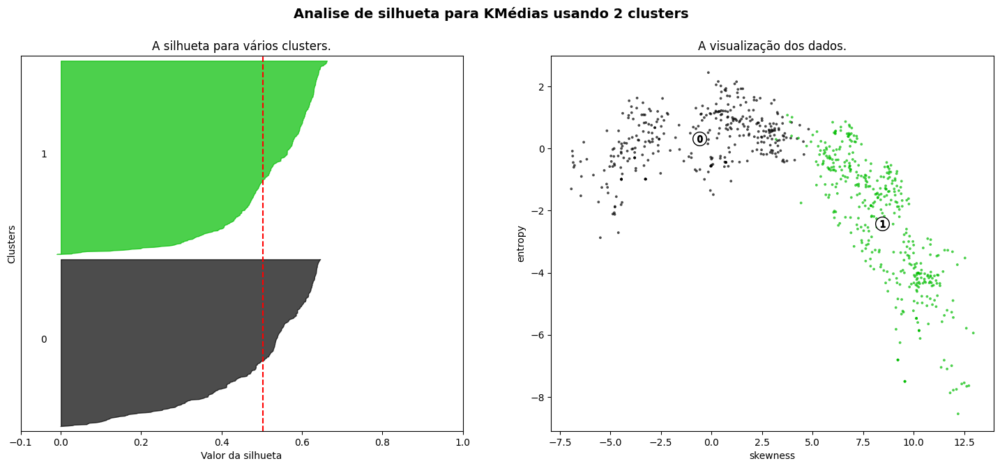

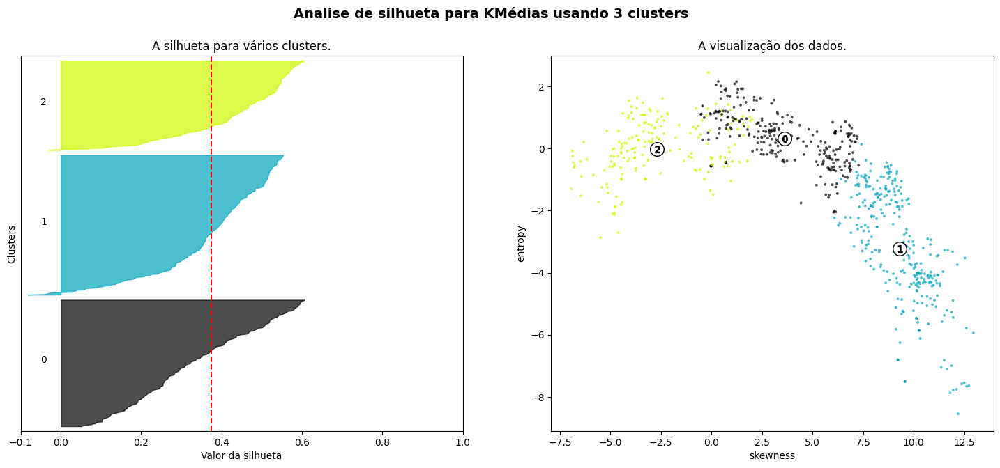

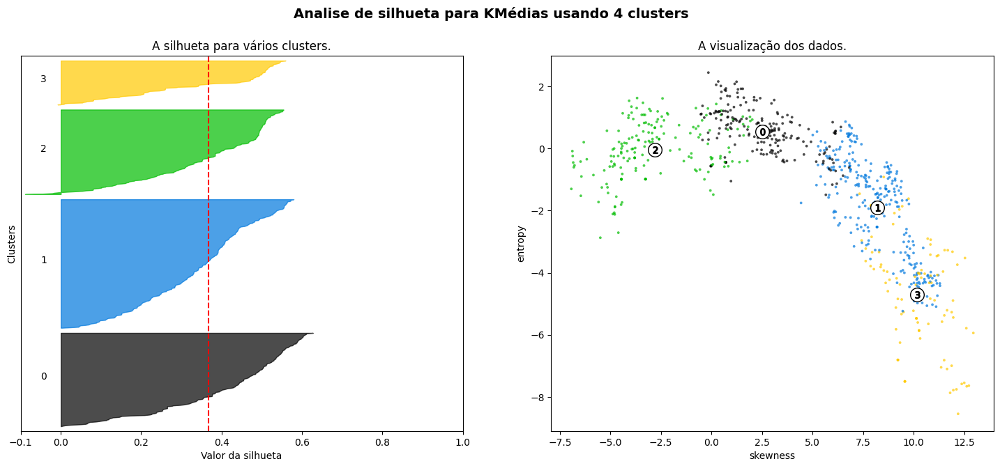

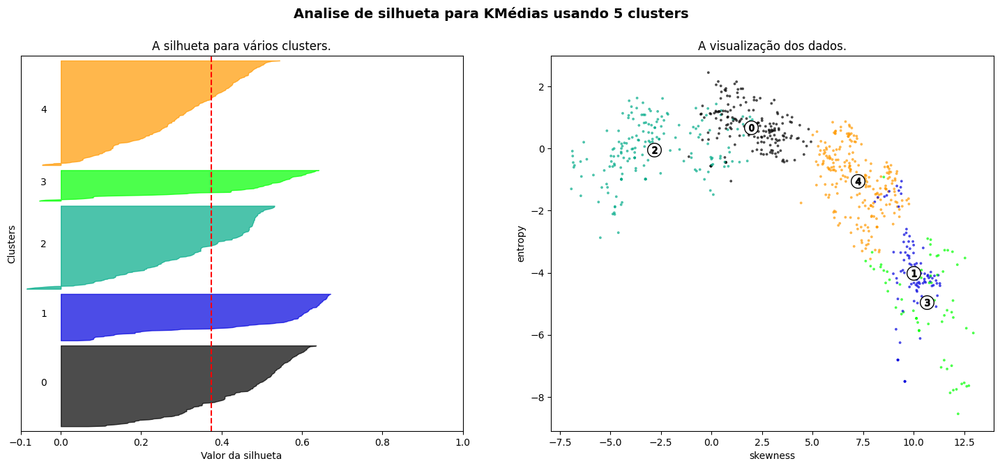

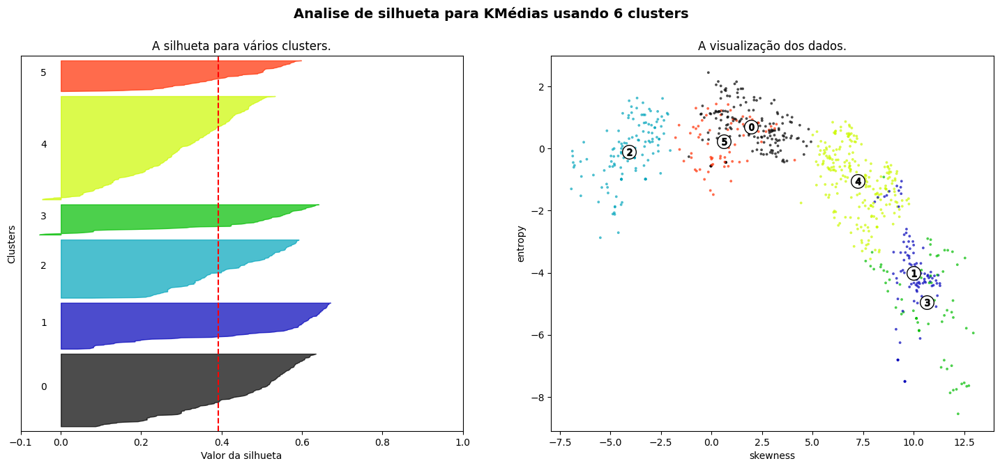

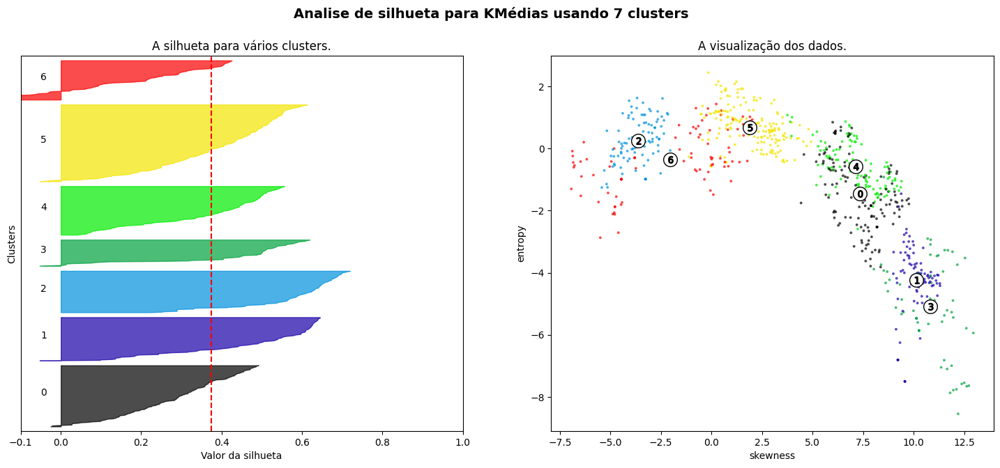

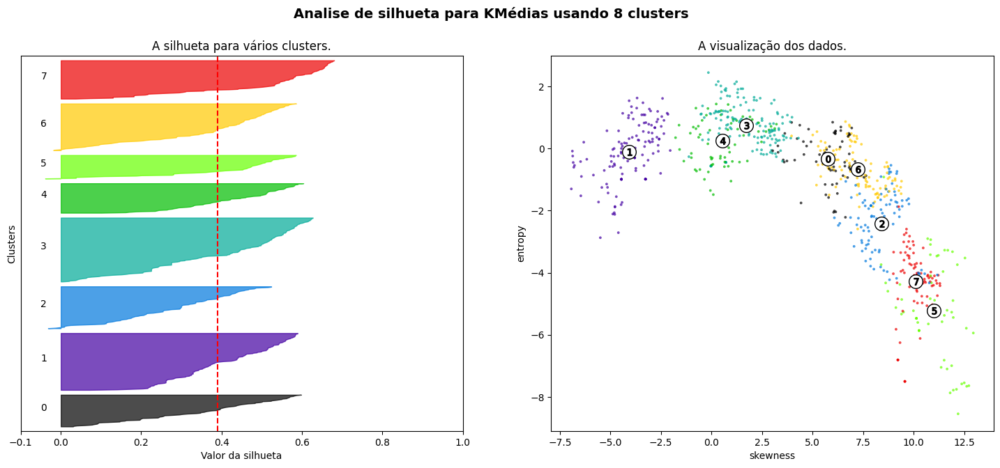

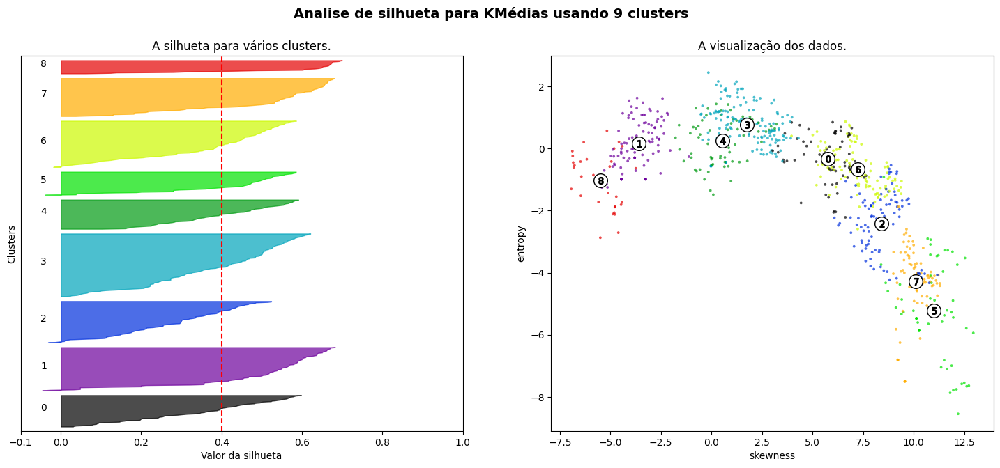

In [ ]:
siluetteFunction(data, 'skewness', 'entropy')

####Single Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='single')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 1], localData[:, 3], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 1] e localData[:, 3] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.14229596893762678
Número de clusters = 3 A média de silhueta : 0.11555856776807202
Número de clusters = 4 A média de silhueta : -0.05208308112329008
Número de clusters = 5 A média de silhueta : -0.05271116791503936
Número de clusters = 6 A média de silhueta : 0.00939893147791575
Número de clusters = 7 A média de silhueta : -0.1149829928014428
Número de clusters = 8 A média de silhueta : -0.0838439839587291
Número de clusters = 9 A média de silhueta : -0.08087708680001929


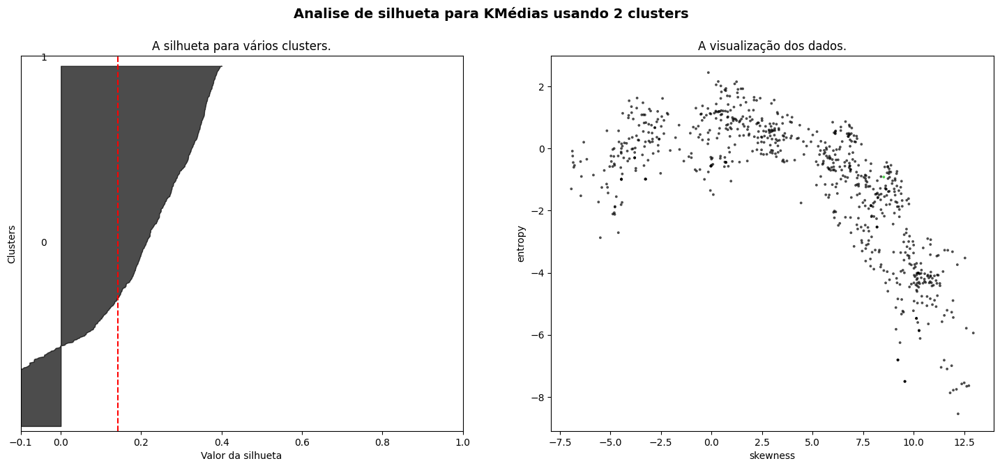

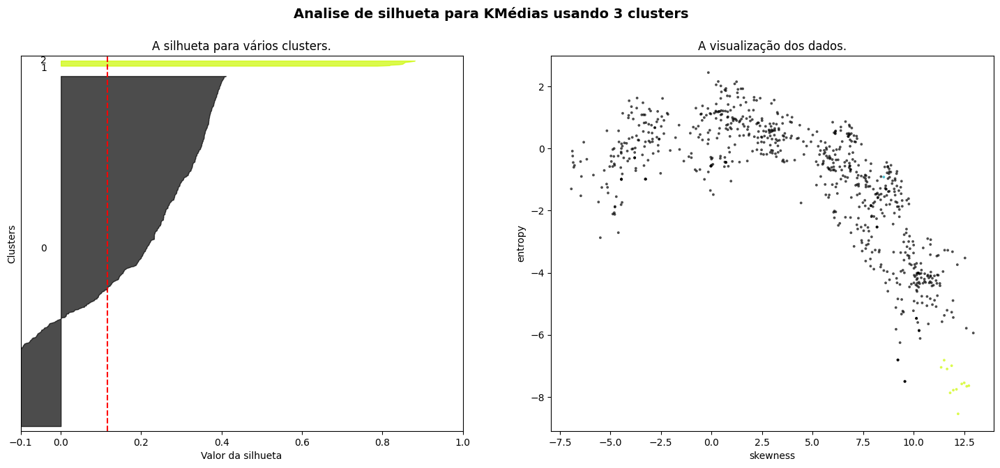

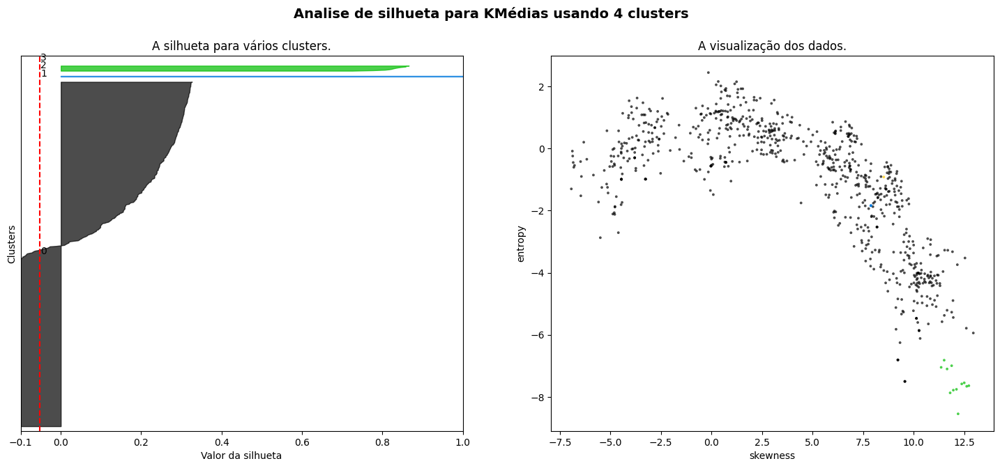

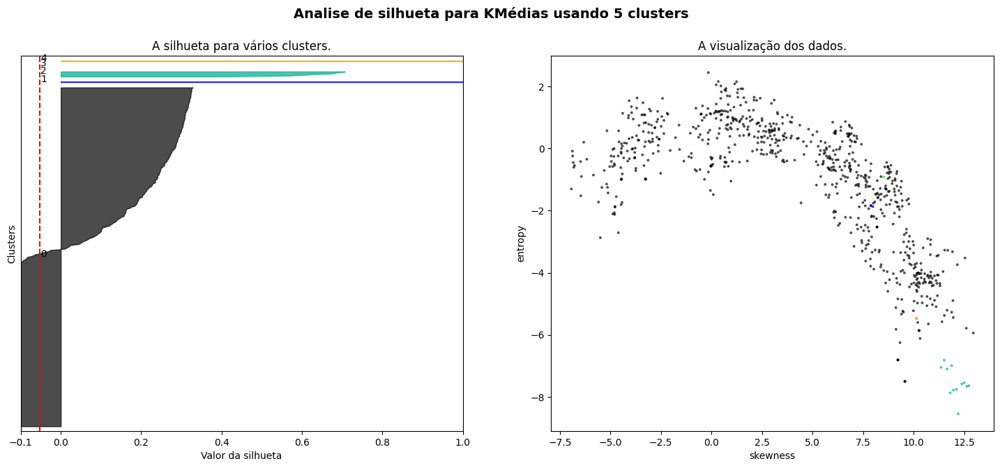

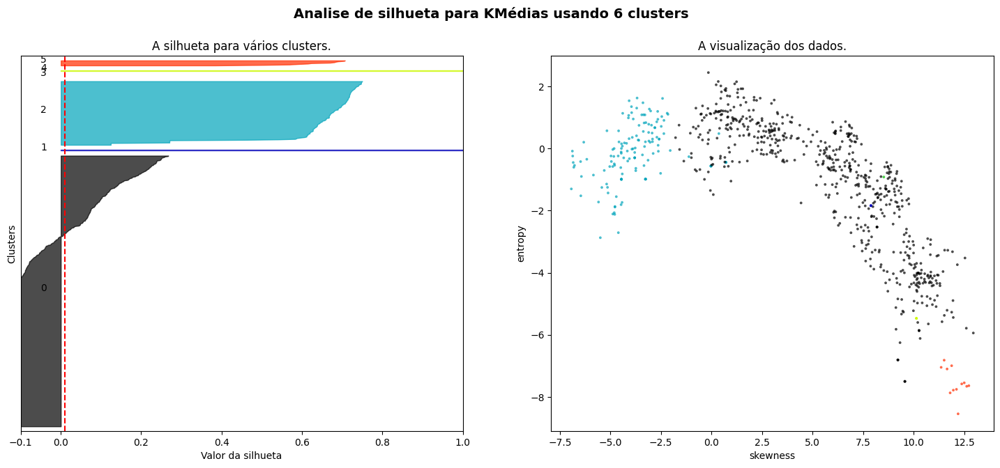

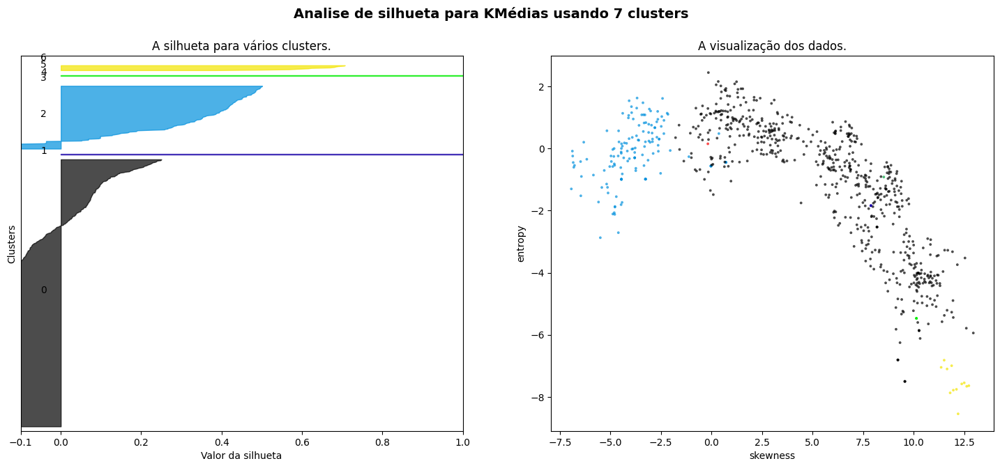

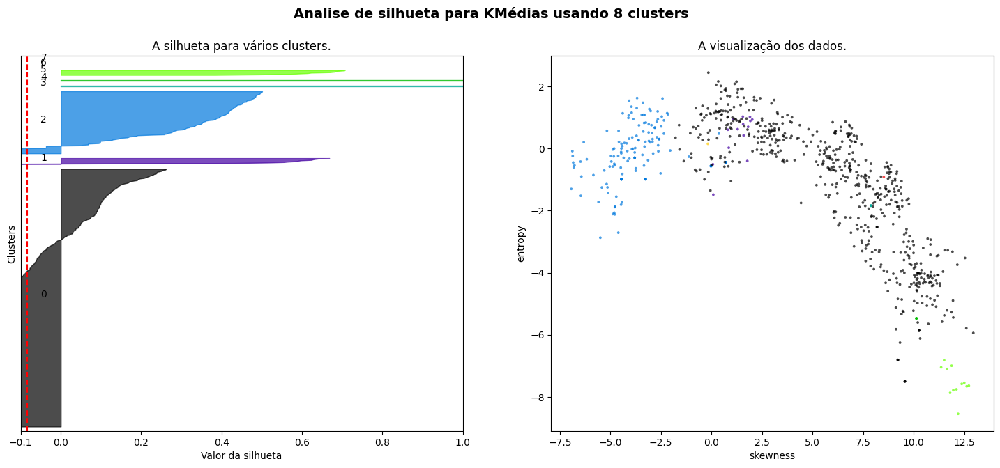

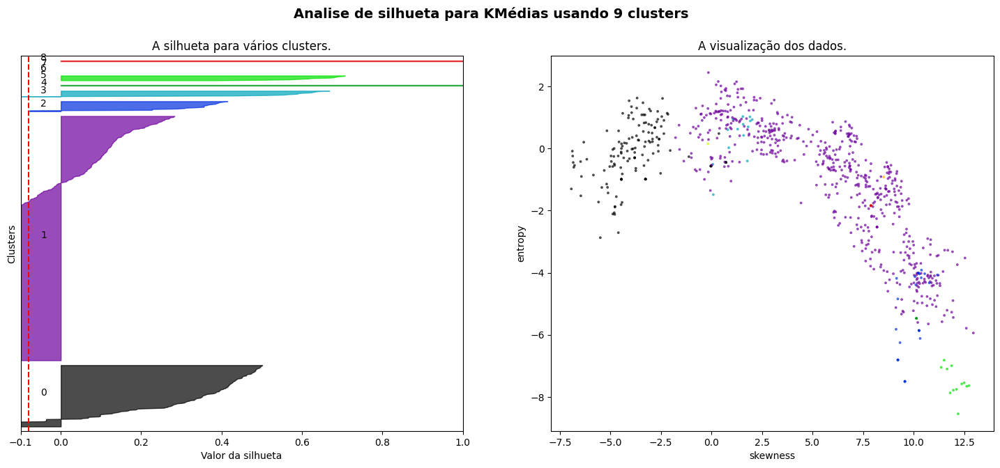

In [ ]:
siluetteFunction(data, 'skewness', 'entropy')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

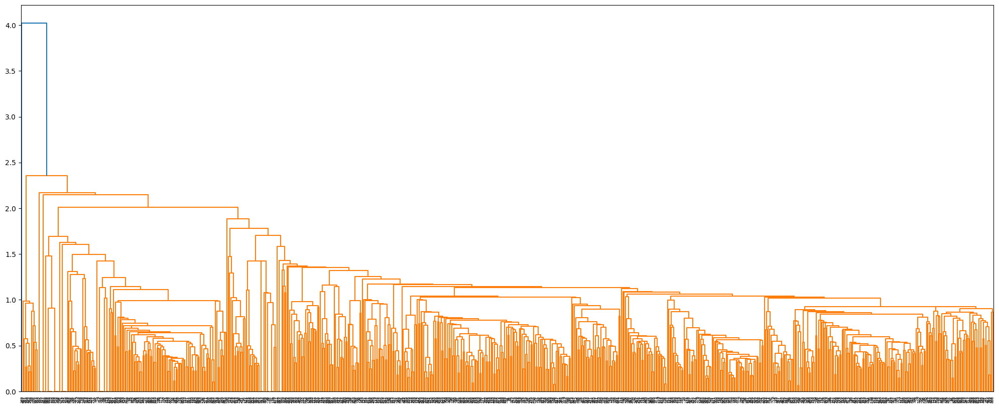

In [ ]:
singleLinkage = linkage(distances, 'single')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(singleLinkage)

####Complete Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='complete')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 1], localData[:, 3], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 1] e localData[:, 3] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.48872270278792596
Número de clusters = 3 A média de silhueta : 0.37862383023002144
Número de clusters = 4 A média de silhueta : 0.32856961607163665
Número de clusters = 5 A média de silhueta : 0.3228620228301356
Número de clusters = 6 A média de silhueta : 0.33202460522650773
Número de clusters = 7 A média de silhueta : 0.31039413207575756
Número de clusters = 8 A média de silhueta : 0.3259428390590107
Número de clusters = 9 A média de silhueta : 0.31809730304989714


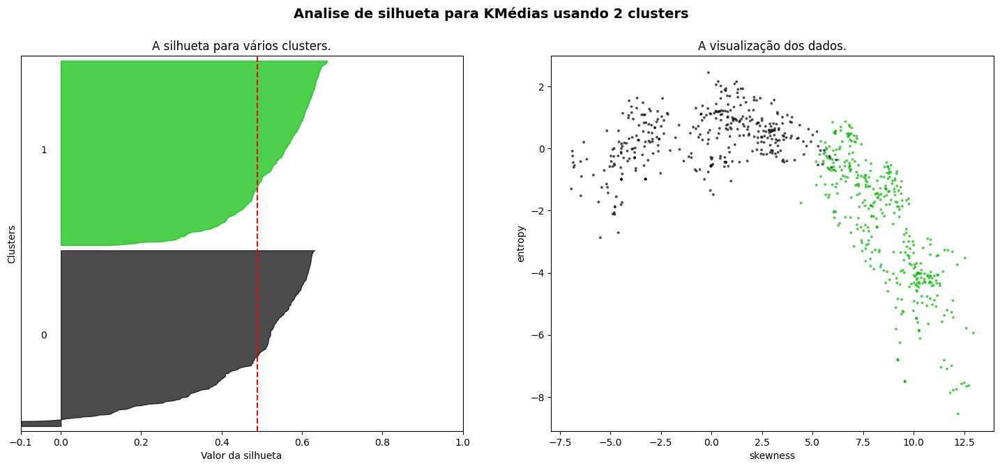

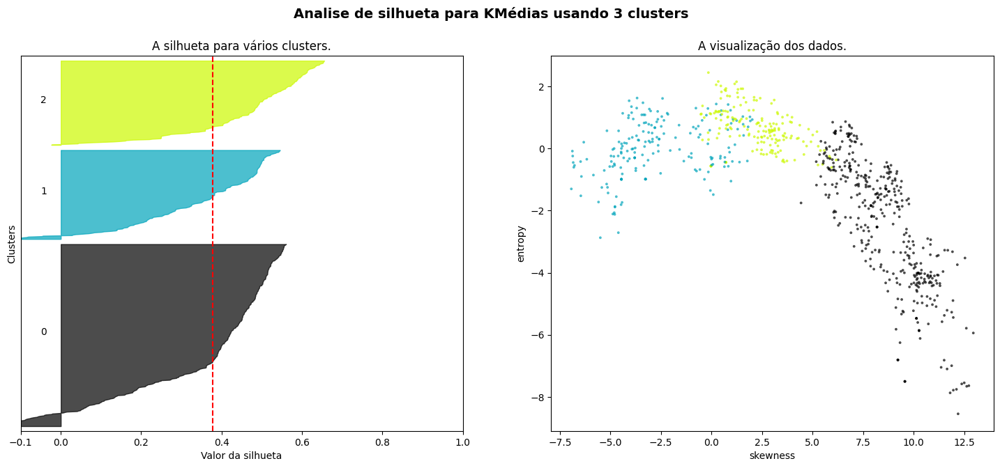

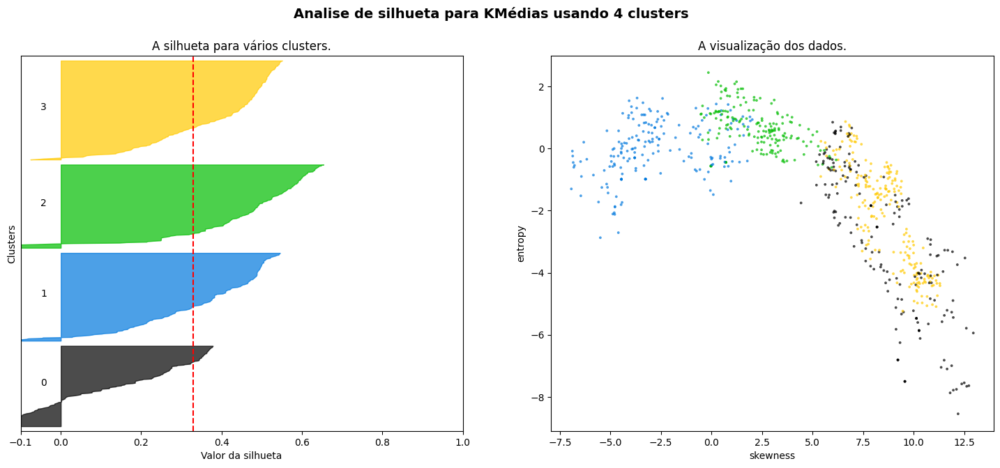

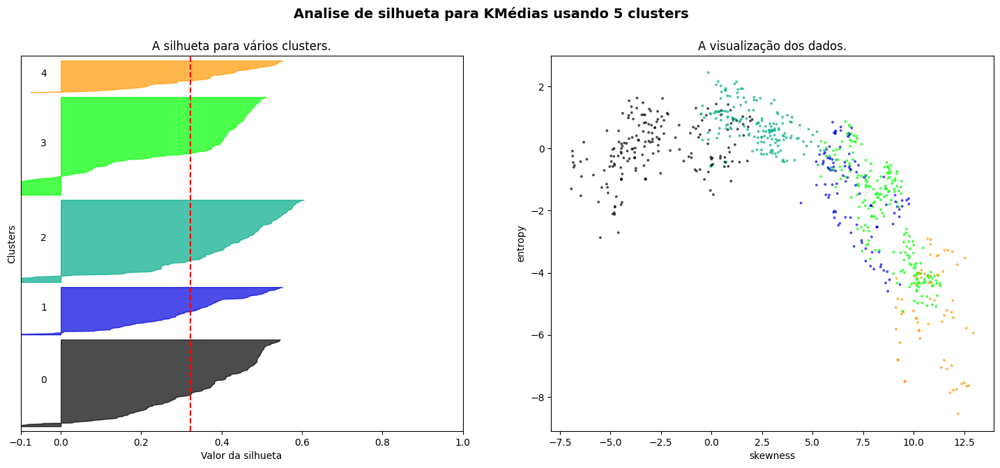

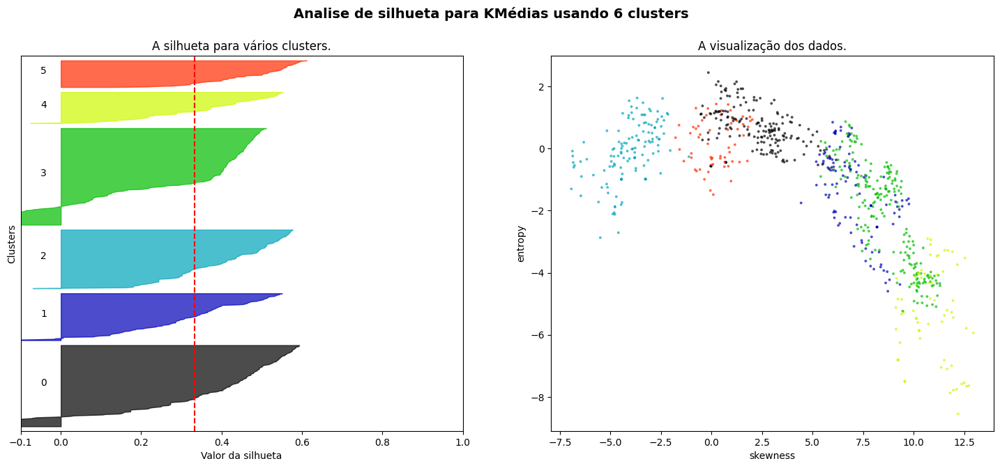

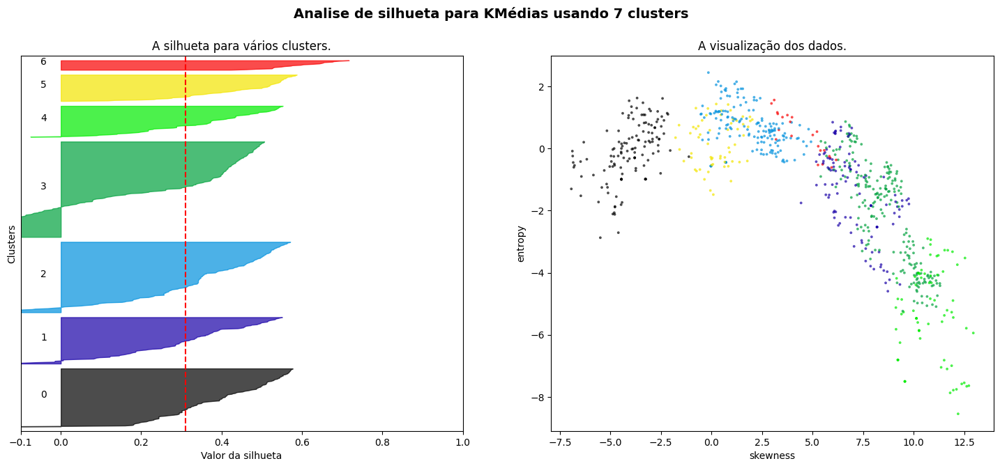

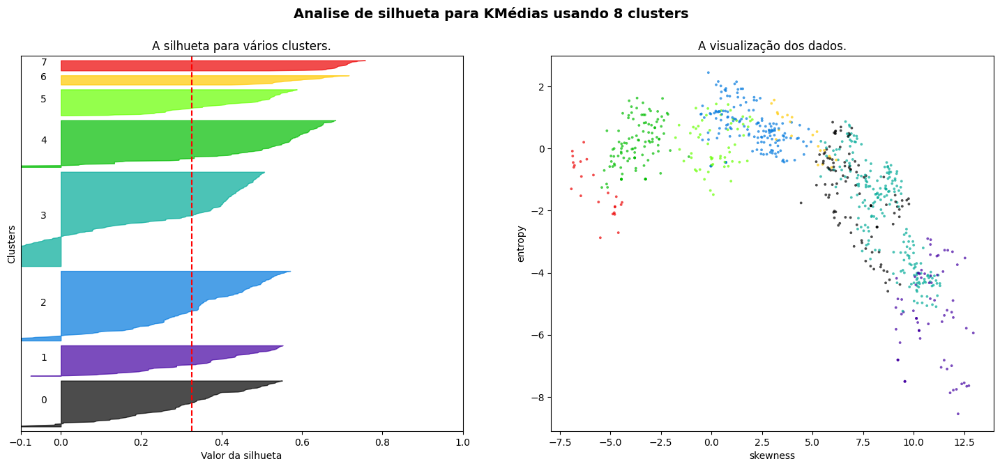

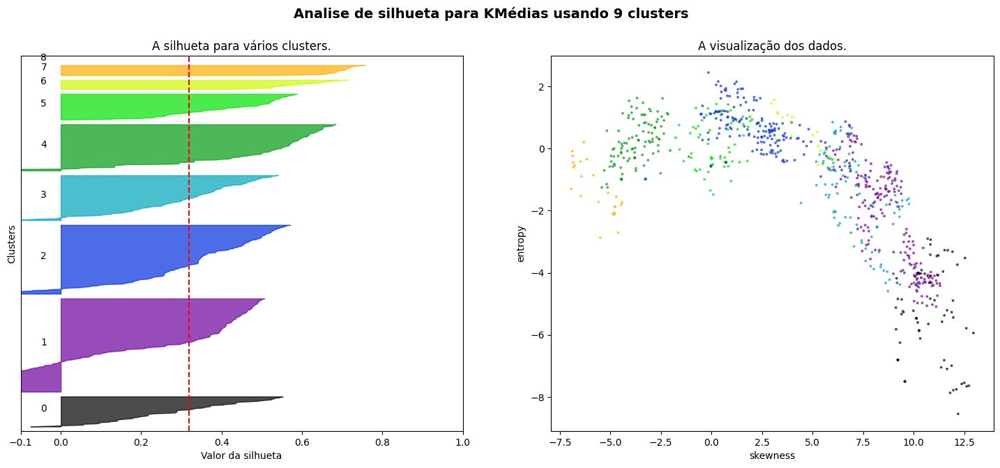

In [ ]:
siluetteFunction(data, 'skewness', 'entropy')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

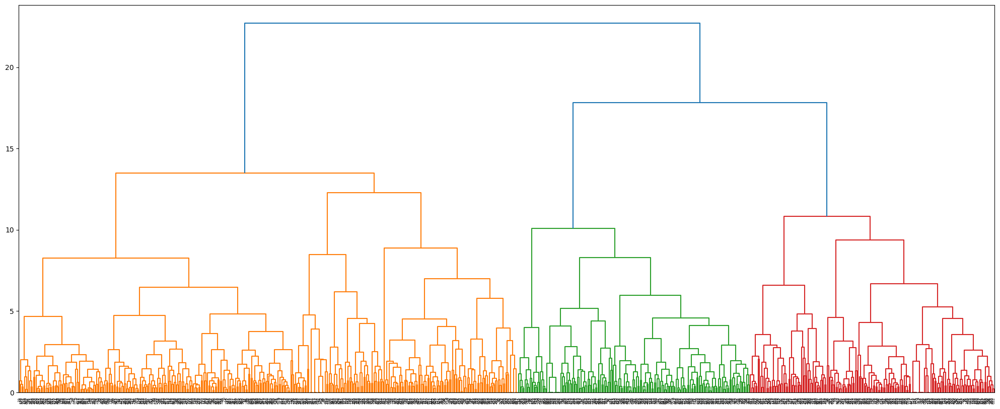

In [ ]:
completeLinkage = linkage(distances, 'complete')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

####Average Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='average')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 1], localData[:, 3], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 1] e localData[:, 3] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.48550887619354965
Número de clusters = 3 A média de silhueta : 0.40573402472870485
Número de clusters = 4 A média de silhueta : 0.35193988728916964
Número de clusters = 5 A média de silhueta : 0.33739074052768614
Número de clusters = 6 A média de silhueta : 0.34447657896553857
Número de clusters = 7 A média de silhueta : 0.356135723493153
Número de clusters = 8 A média de silhueta : 0.3269822564203617
Número de clusters = 9 A média de silhueta : 0.36870521360617664


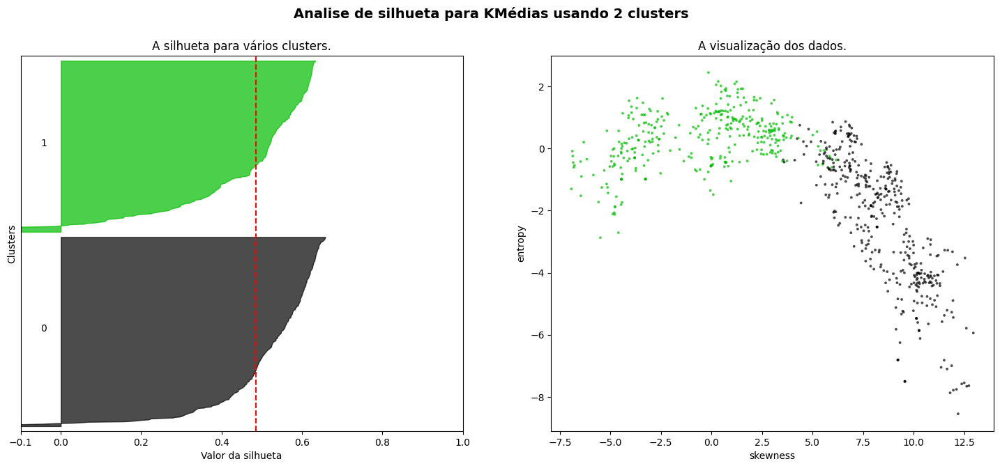

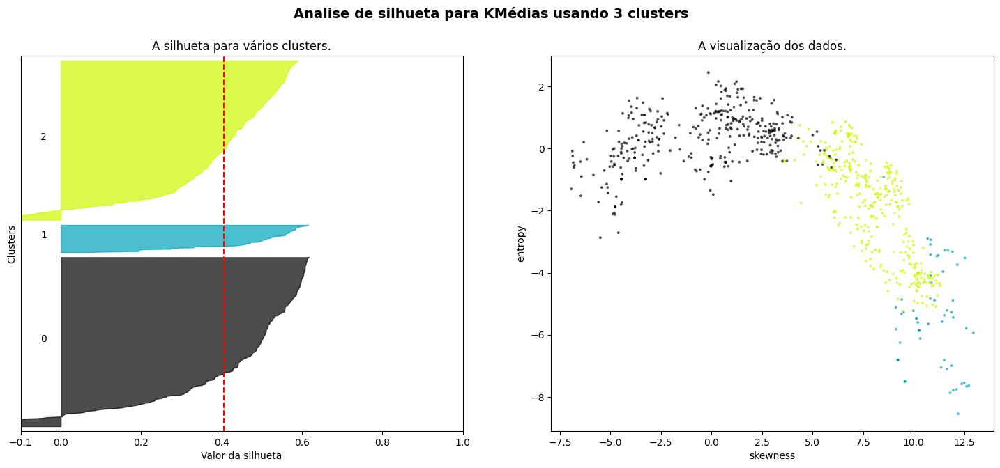

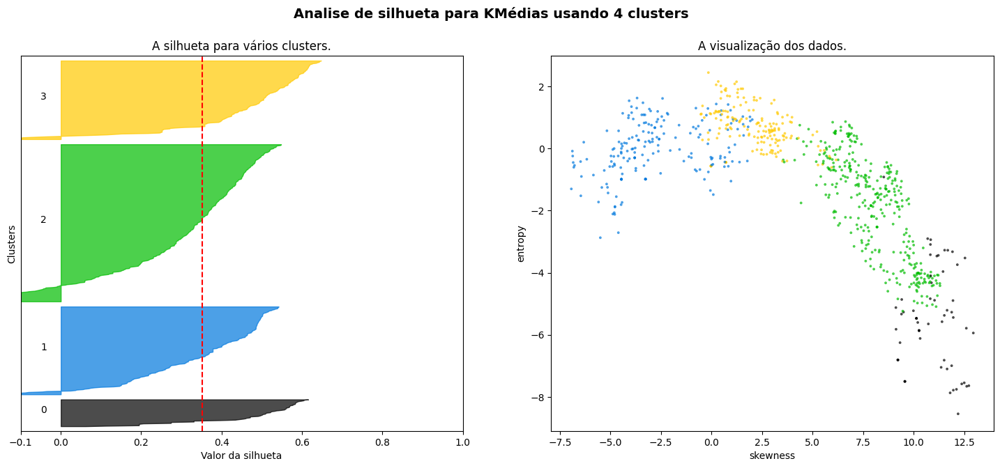

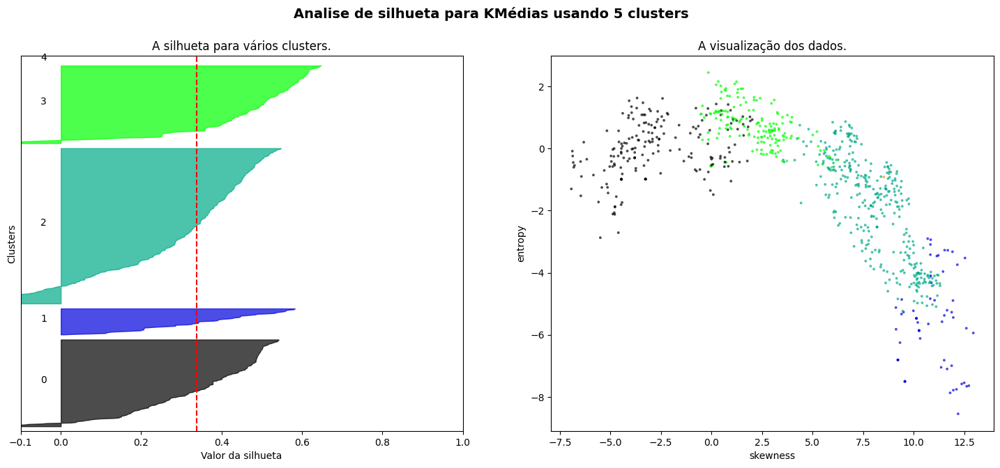

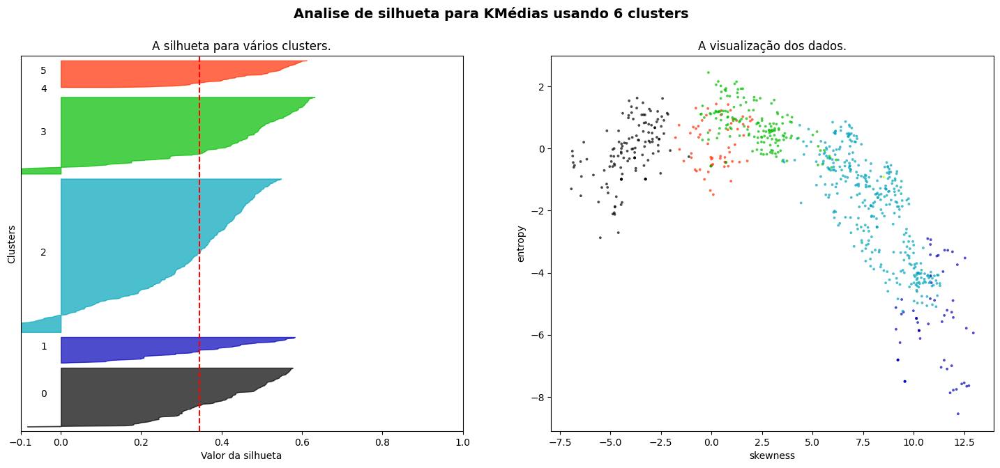

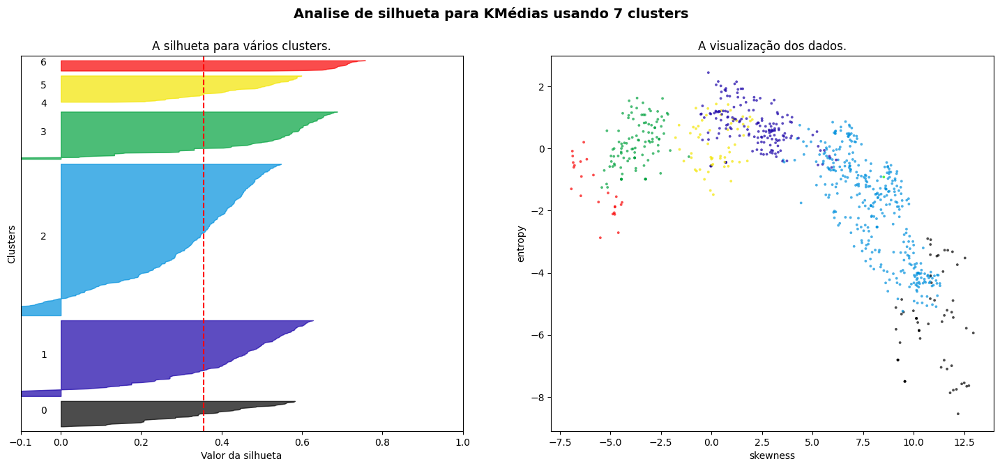

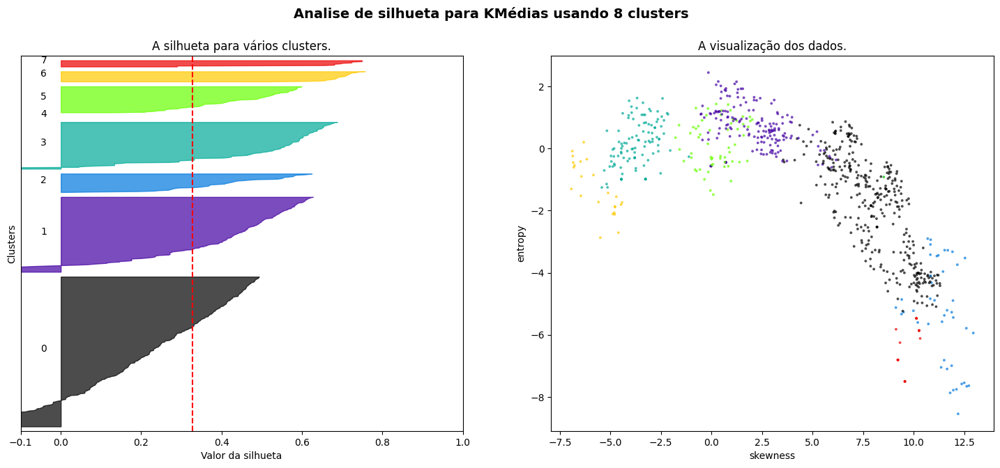

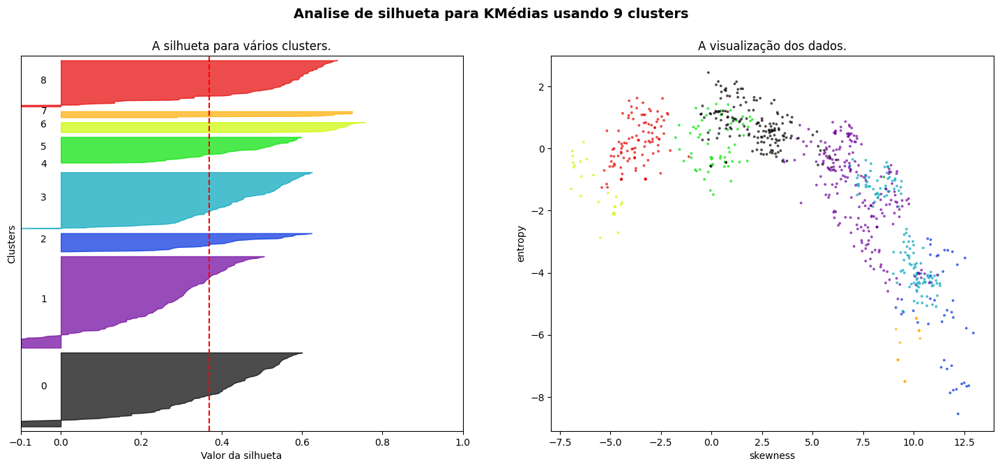

In [ ]:
siluetteFunction(data, 'skewness', 'entropy')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

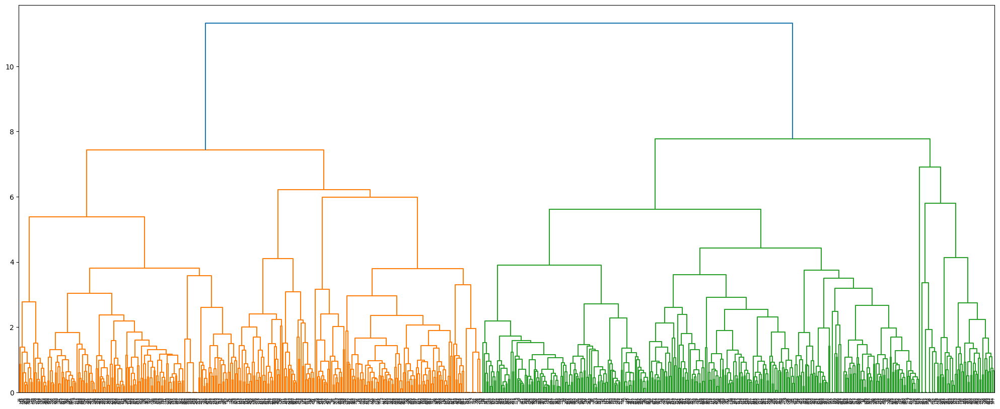

In [ ]:
completeLinkage = linkage(distances, 'average')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

####Centroid Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='ward')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 1], localData[:, 3], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 1] e localData[:, 3] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.5007865038700301
Número de clusters = 3 A média de silhueta : 0.36568273581086985
Número de clusters = 4 A média de silhueta : 0.3312666144980886
Número de clusters = 5 A média de silhueta : 0.3490172188767138
Número de clusters = 6 A média de silhueta : 0.3657813389914195
Número de clusters = 7 A média de silhueta : 0.36669875706076055
Número de clusters = 8 A média de silhueta : 0.3797073703654844
Número de clusters = 9 A média de silhueta : 0.3524732897994915


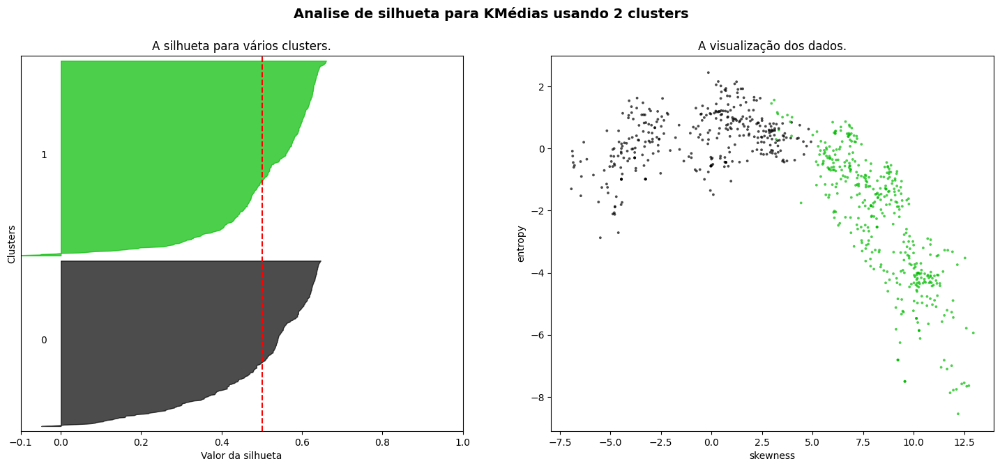

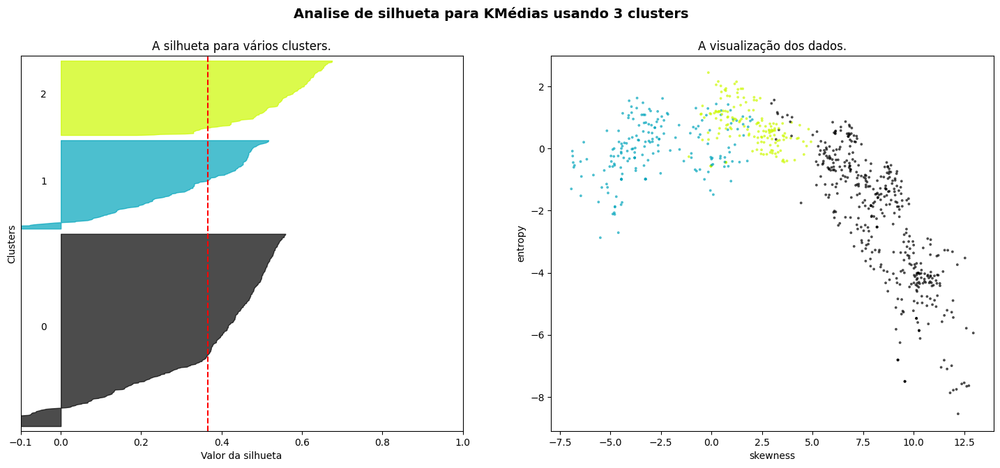

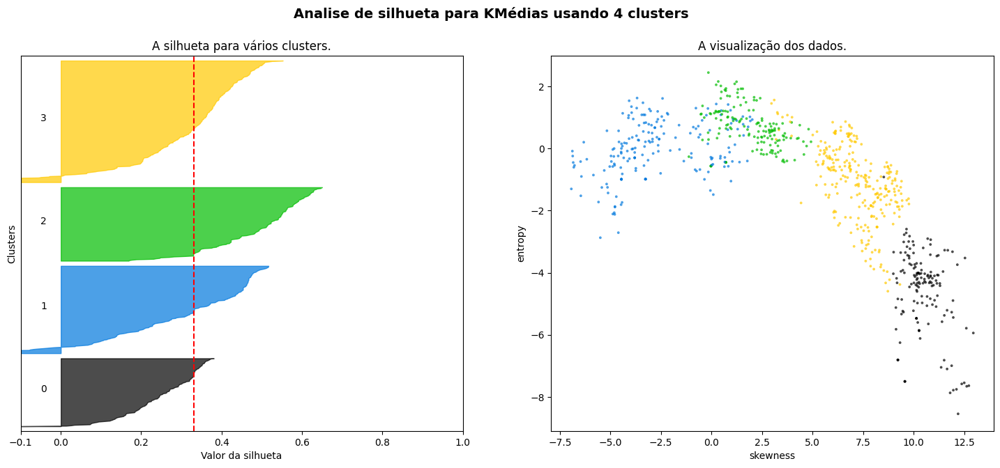

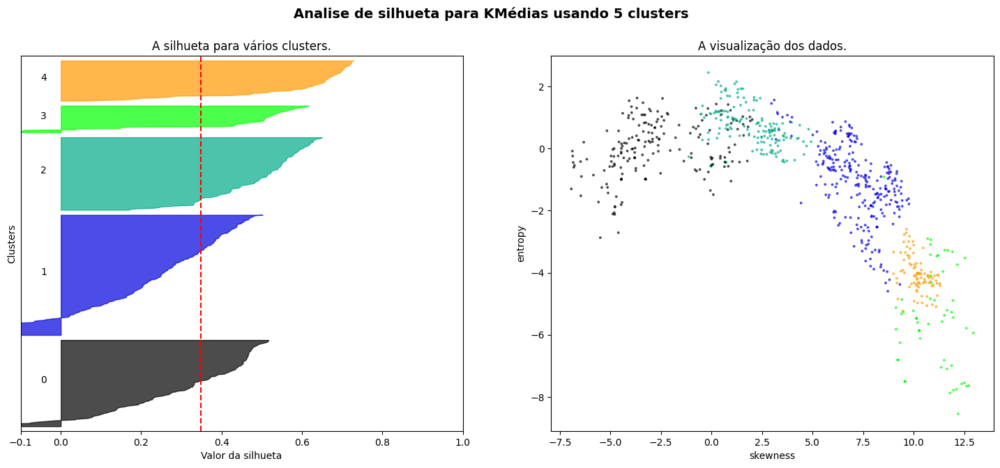

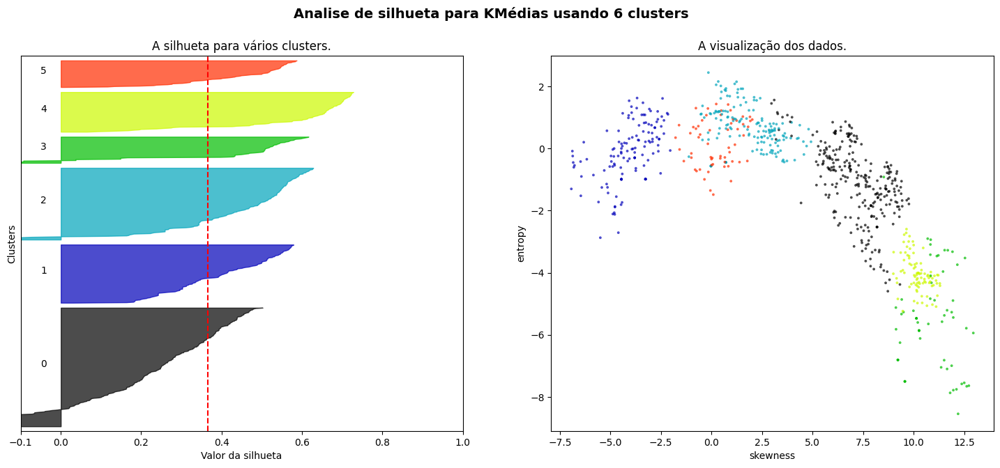

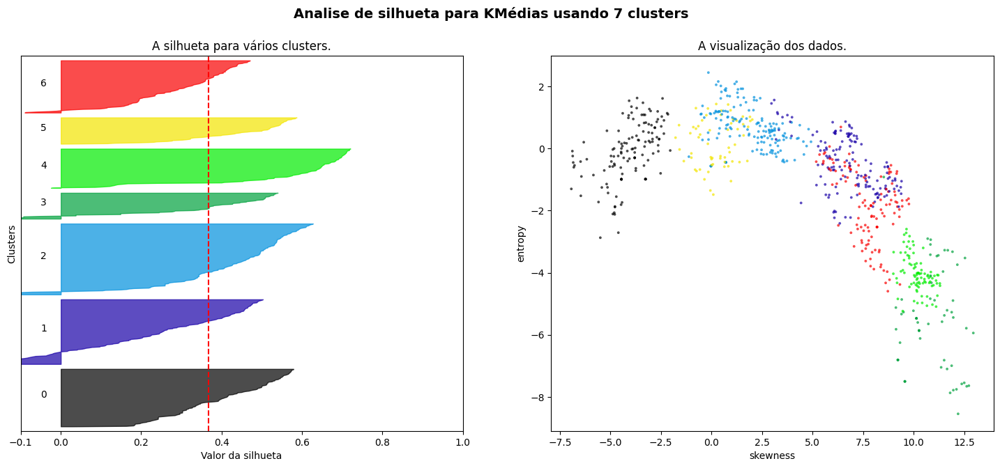

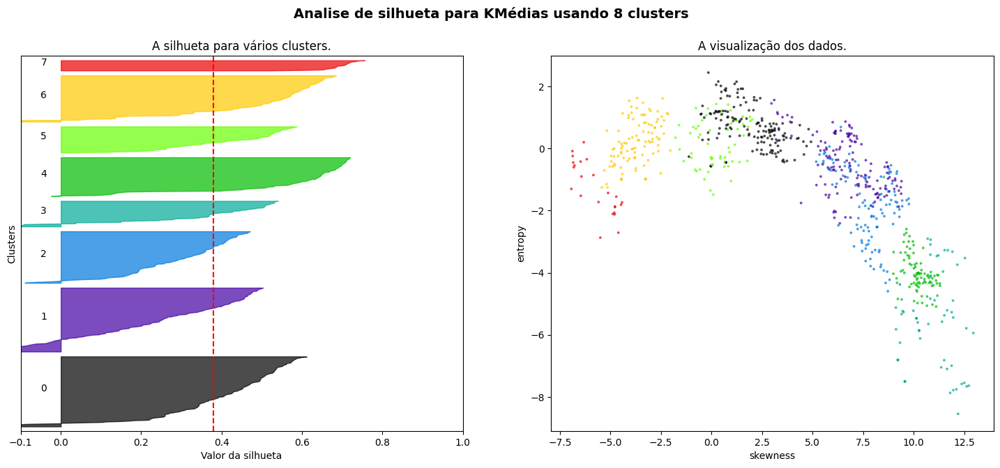

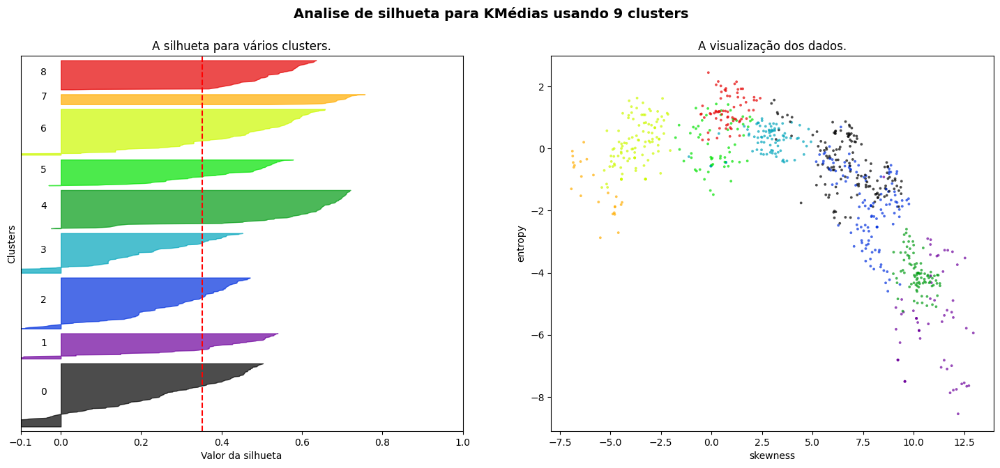

In [ ]:
siluetteFunction(data, 'skewness', 'entropy')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

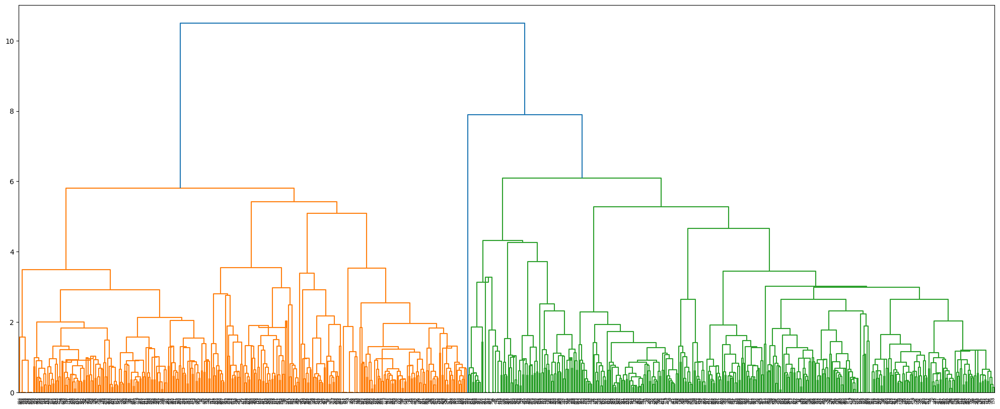

In [ ]:
completeLinkage = linkage(distances, 'centroid')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

###Classe 1


####KMédias

Selecionando linhas com da classe 1:

In [ ]:
data = df1[df1['class'] == 1].to_numpy()
data

array([[ -1.3971  ,   3.3191  ,  -1.3927  ,  -1.9948  ,   1.      ],
       [  0.39012 ,  -0.14279 ,  -0.031994,   0.35084 ,   1.      ],
       [ -1.6677  ,  -7.1535  ,   7.8929  ,   0.96765 ,   1.      ],
       ...,
       [ -3.7503  , -13.4586  ,  17.5932  ,  -2.7771  ,   1.      ],
       [ -3.5637  ,  -8.3827  ,  12.393   ,  -1.2823  ,   1.      ],
       [ -2.5419  ,  -0.65804 ,   2.6842  ,   1.1952  ,   1.      ]])

Definido a função de silhueta:

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = KMeans(n_clusters=numberClusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(localData)
    silhouette_avg = silhouette_score(localData, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 1], localData[:, 3], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 1] e localData[:, 3] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 1], centers[:, 3], marker="o", c="white", alpha=1, s=200, edgecolor="k",)
    # centers[:, 1] e centers[:, 3] Escolhe os valores das colunas 3 e 5 que compoem o vetor que representa os centroids

    for i, c in enumerate(centers):
        ax2.scatter(c[1], c[3], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Executando a função:

Número de clusters = 2 A média de silhueta : 0.600221922396089
Número de clusters = 3 A média de silhueta : 0.42308162877825045
Número de clusters = 4 A média de silhueta : 0.44835779980848534
Número de clusters = 5 A média de silhueta : 0.4537018250203266
Número de clusters = 6 A média de silhueta : 0.4340037592558976
Número de clusters = 7 A média de silhueta : 0.41011250347945355
Número de clusters = 8 A média de silhueta : 0.41101450815821816
Número de clusters = 9 A média de silhueta : 0.44126654885350447


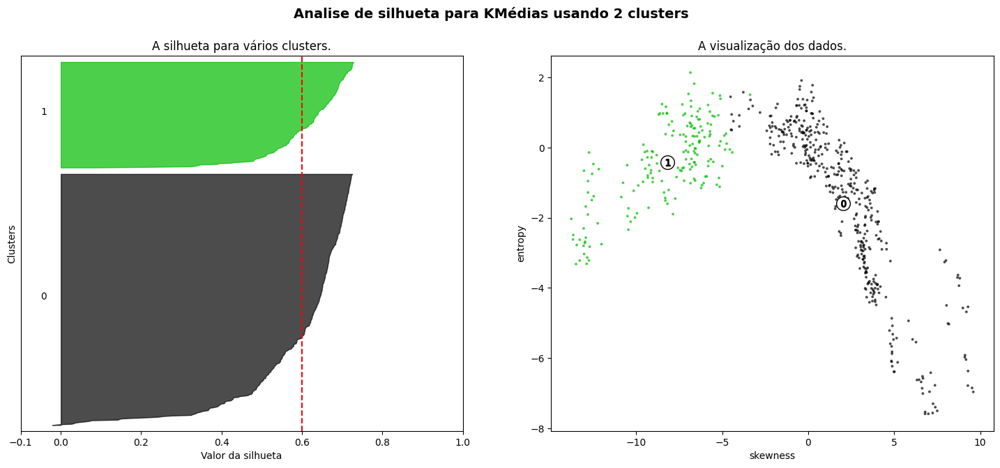

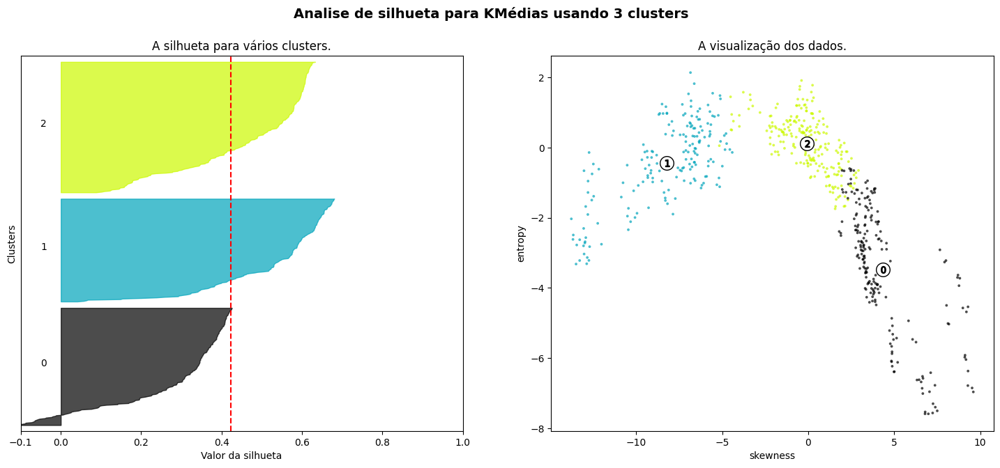

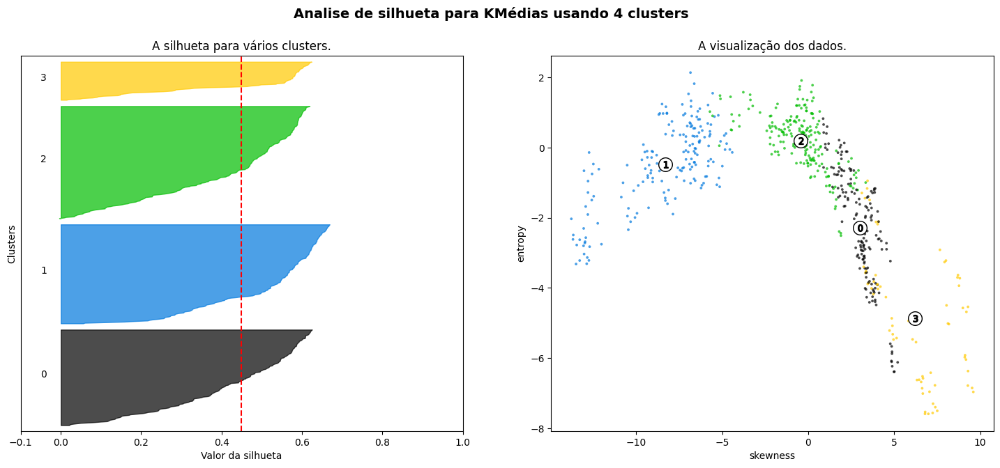

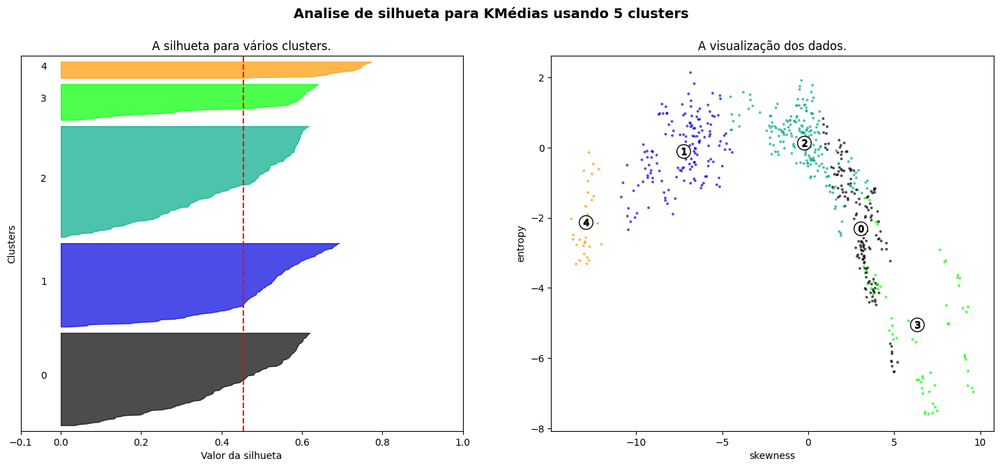

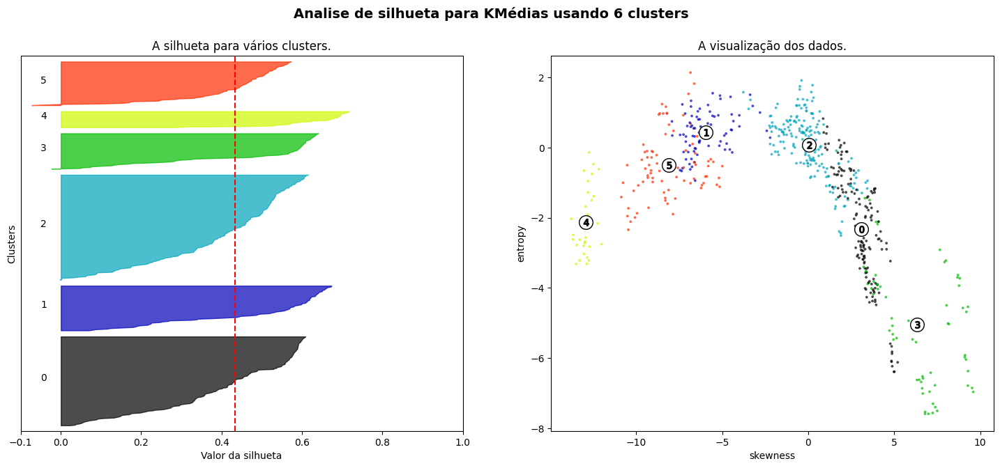

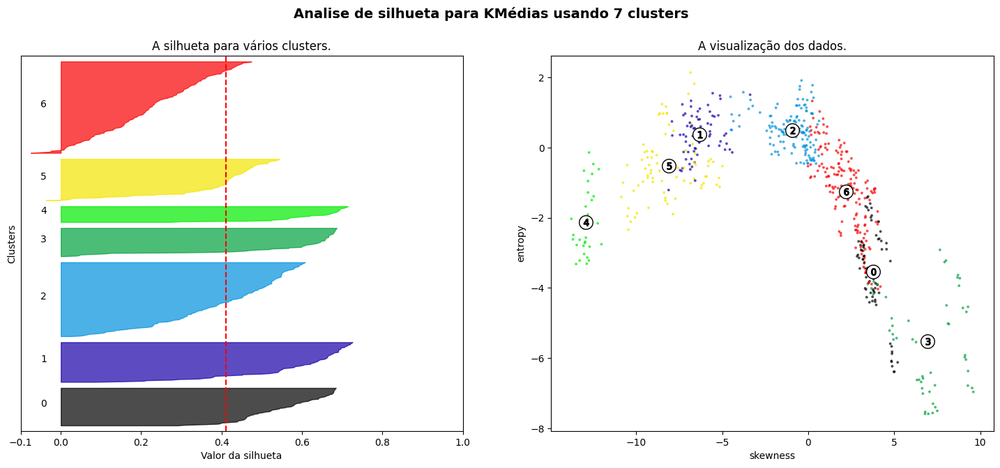

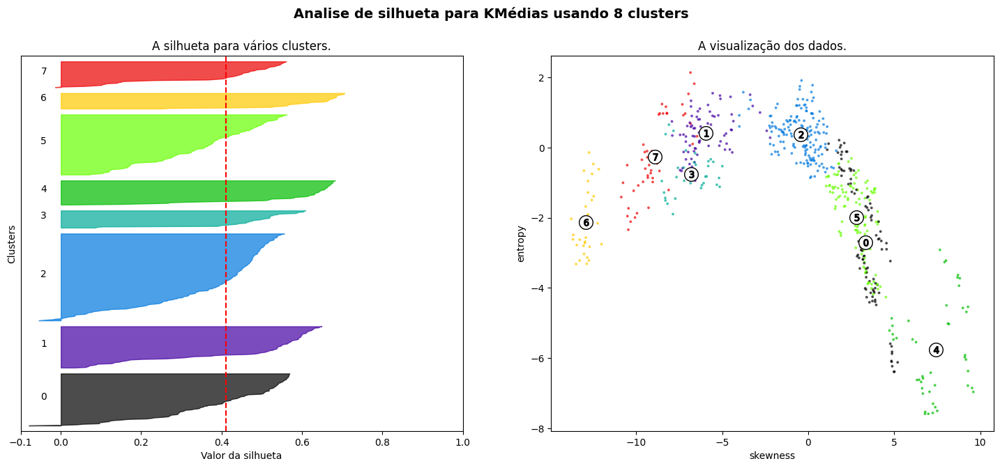

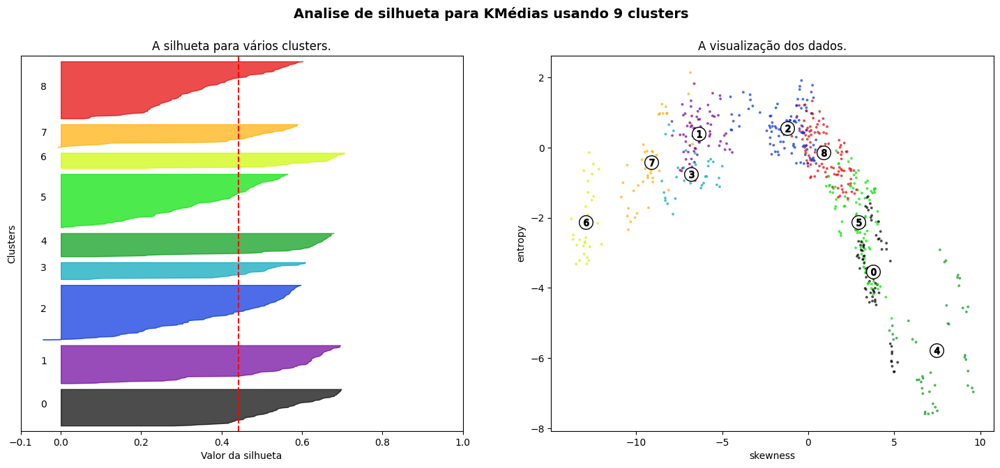

In [ ]:
siluetteFunction(data, 'skewness', 'entropy')

####Single Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='single')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 1], localData[:, 3], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 1] e localData[:, 3] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.47624030661429534
Número de clusters = 3 A média de silhueta : 0.4070995355820103
Número de clusters = 4 A média de silhueta : 0.14111367333226832
Número de clusters = 5 A média de silhueta : 0.4007521447166926
Número de clusters = 6 A média de silhueta : 0.37254851843956277
Número de clusters = 7 A média de silhueta : 0.33389243068284963
Número de clusters = 8 A média de silhueta : 0.338279830573003
Número de clusters = 9 A média de silhueta : 0.19410898666177903


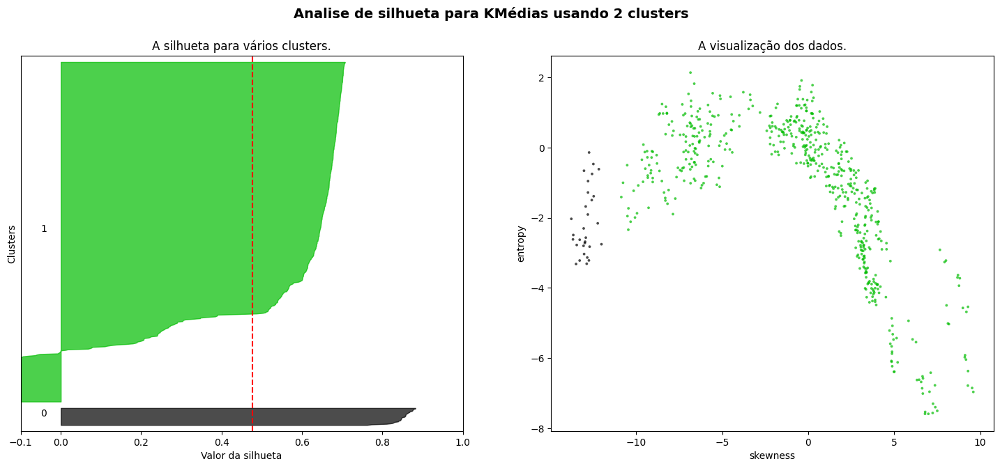

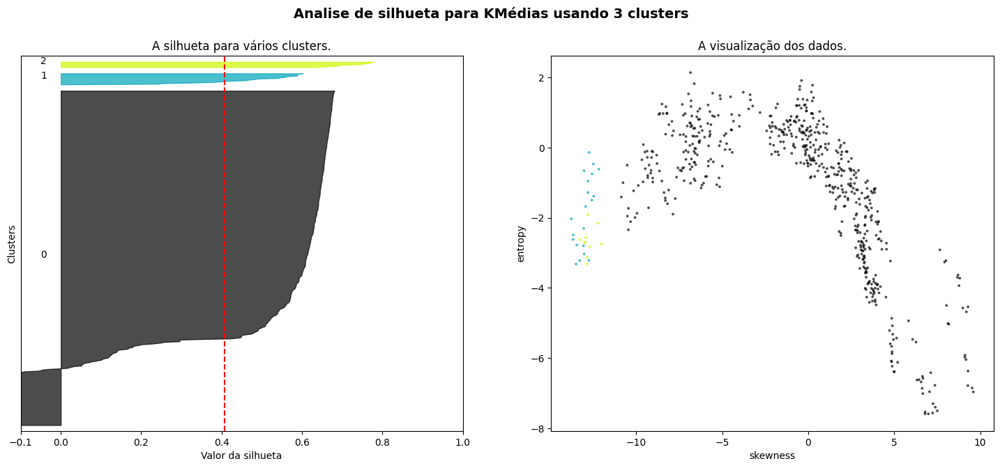

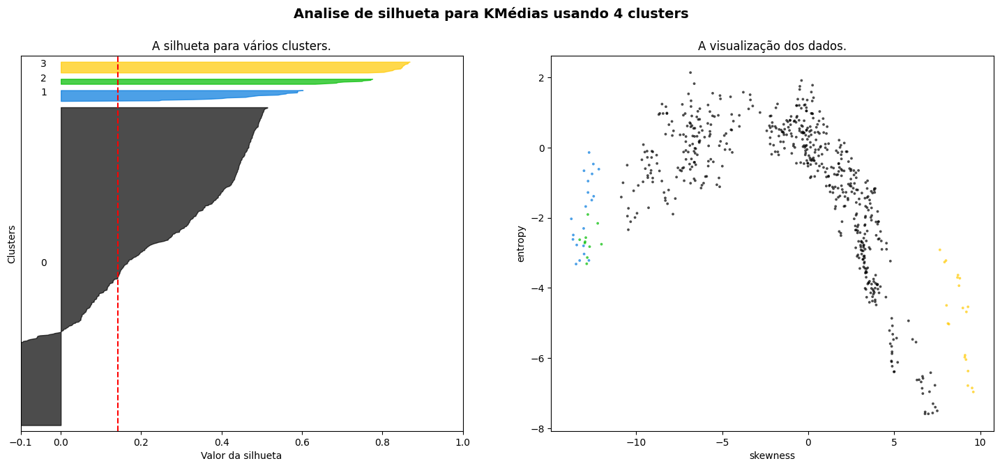

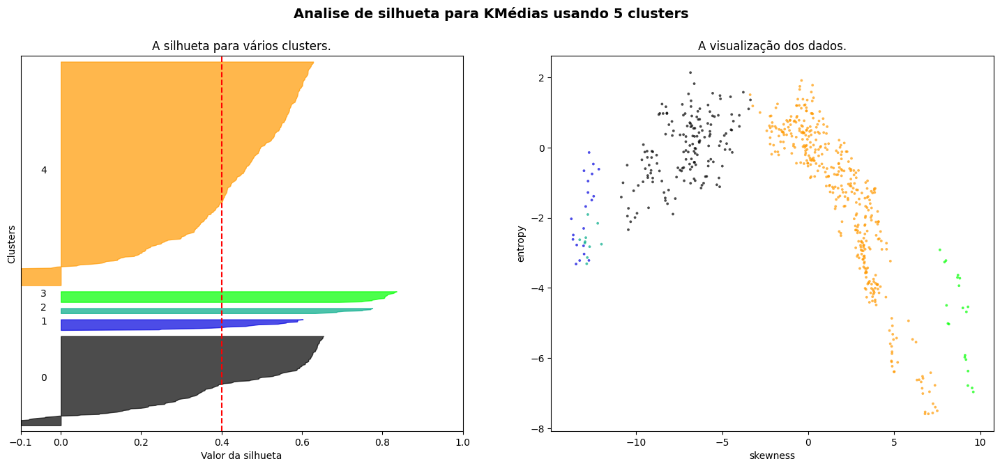

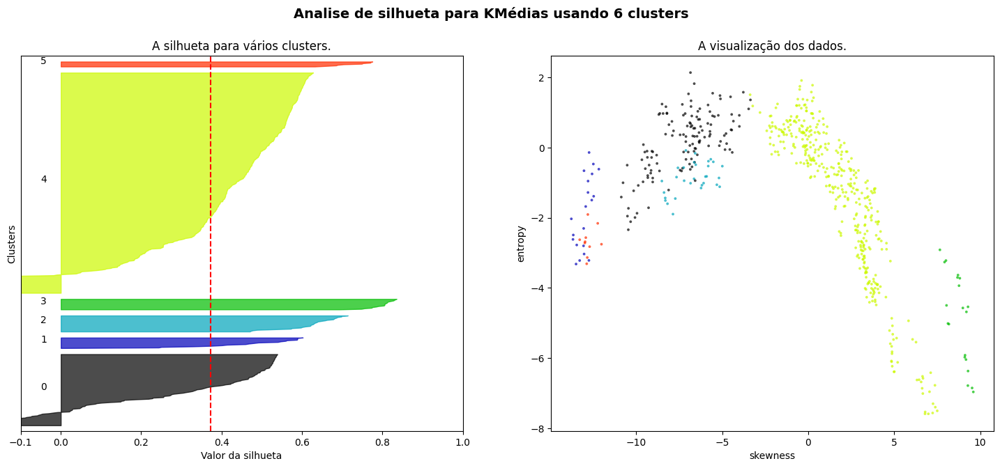

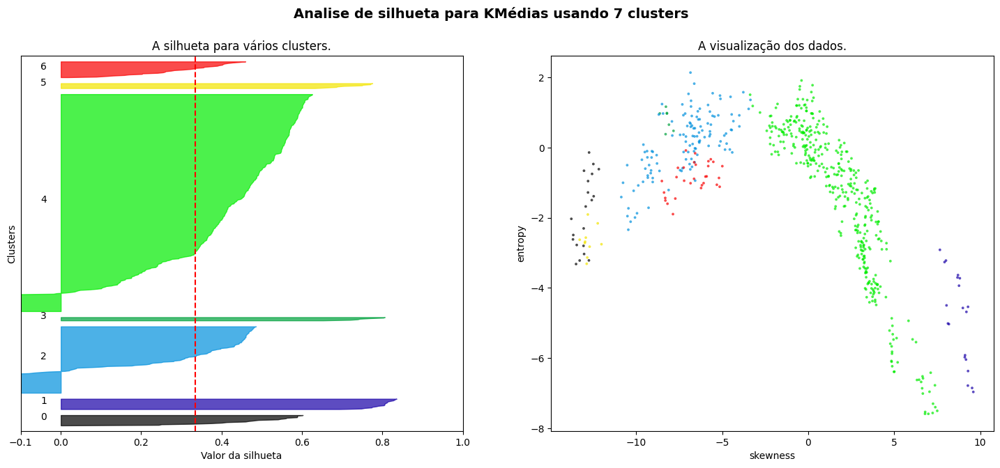

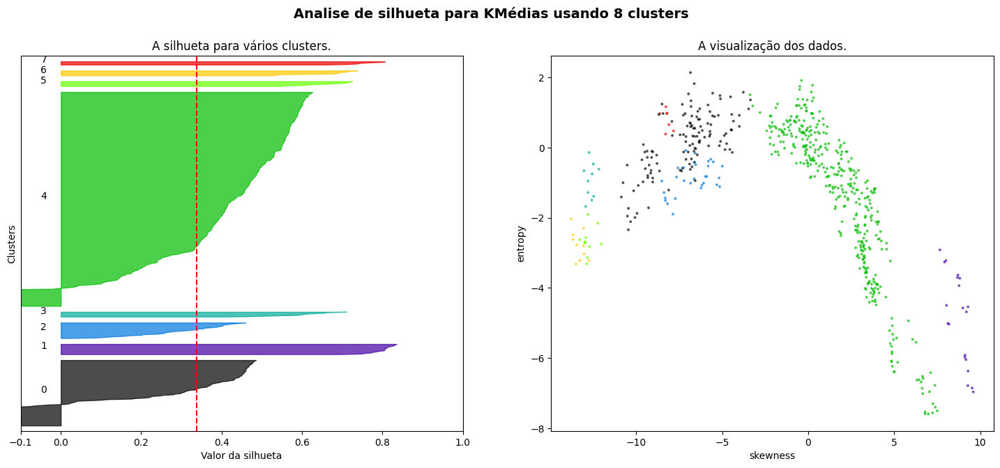

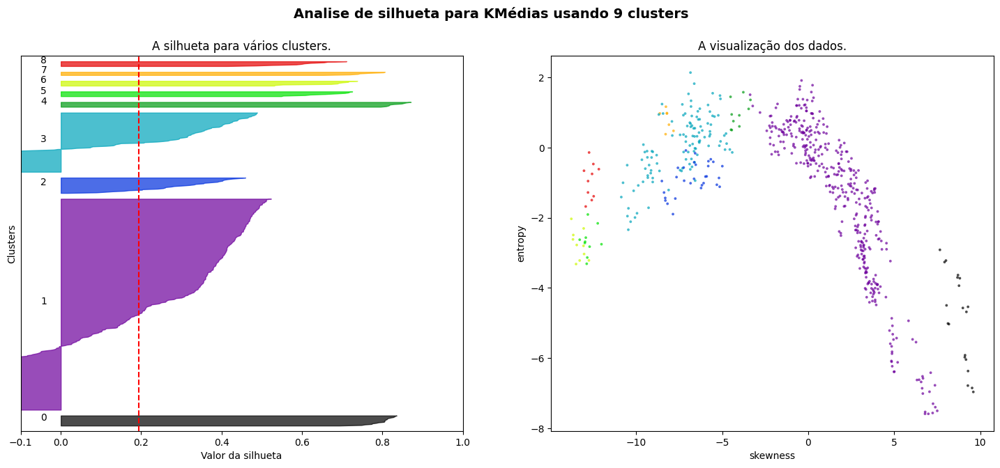

In [ ]:
siluetteFunction(data, 'skewness', 'entropy')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

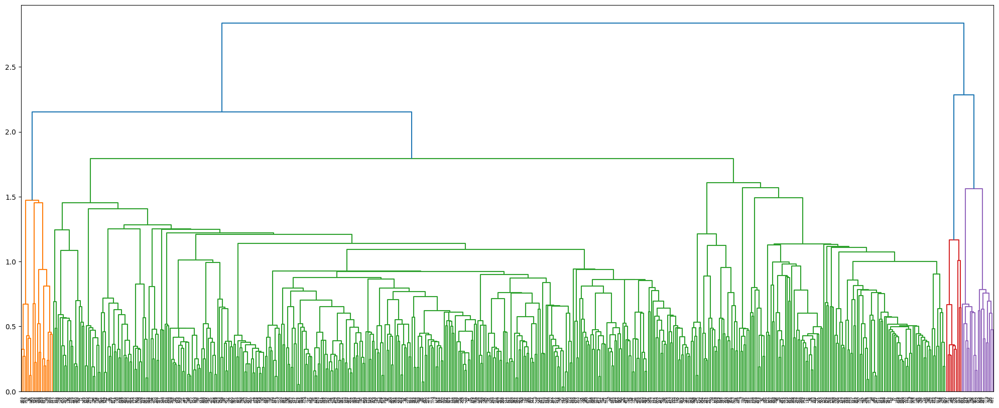

In [ ]:
singleLinkage = linkage(distances, 'single')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(singleLinkage)

####Complete Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='complete')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 1], localData[:, 3], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 1] e localData[:, 3] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.5382416974225374
Número de clusters = 3 A média de silhueta : 0.3985419954499646
Número de clusters = 4 A média de silhueta : 0.4013706540345816
Número de clusters = 5 A média de silhueta : 0.3949138213775166
Número de clusters = 6 A média de silhueta : 0.36993808483884466
Número de clusters = 7 A média de silhueta : 0.3837208053577608
Número de clusters = 8 A média de silhueta : 0.3944089280991976
Número de clusters = 9 A média de silhueta : 0.3807093578364096


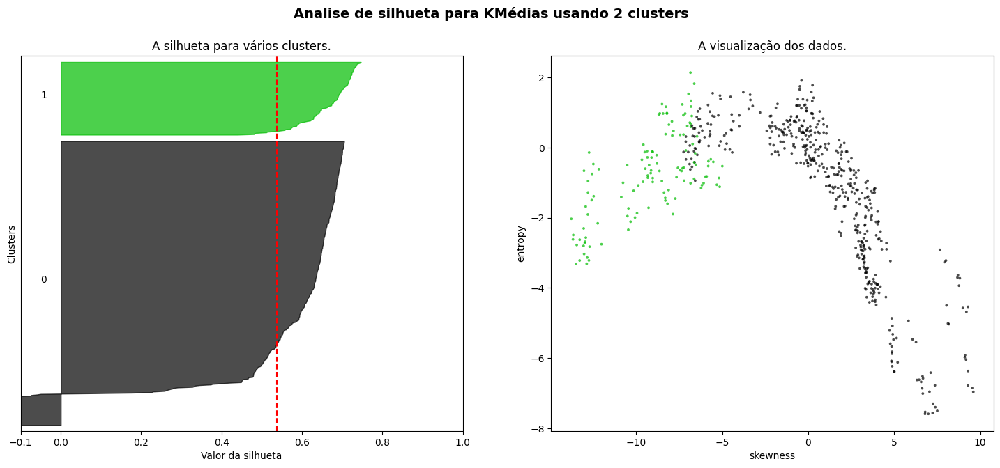

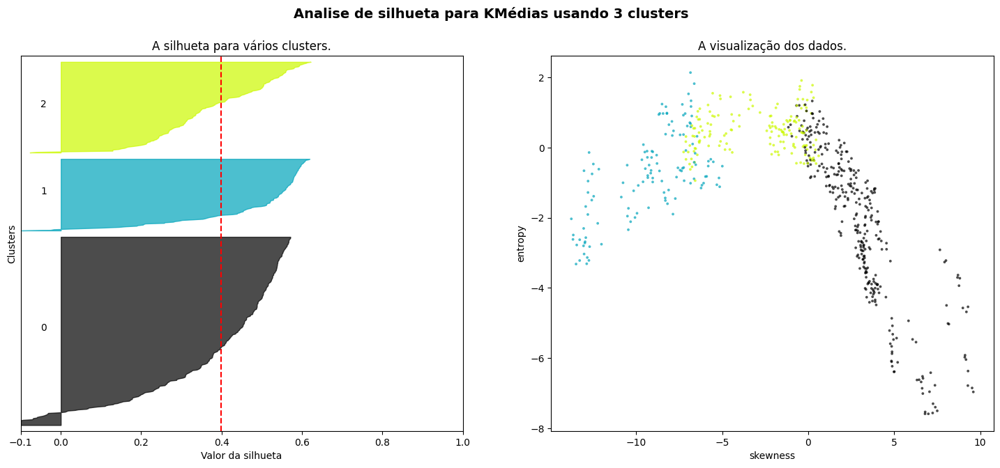

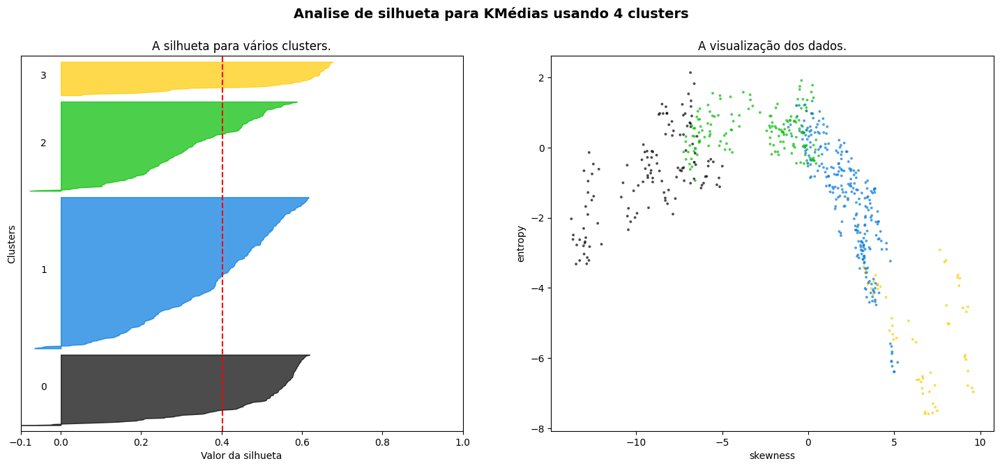

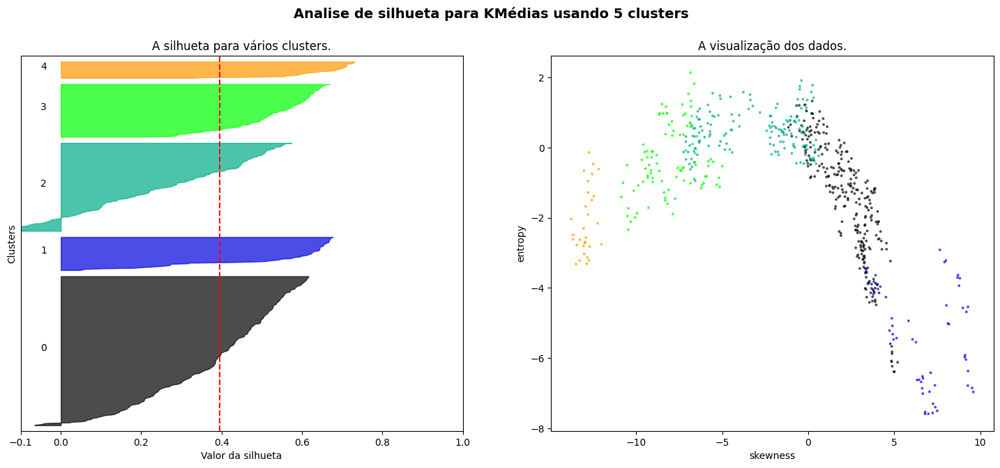

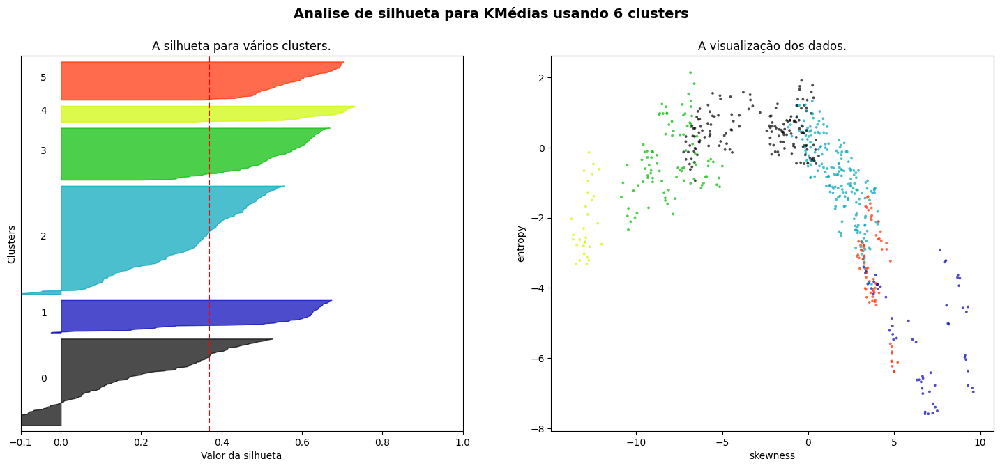

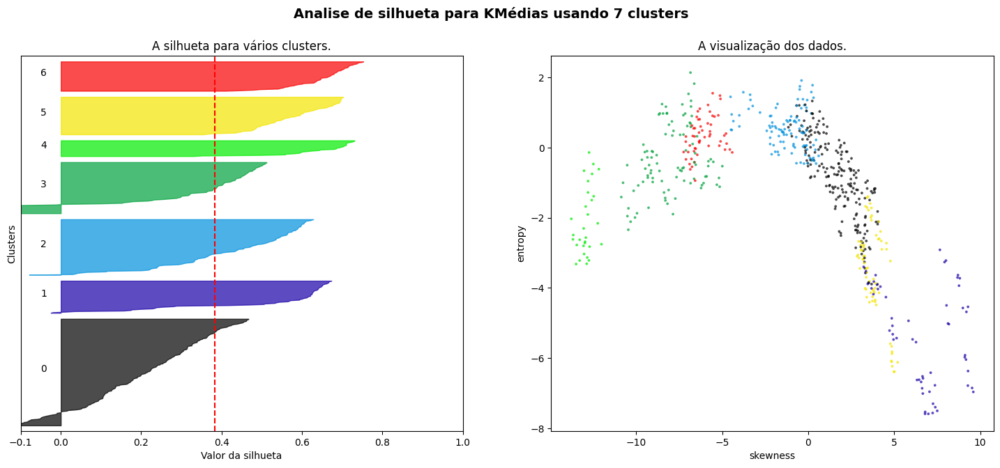

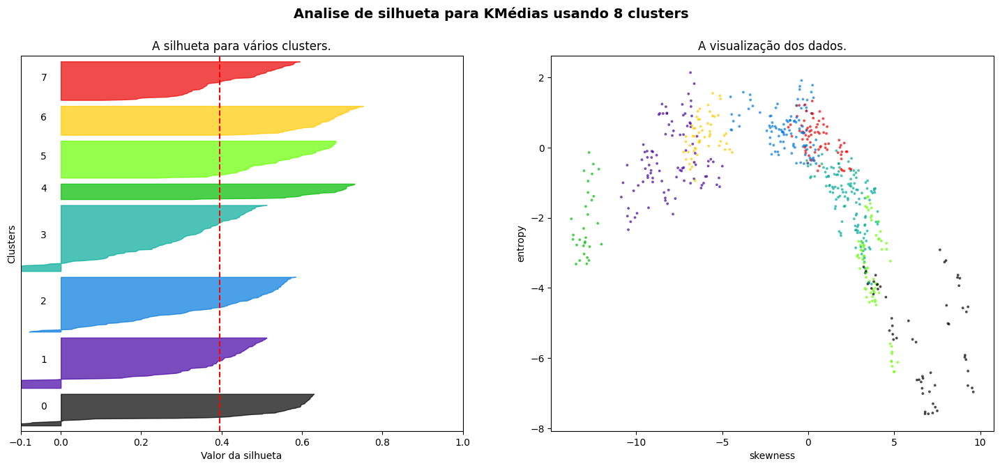

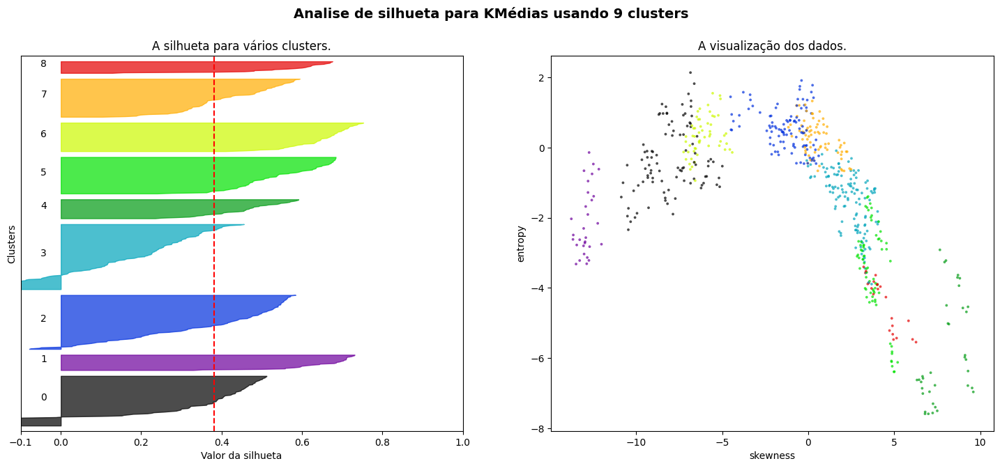

In [ ]:
siluetteFunction(data, 'skewness', 'entropy')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

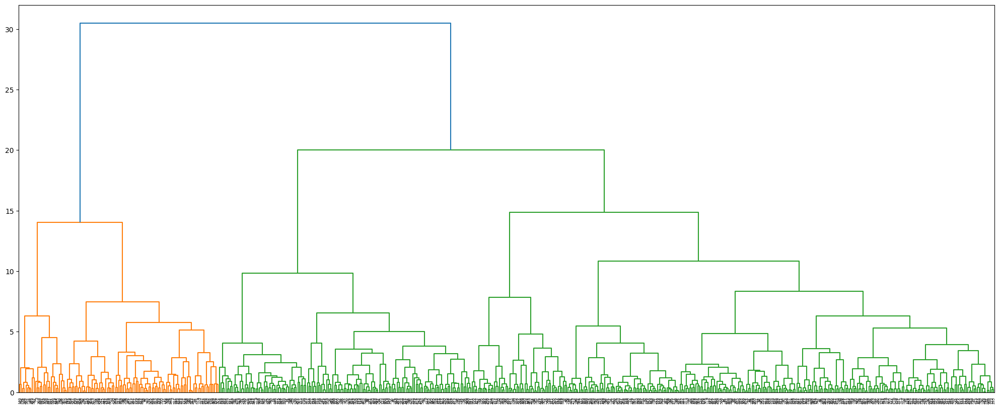

In [ ]:
completeLinkage = linkage(distances, 'complete')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

####Average Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='average')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 1], localData[:, 3], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 1] e localData[:, 3] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.6005247290409197
Número de clusters = 3 A média de silhueta : 0.5048563501514488
Número de clusters = 4 A média de silhueta : 0.4778982024007303
Número de clusters = 5 A média de silhueta : 0.4239809013219491
Número de clusters = 6 A média de silhueta : 0.408216128114879
Número de clusters = 7 A média de silhueta : 0.40186059319719325
Número de clusters = 8 A média de silhueta : 0.37990464862902085
Número de clusters = 9 A média de silhueta : 0.3492590559120995


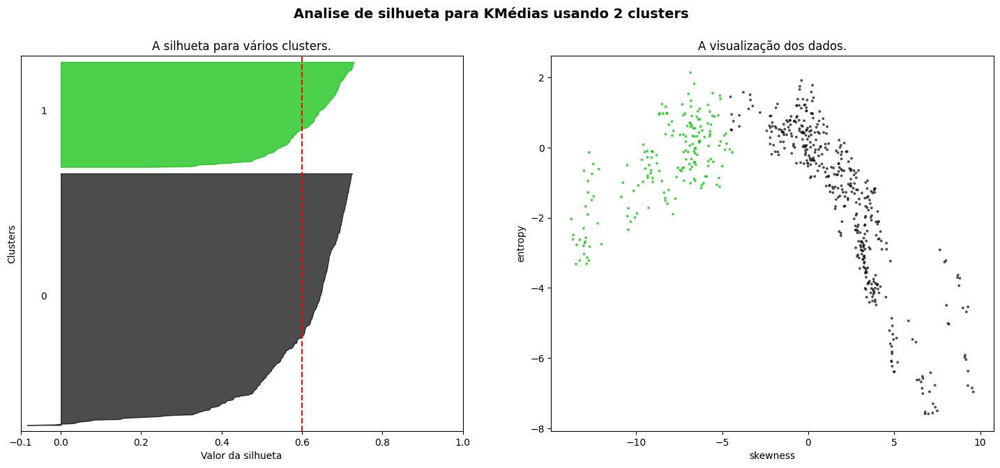

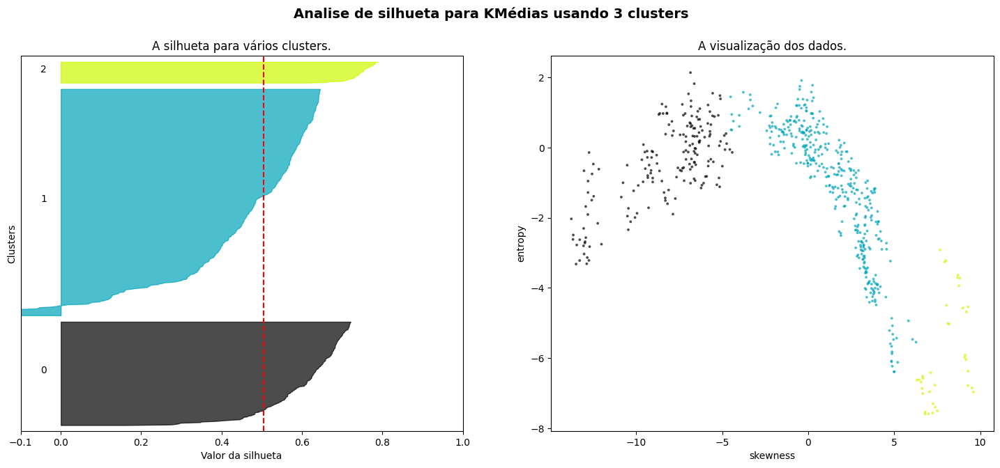

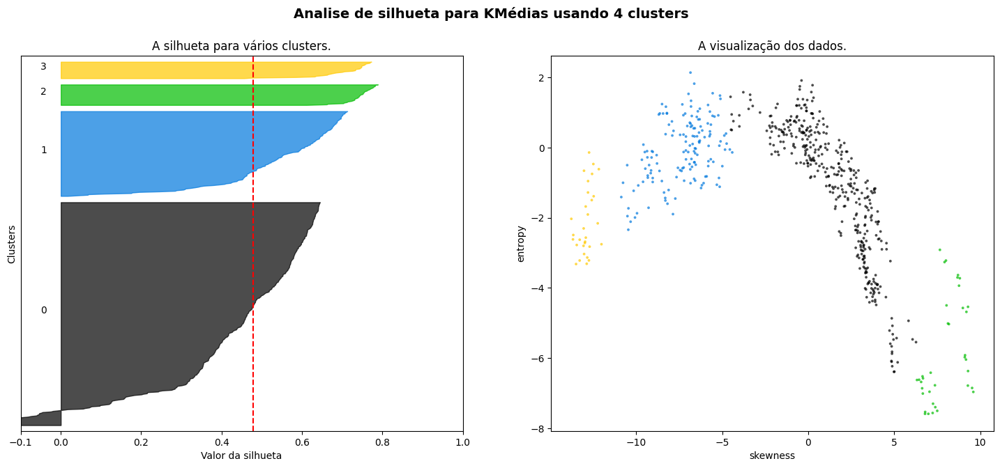

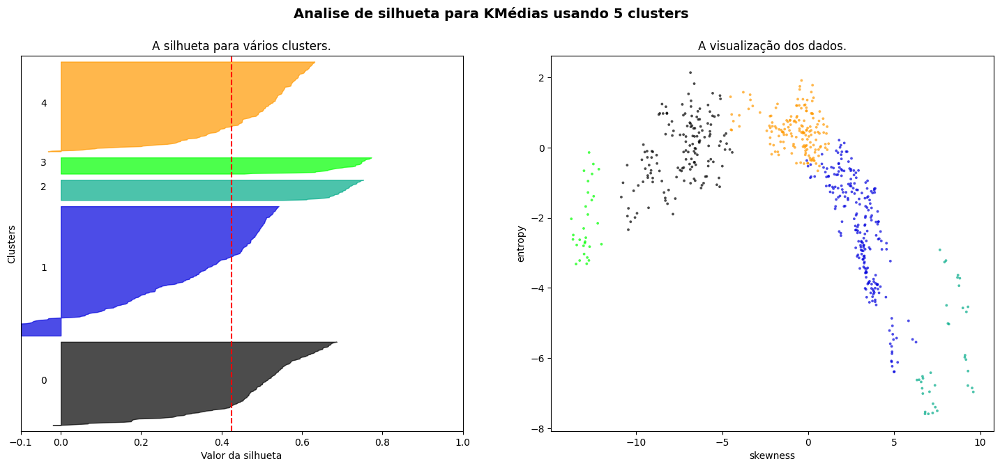

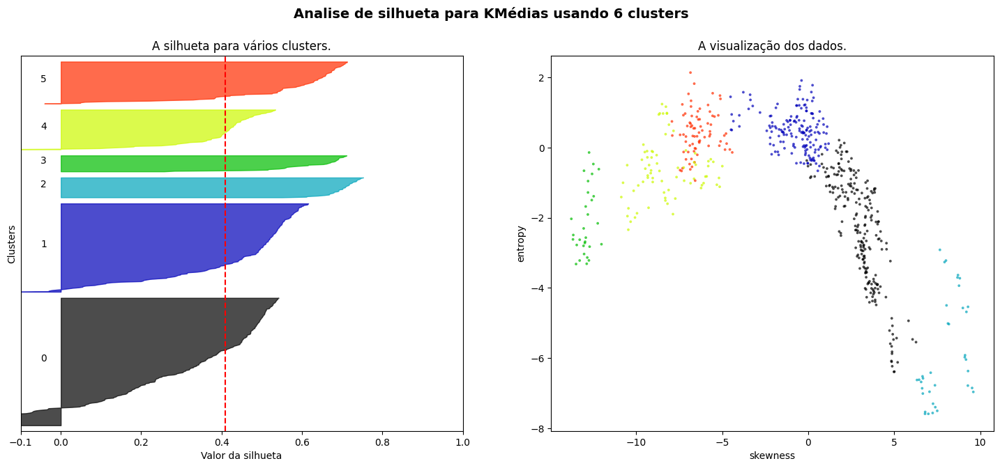

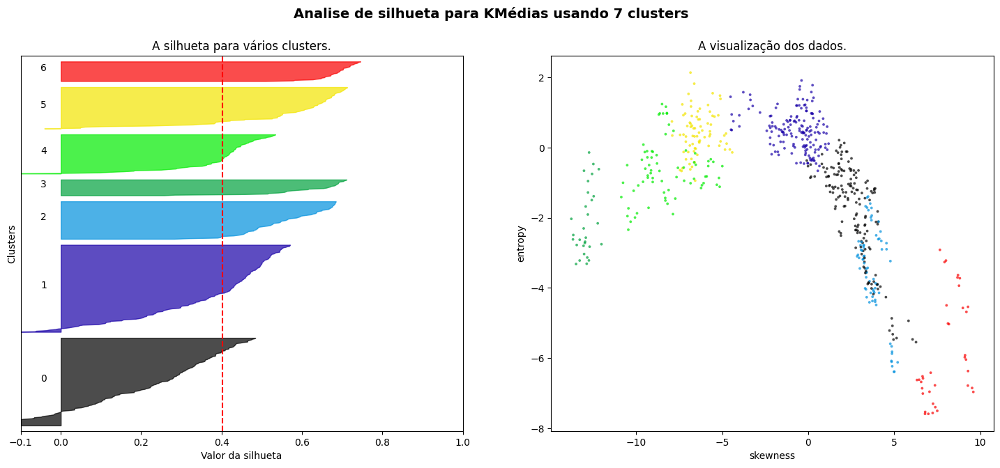

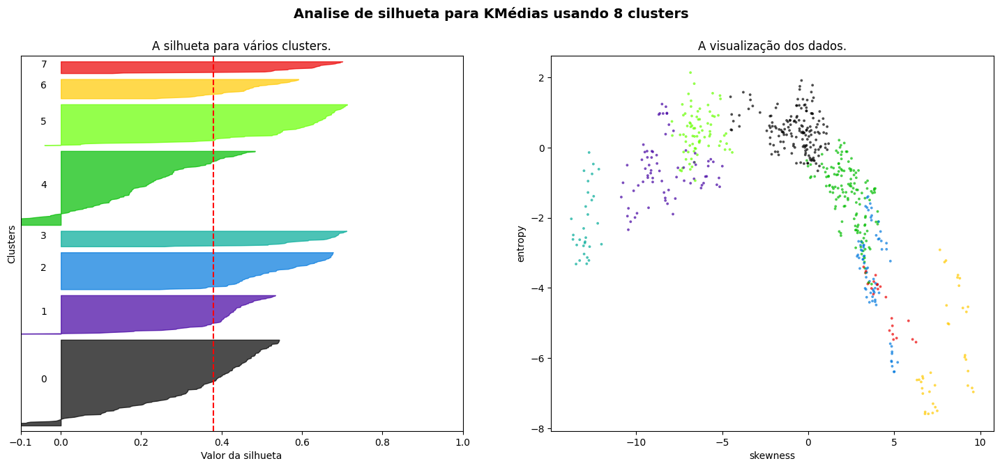

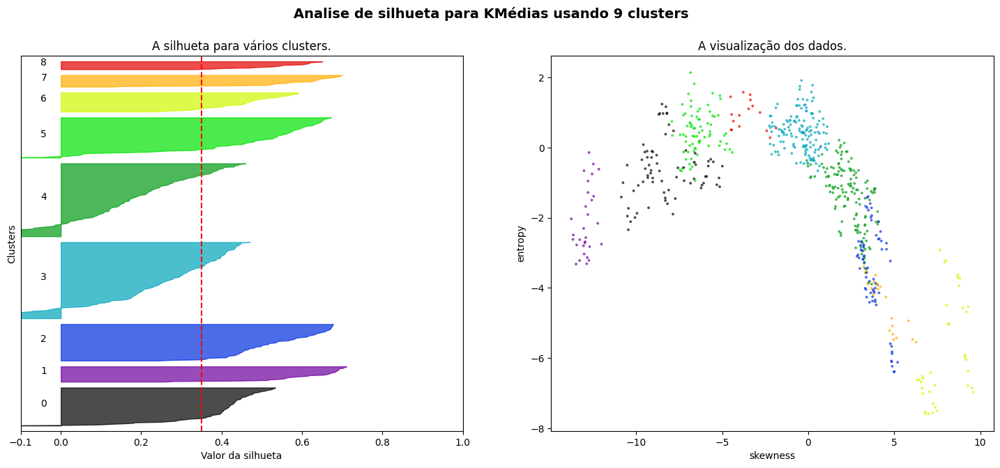

In [ ]:
siluetteFunction(data, 'skewness', 'entropy')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

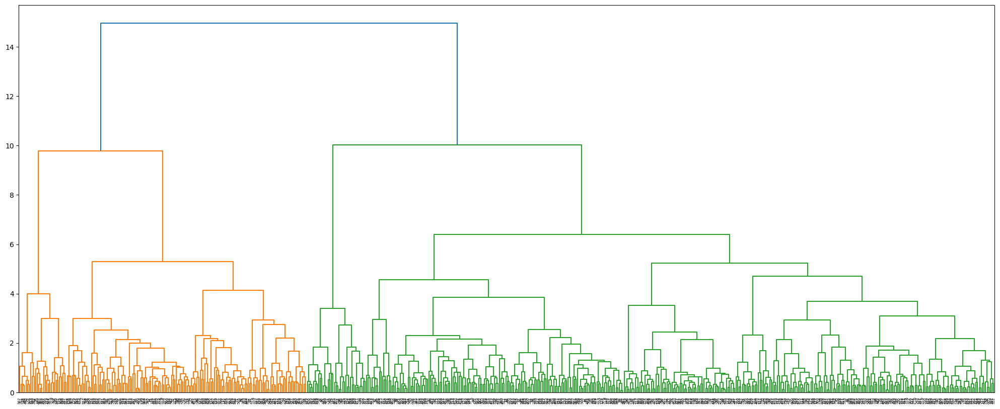

In [ ]:
completeLinkage = linkage(distances, 'average')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

####Centroid Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='ward')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 1], localData[:, 3], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 1] e localData[:, 3] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.6005247290409197
Número de clusters = 3 A média de silhueta : 0.382881128952769
Número de clusters = 4 A média de silhueta : 0.37976028414734786
Número de clusters = 5 A média de silhueta : 0.388835653606894
Número de clusters = 6 A média de silhueta : 0.40332192350996904
Número de clusters = 7 A média de silhueta : 0.4196423509292769
Número de clusters = 8 A média de silhueta : 0.42042576317083097
Número de clusters = 9 A média de silhueta : 0.398751352600779


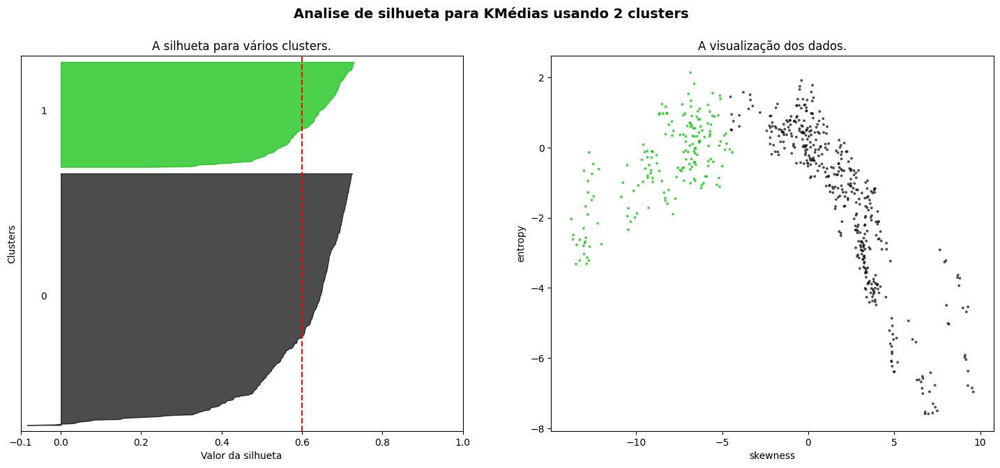

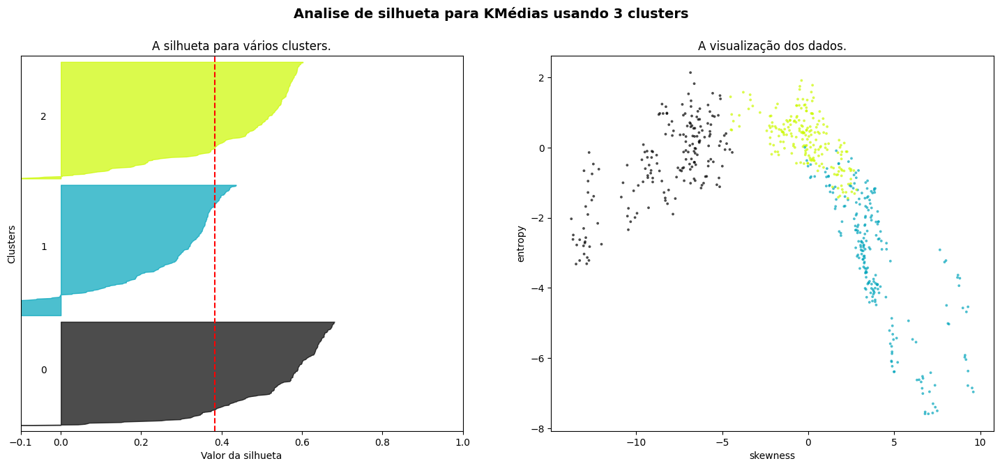

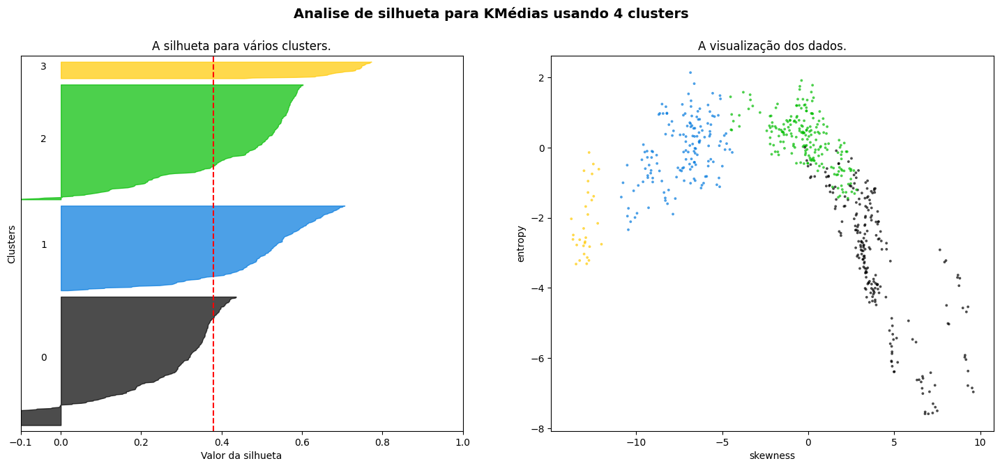

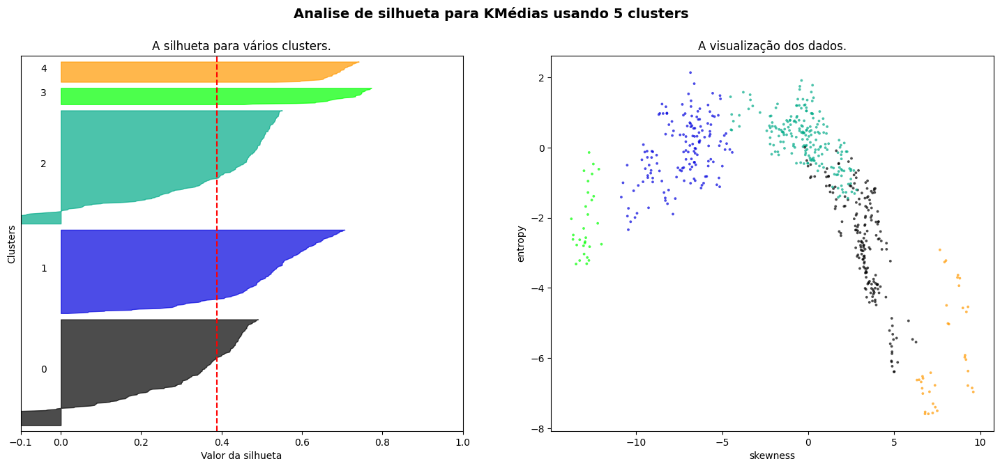

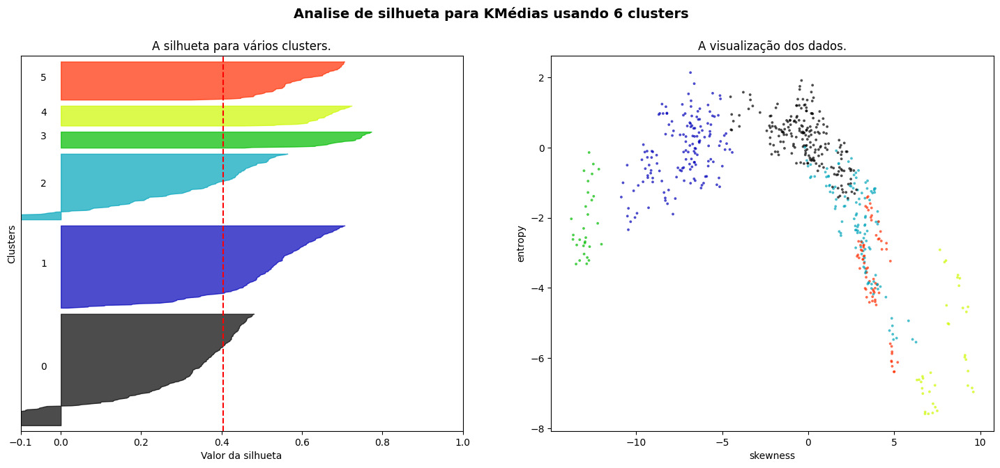

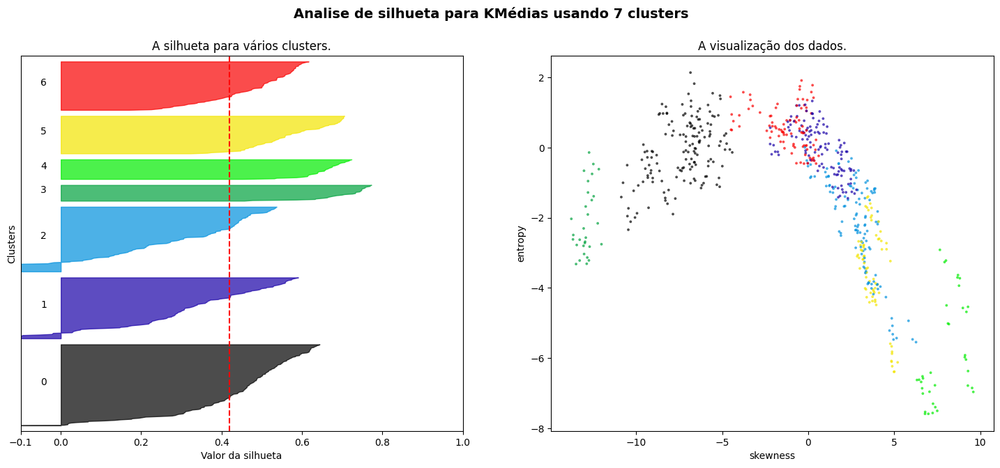

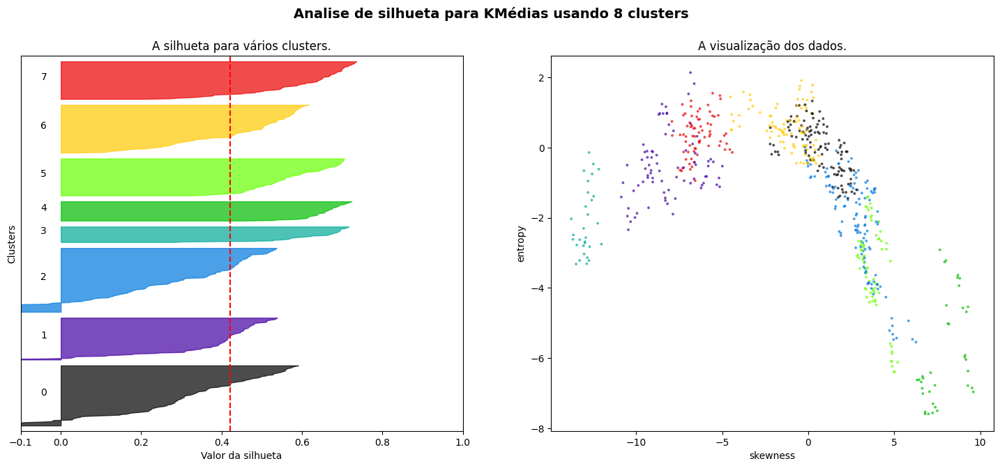

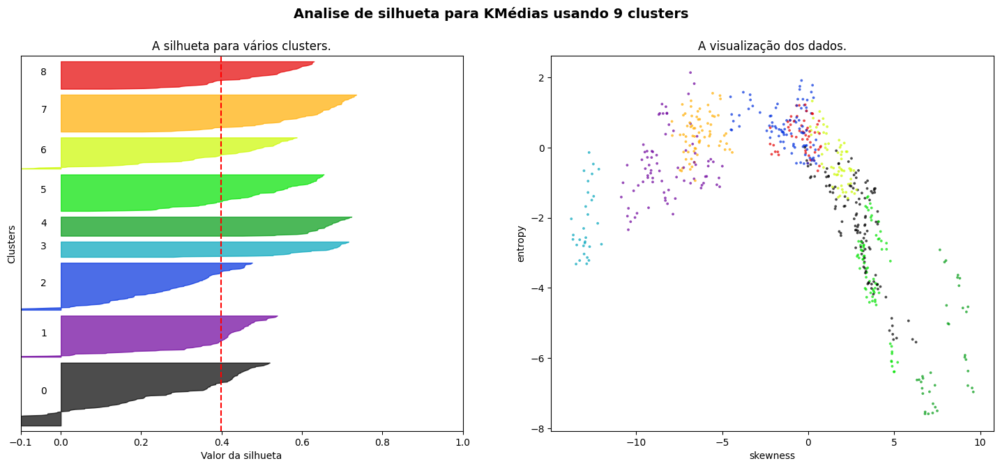

In [ ]:
siluetteFunction(data, 'skewness', 'entropy')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

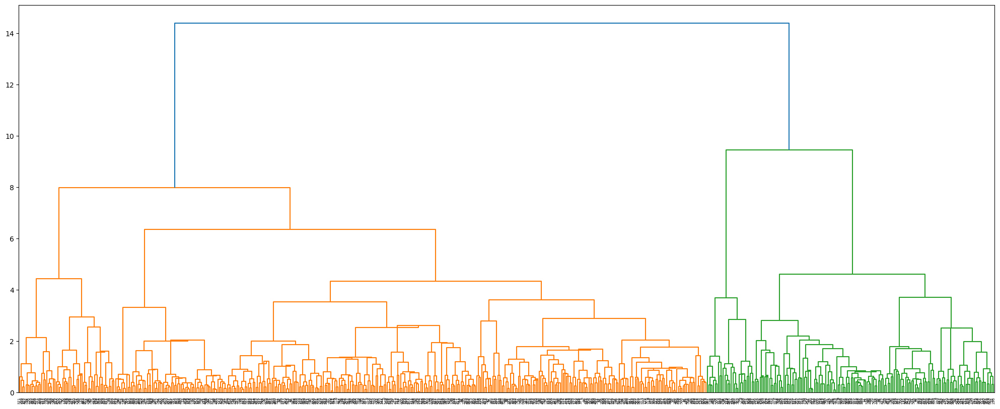

In [ ]:
completeLinkage = linkage(distances, 'centroid')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

## Base de dados real 2






###Vizualizando dados


Importando base de dados utilizada:

In [ ]:
cols2 = ['mcv', 'alkphos', 'sgpt', 'sgot', 'gammagt', 'drinks', 'selector']
df2 = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/liver-disorders/bupa.data", names=cols2)
df2

,mcv,alkphos,sgpt,sgot,gammagt,drinks,selector
0,85,92,45,27,31,0.0,1
1,85,64,59,32,23,0.0,2
2,86,54,33,16,54,0.0,2
3,91,78,34,24,36,0.0,2
4,87,70,12,28,10,0.0,2
...,...,...,...,...,...,...,...
340,99,75,26,24,41,12.0,1
341,96,69,53,43,203,12.0,2
342,98,77,55,35,89,15.0,1
343,91,68,27,26,14,16.0,1


Fazendo a diminuição do número de colunas através do TSNE. Nesse caso deixei a coluna 'selector' para fazer a análise para elementos com 'selector' = 1 e para elementos com 'selector' = 2

In [ ]:
df2_aux = TSNE().fit_transform(df2[['mcv', 'alkphos', 'sgpt', 'sgot', 'gammagt', 'drinks']])
df2_aux = pd.DataFrame(df2_aux, columns=['fattr', 'sattr'])
df2 = pd.concat([df2_aux, df2['selector']], axis=1)
df2

,fattr,sattr,selector
0,10.219653,6.958527,1
1,4.766580,-14.514249,2
2,4.518206,-7.751365,2
3,5.740938,1.277719,2
4,-12.177120,12.187437,2
...,...,...,...
340,6.813258,-0.637769,1
341,20.320423,-14.595362,2
342,14.884374,-10.103942,1
343,-9.615915,3.441660,1


Vizualizando elementos com 'selector' = 1:

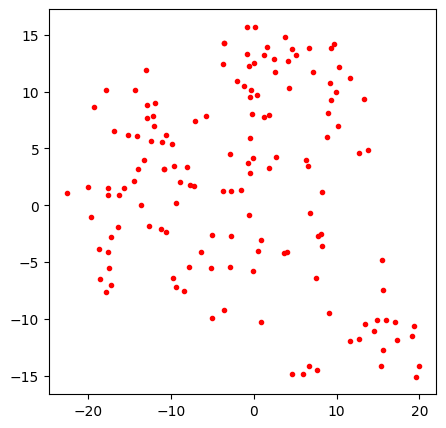

In [ ]:
plt.figure(figsize=(5, 5))
plt.plot(df2[df2['selector'] == 1]['fattr'],df2[df2['selector'] == 1]['sattr'],'.r')
plt.show()

Vizualizando elementos com 'selector' = 2

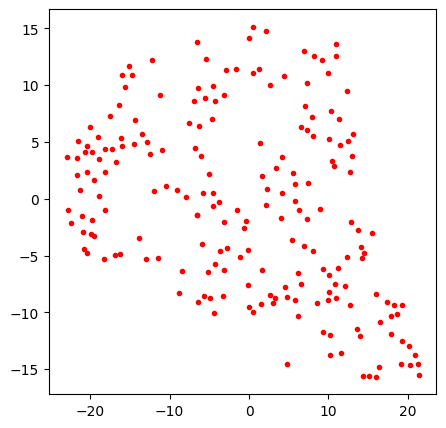

In [ ]:
plt.figure(figsize=(5, 5))
plt.plot(df2[df2['selector'] == 2]['fattr'],df2[df2['selector'] == 2]['sattr'],'.r')
plt.show()

###Selector 1



####KMédias

Selecionando linhas com selector 1:





In [ ]:
data = df2[df2['selector'] == 1][['fattr', 'sattr']].to_numpy()
data

array([[ 1.02196531e+01,  6.95852661e+00],
       [-1.52056456e+01,  6.16519403e+00],
       [-1.28944054e+01,  8.86186218e+00],
       [-1.56730862e+01,  1.50222504e+00],
       [-1.45079193e+01,  2.15878153e+00],
       [-1.99890537e+01,  1.64853454e+00],
       [-1.69440784e+01,  6.51252604e+00],
       [ 4.61303997e+00, -1.48210678e+01],
       [-2.84248888e-01,  1.01322966e+01],
       [-1.06500196e+01,  6.19386148e+00],
       [-3.74109650e+00,  1.24549246e+01],
       [-1.29211760e+01,  7.69210720e+00],
       [-7.90504515e-01,  1.33452206e+01],
       [ 1.37906036e+01,  4.86368799e+00],
       [ 9.65161324e+00,  1.42211018e+01],
       [-1.06519165e+01, -2.31646895e+00],
       [-1.78202114e+01, -7.62316418e+00],
       [-1.40461130e+01,  3.17359376e+00],
       [-7.11736012e+00,  7.40596342e+00],
       [ 1.59873028e+01, -1.00466709e+01],
       [-2.86730266e+00,  4.51254463e+00],
       [-1.76106777e+01, -4.13434696e+00],
       [-1.40896578e+01,  6.05984783e+00],
       [ 6.

Definido a função de silhueta:

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = KMeans(n_clusters=numberClusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(localData)
    silhouette_avg = silhouette_score(localData, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 0], localData[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 0] e localData[:, 1] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker="o", c="white", alpha=1, s=200, edgecolor="k",)
    # centers[:, 0] e centers[:, 1] Escolhe os valores das colunas 3 e 5 que compoem o vetor que representa os centroids

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Executando a função:

Número de clusters = 2 A média de silhueta : 0.40344846
Número de clusters = 3 A média de silhueta : 0.48915353
Número de clusters = 4 A média de silhueta : 0.45419973
Número de clusters = 5 A média de silhueta : 0.41196808
Número de clusters = 6 A média de silhueta : 0.4295617
Número de clusters = 7 A média de silhueta : 0.3965864
Número de clusters = 8 A média de silhueta : 0.3949766
Número de clusters = 9 A média de silhueta : 0.4175892


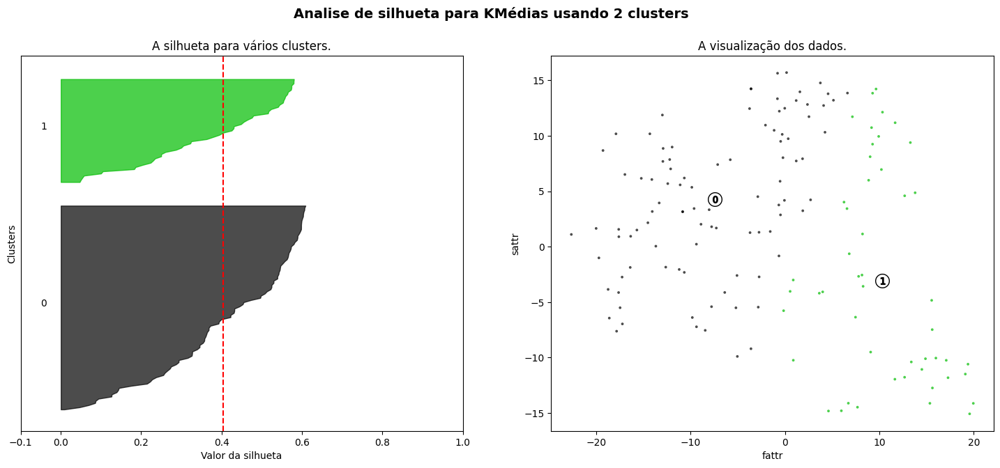

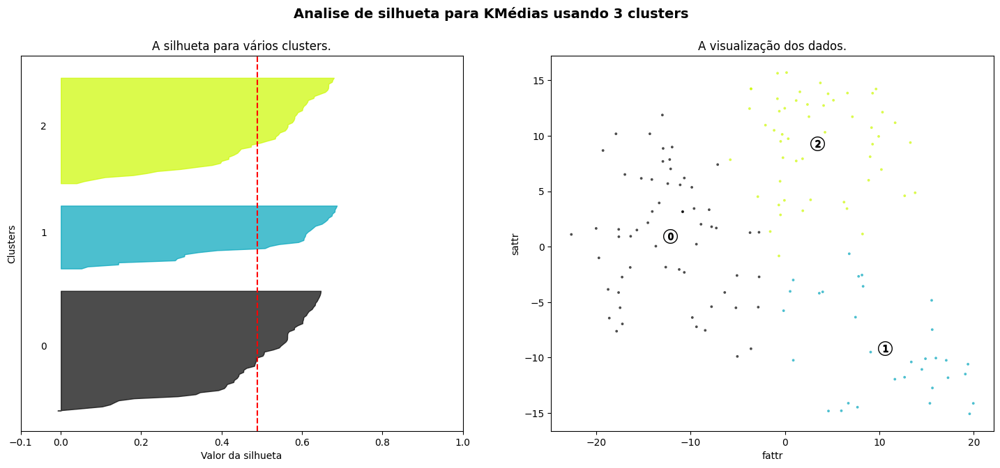

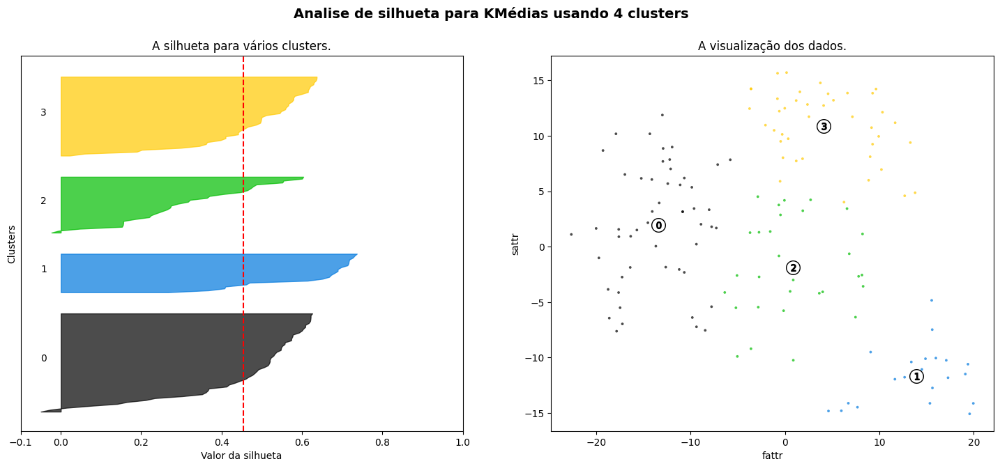

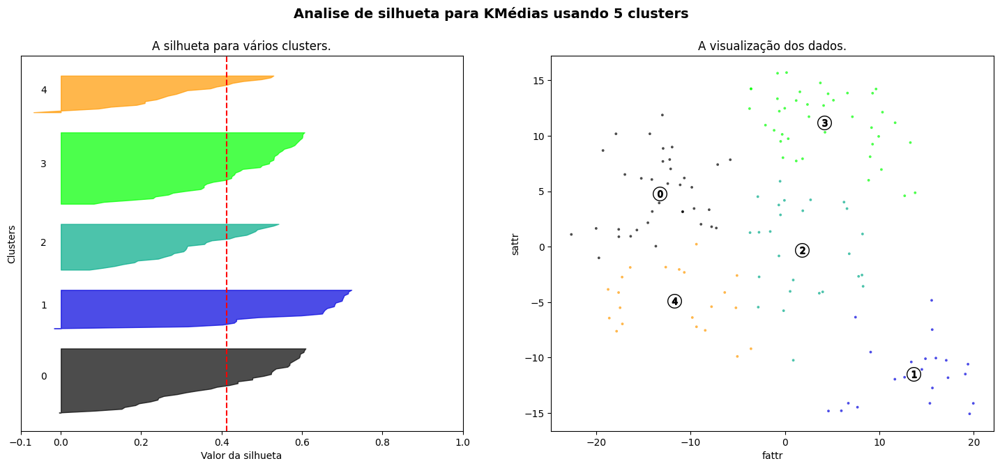

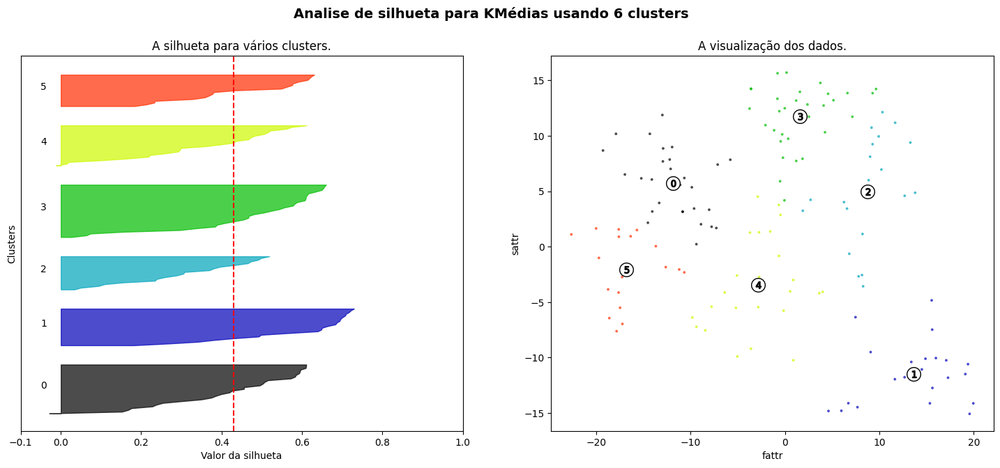

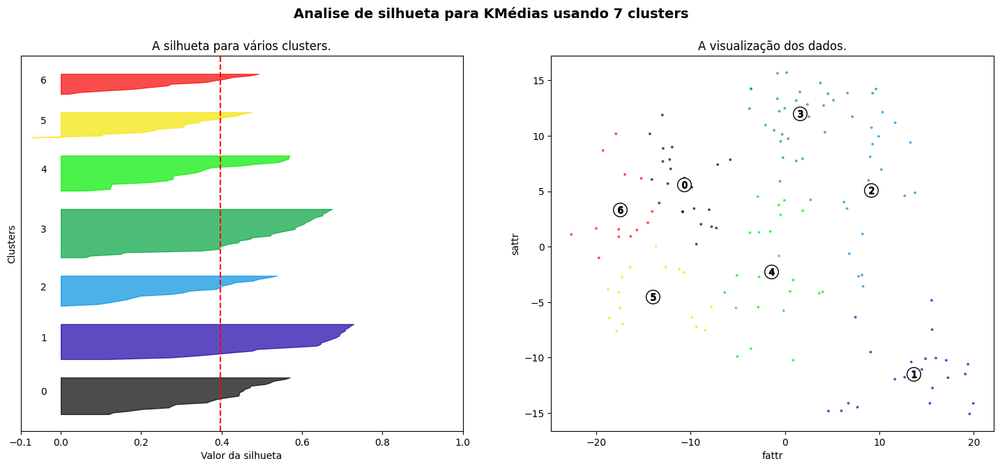

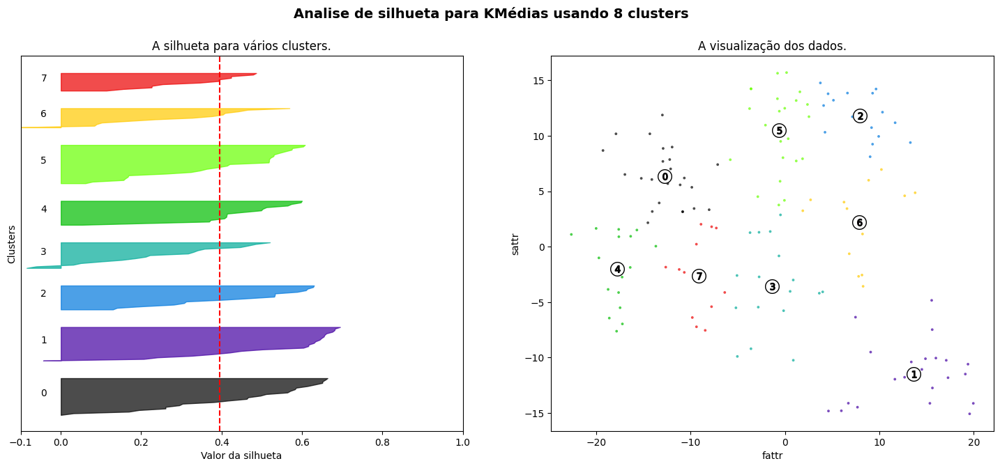

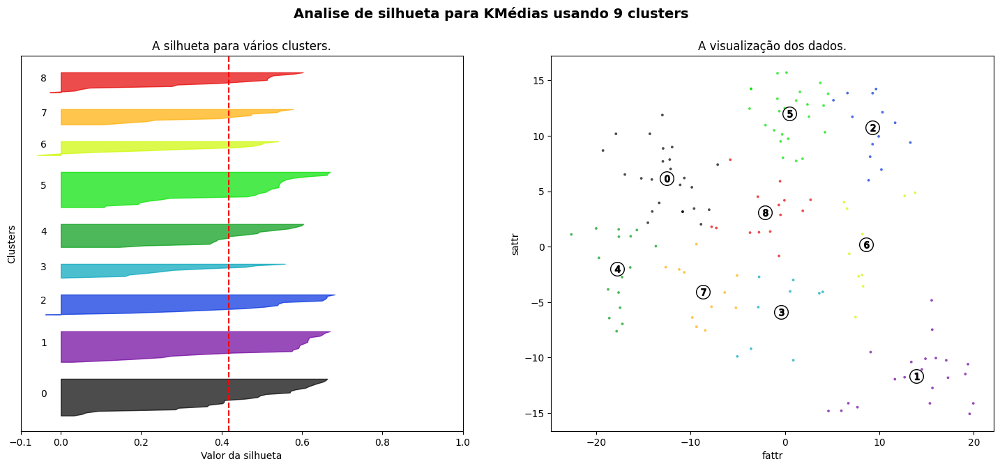

In [ ]:
siluetteFunction(data, 'fattr', 'sattr')

####Single Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='single')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 0], localData[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 0] e localData[:, 1] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.19171092
Número de clusters = 3 A média de silhueta : 0.018286686
Número de clusters = 4 A média de silhueta : -0.04322397
Número de clusters = 5 A média de silhueta : 0.15740727
Número de clusters = 6 A média de silhueta : 0.31686524
Número de clusters = 7 A média de silhueta : 0.2811415
Número de clusters = 8 A média de silhueta : 0.037251744
Número de clusters = 9 A média de silhueta : -0.021807432


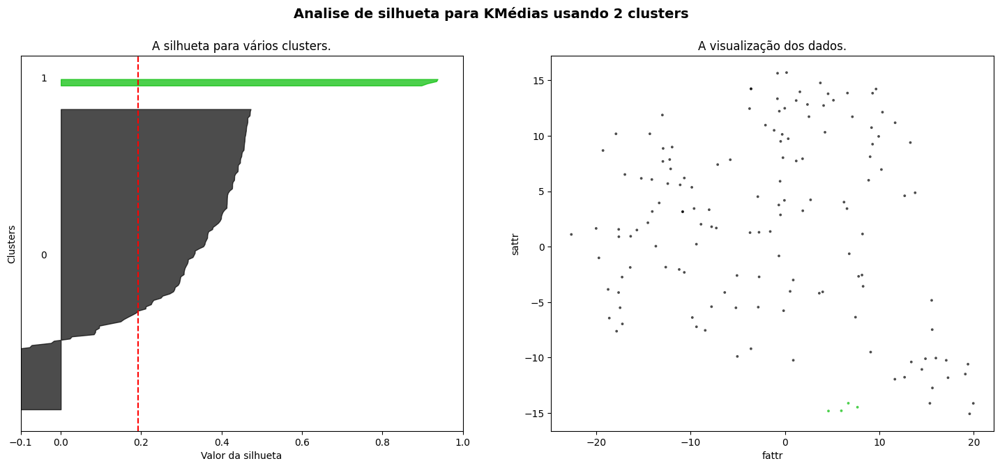

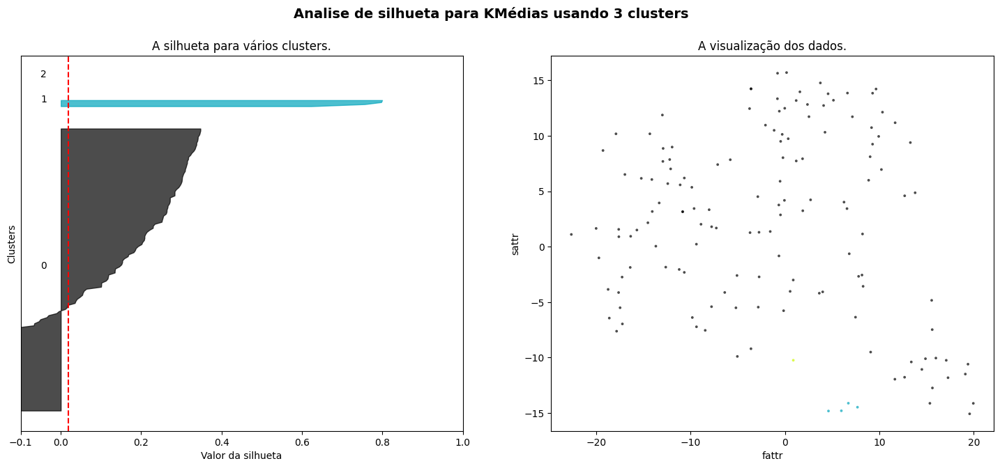

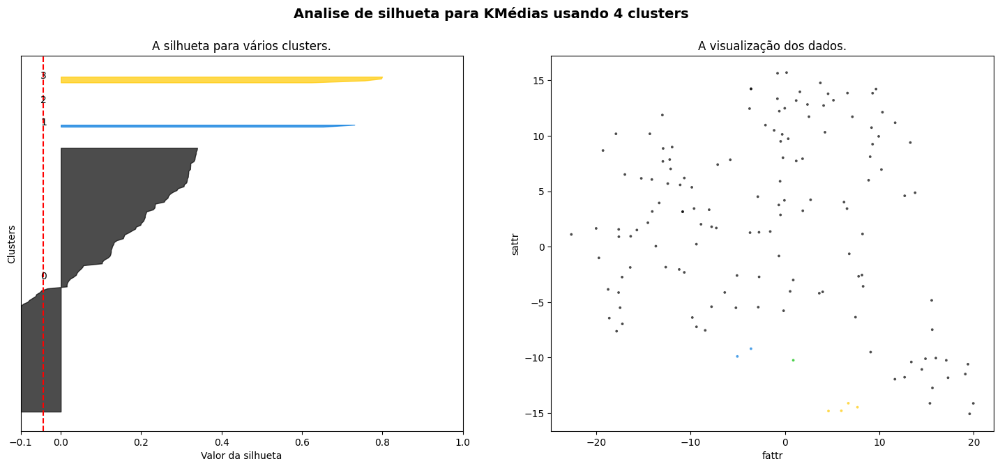

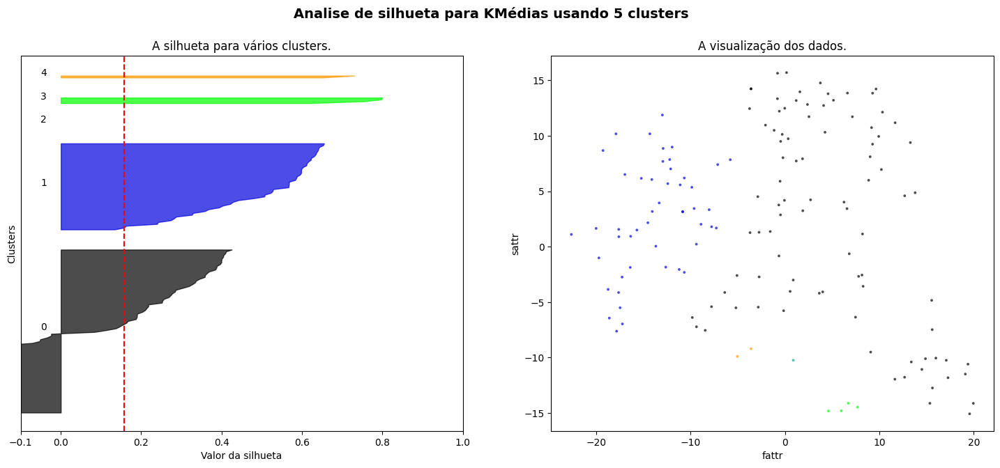

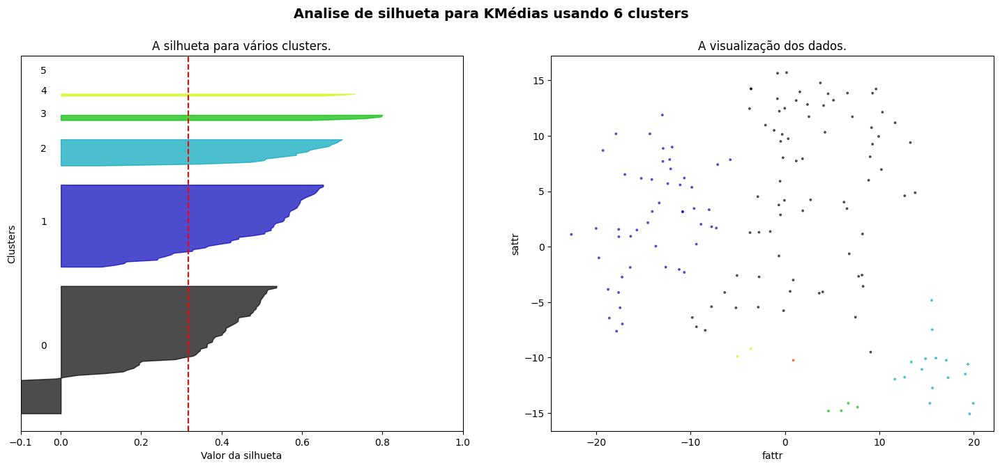

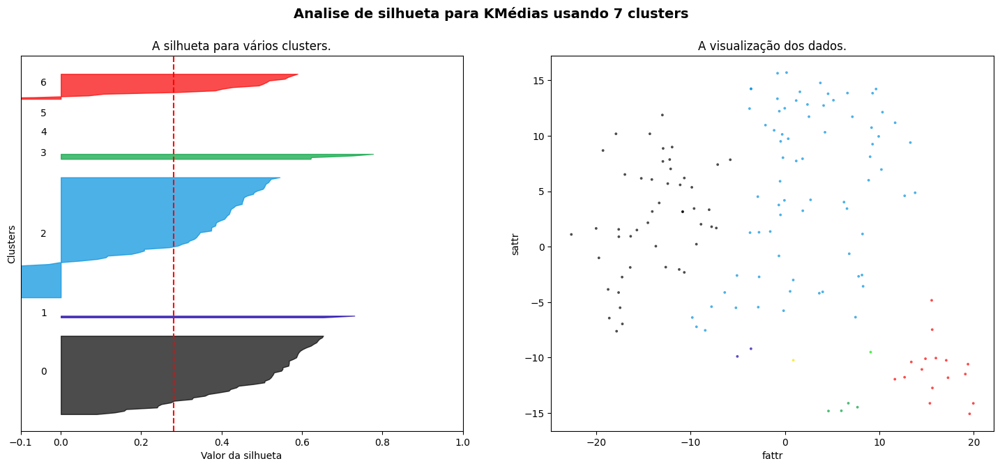

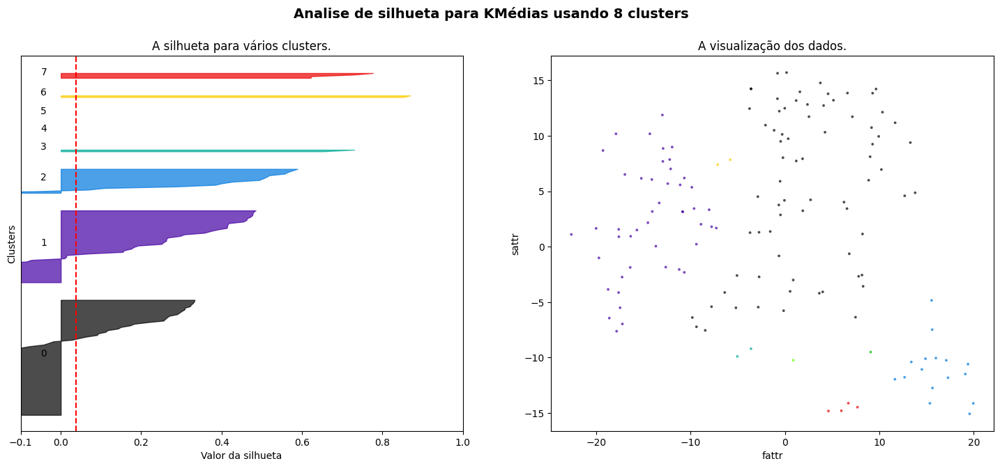

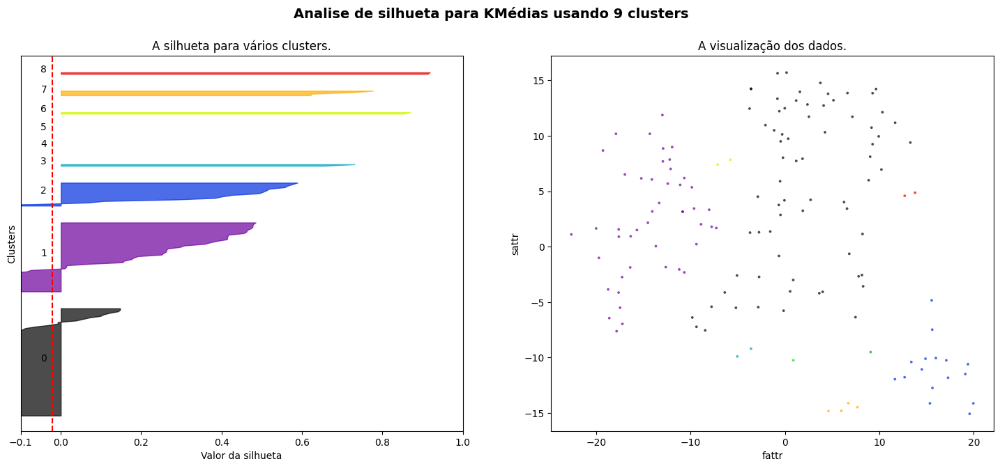

In [ ]:
siluetteFunction(data, 'fattr', 'sattr')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

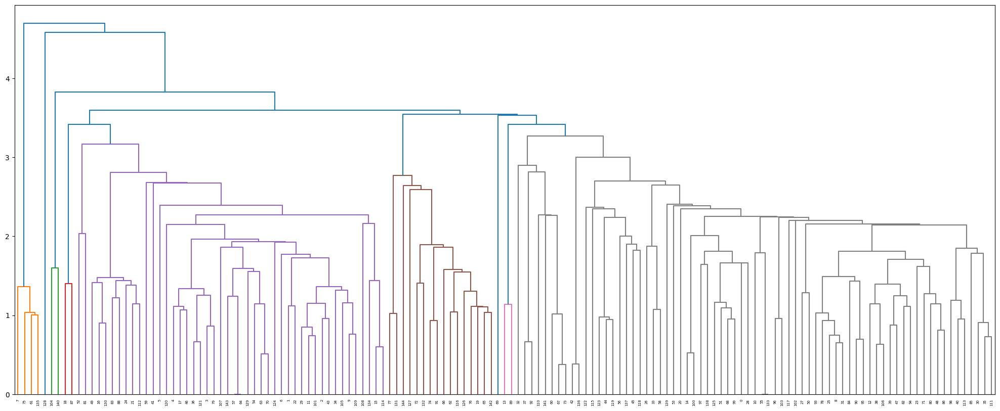

In [ ]:
singleLinkage = linkage(distances, 'single')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(singleLinkage)

####Complete Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='complete')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 0], localData[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 0] e localData[:, 1] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.44528
Número de clusters = 3 A média de silhueta : 0.45672628
Número de clusters = 4 A média de silhueta : 0.43602565
Número de clusters = 5 A média de silhueta : 0.35417995
Número de clusters = 6 A média de silhueta : 0.36888105
Número de clusters = 7 A média de silhueta : 0.38164657
Número de clusters = 8 A média de silhueta : 0.37698653
Número de clusters = 9 A média de silhueta : 0.35546085


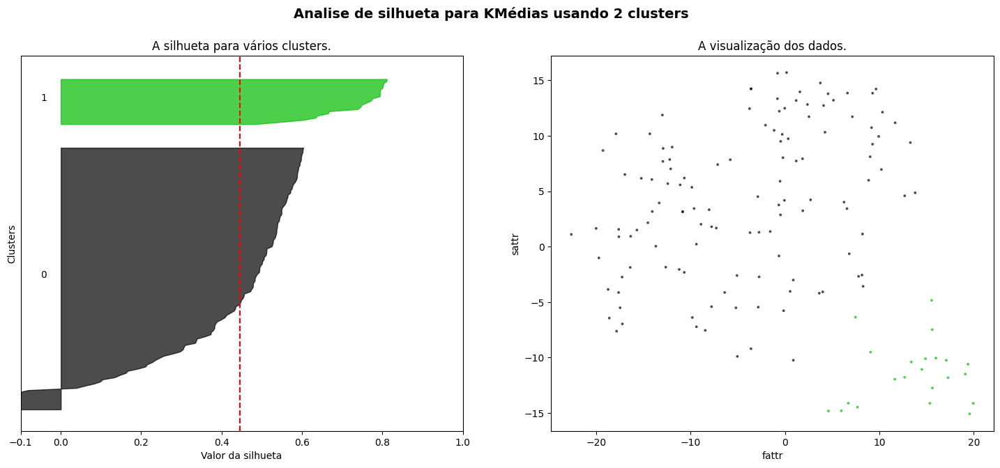

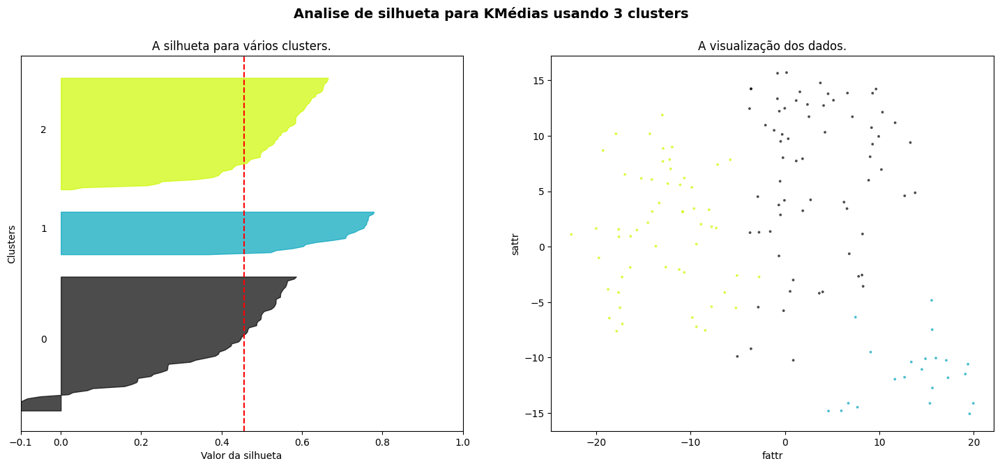

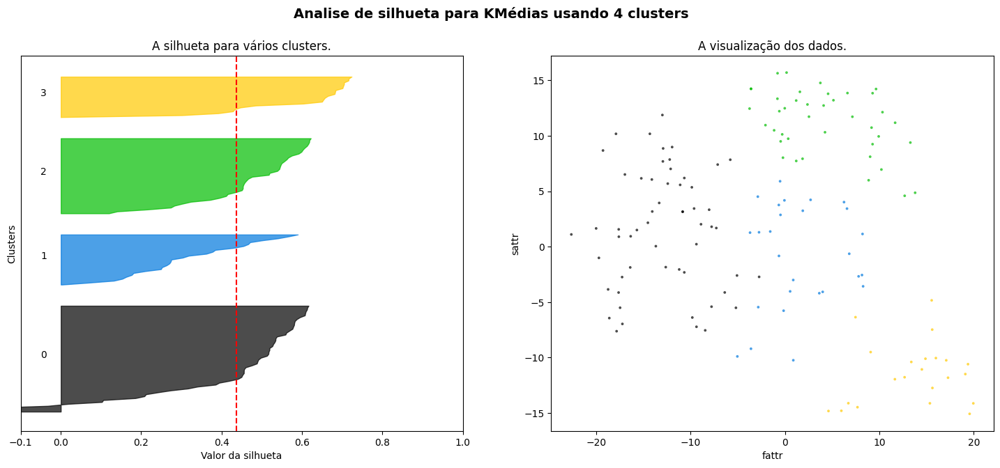

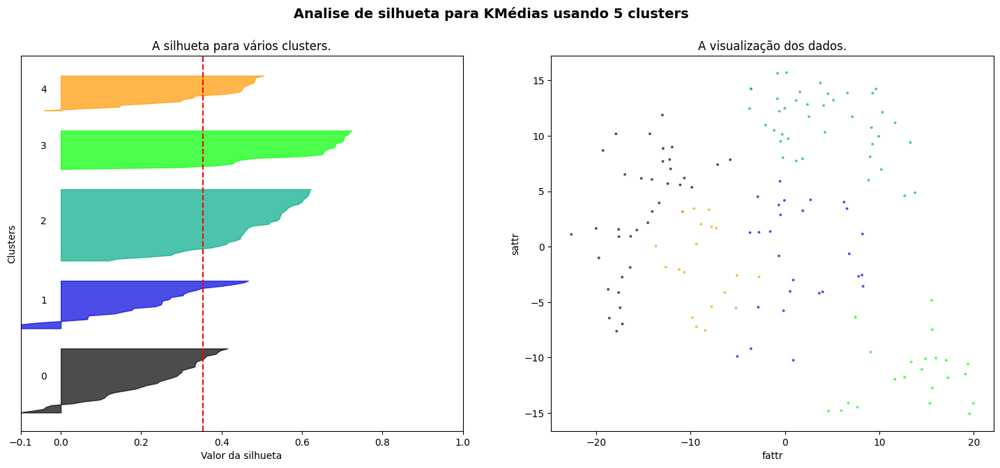

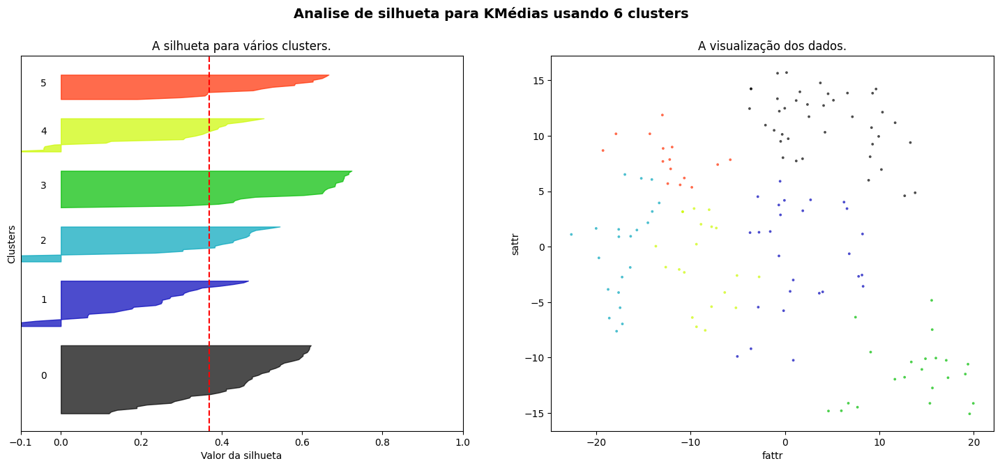

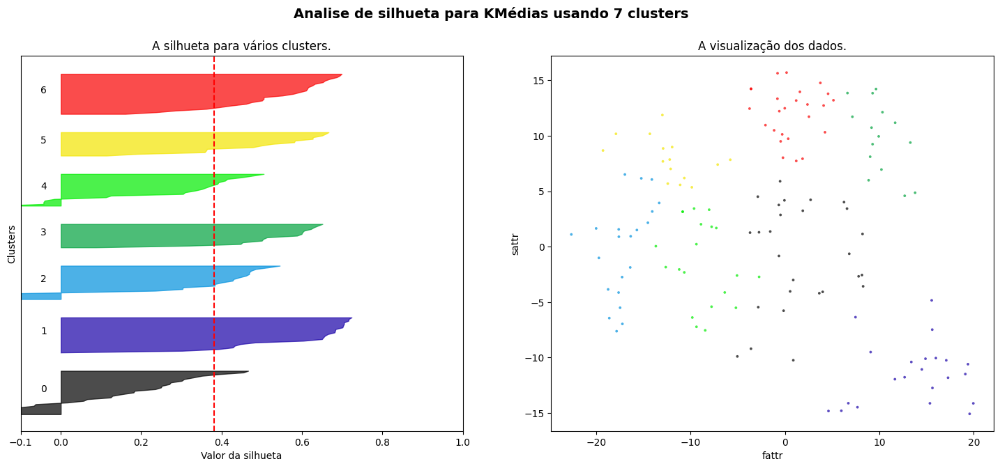

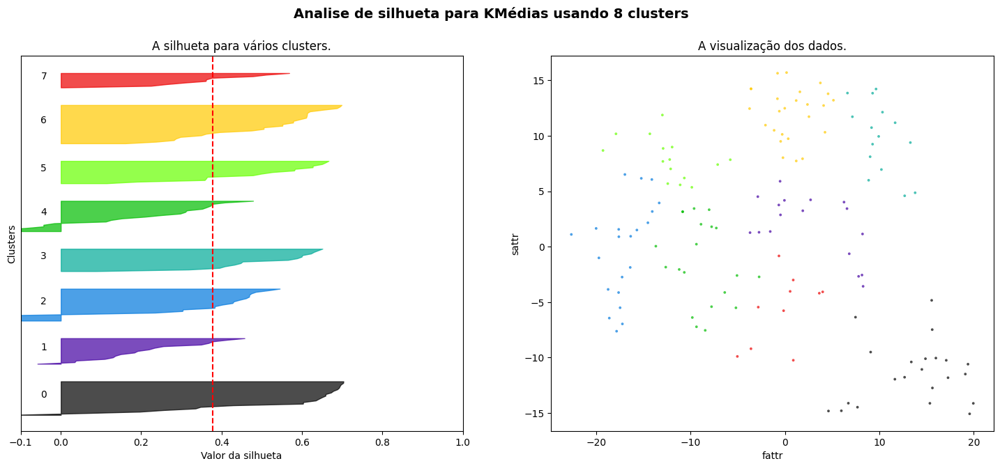

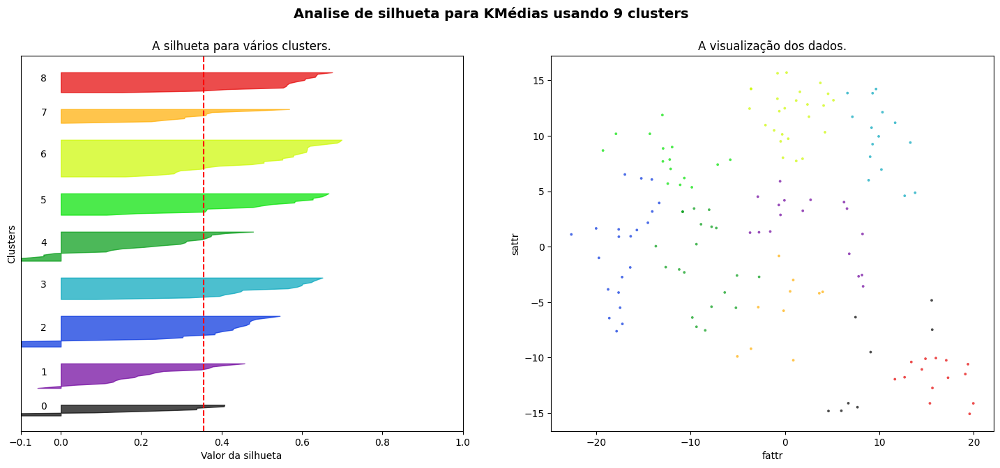

In [ ]:
siluetteFunction(data, 'fattr', 'sattr')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

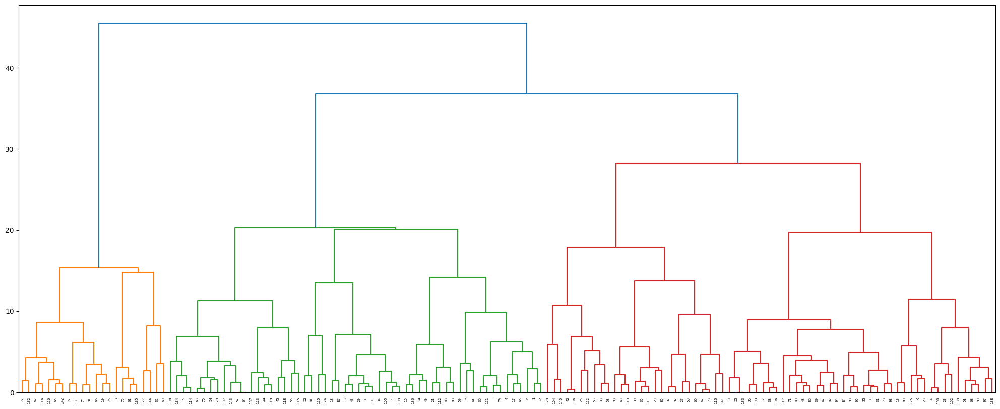

In [ ]:
completeLinkage = linkage(distances, 'complete')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

####Average Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='average')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 0], localData[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 0] e localData[:, 1] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.44031447
Número de clusters = 3 A média de silhueta : 0.4106631
Número de clusters = 4 A média de silhueta : 0.4527287
Número de clusters = 5 A média de silhueta : 0.39154983
Número de clusters = 6 A média de silhueta : 0.3866212
Número de clusters = 7 A média de silhueta : 0.38655934
Número de clusters = 8 A média de silhueta : 0.40009797
Número de clusters = 9 A média de silhueta : 0.41423404


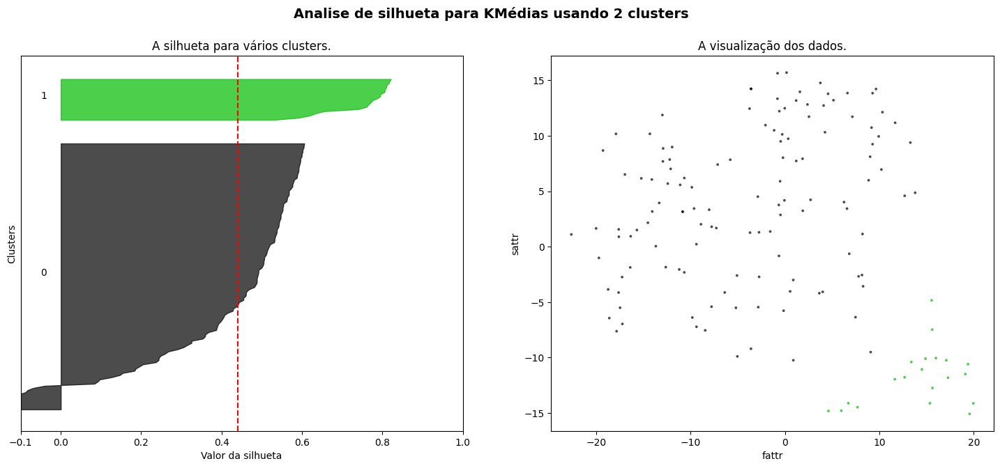

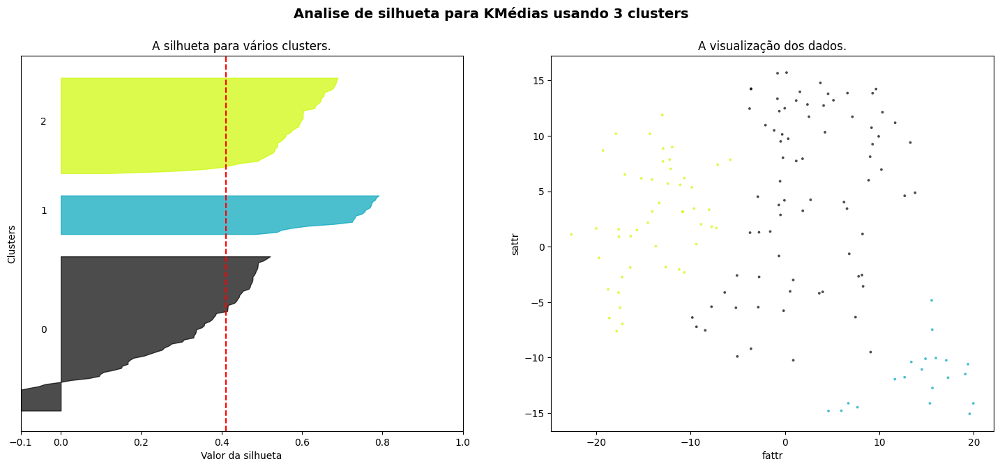

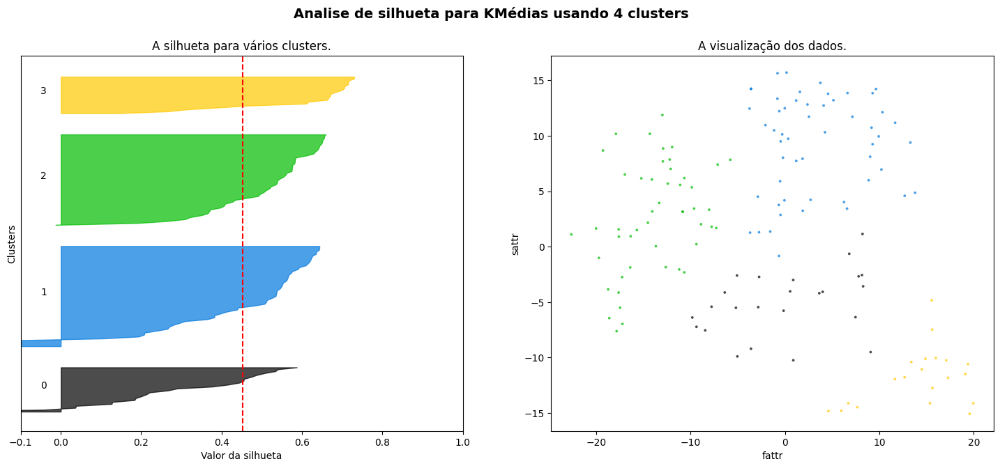

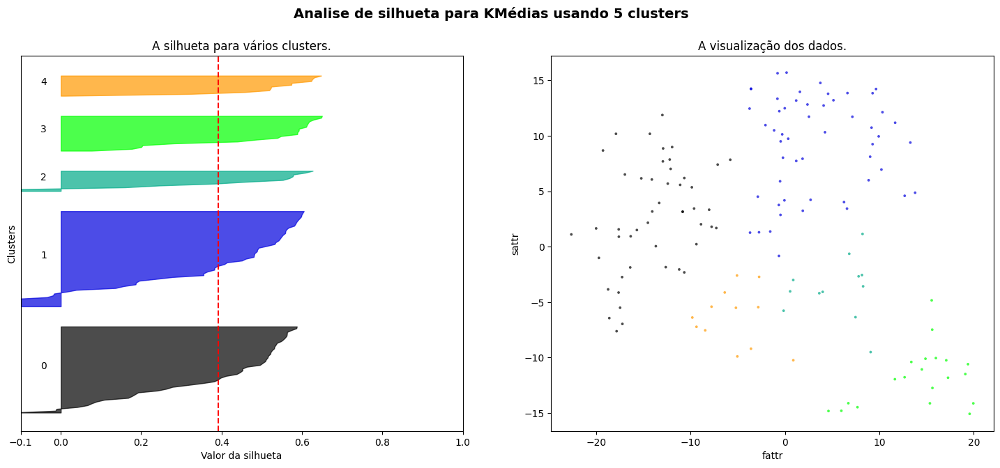

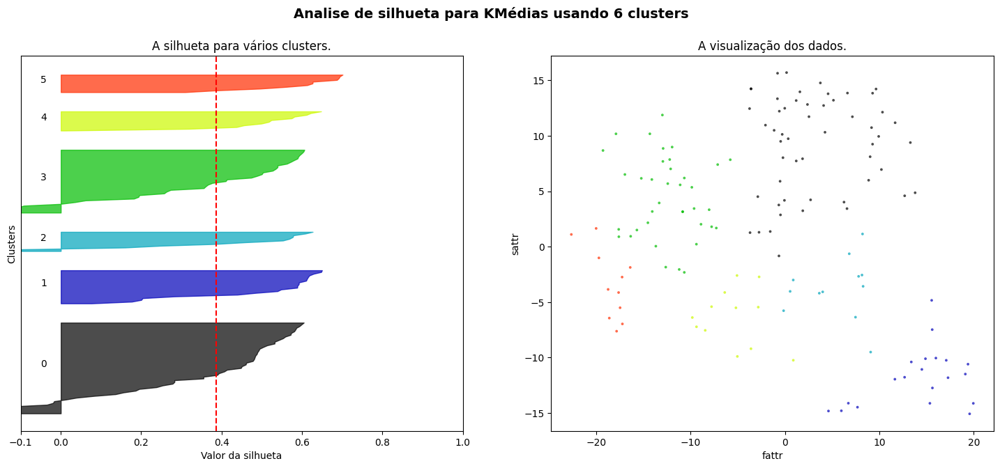

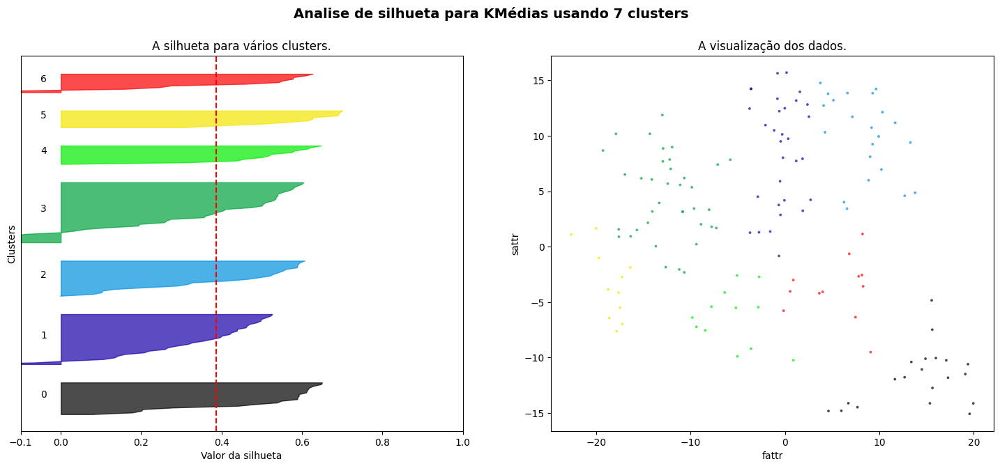

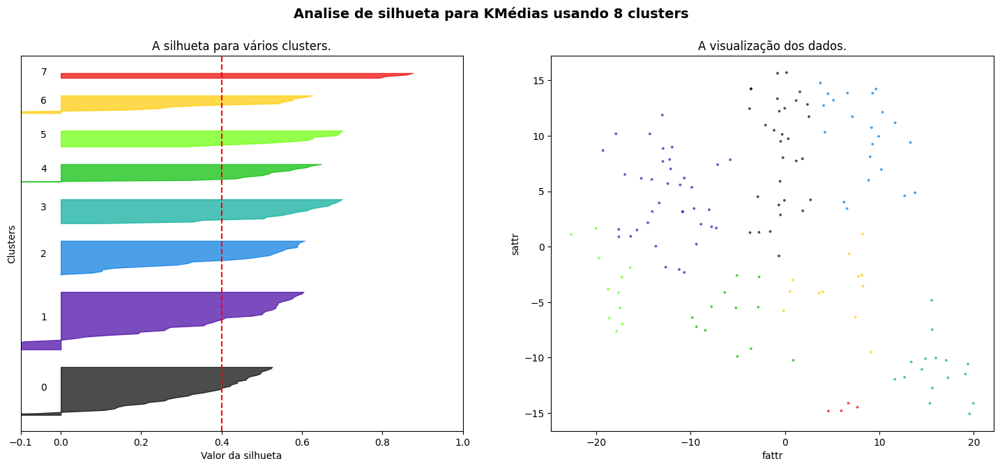

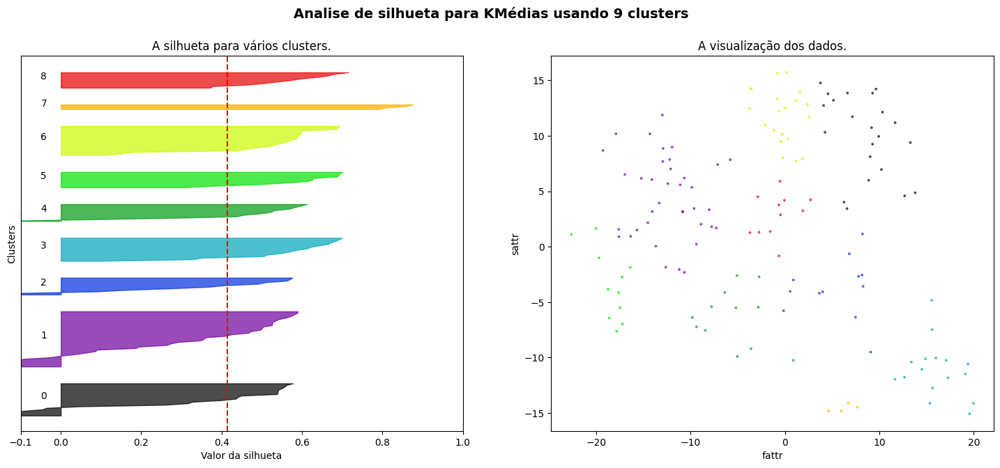

In [ ]:
siluetteFunction(data, 'fattr', 'sattr')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

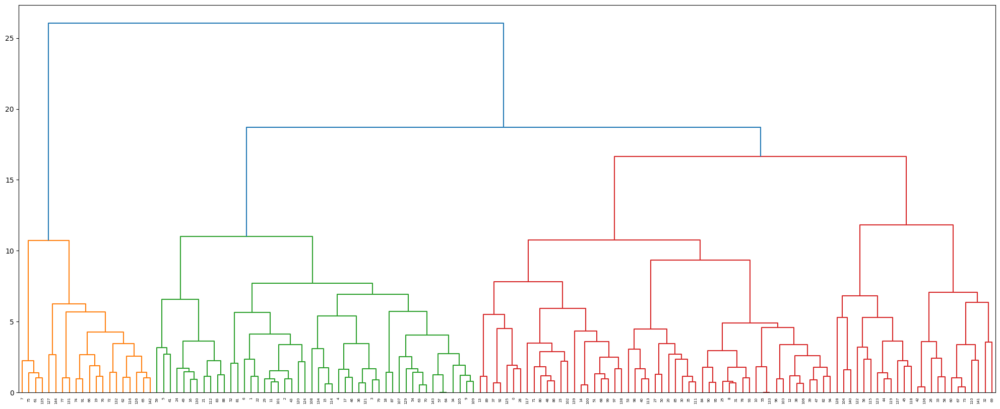

In [ ]:
completeLinkage = linkage(distances, 'average')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

####Centroid Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='ward')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 0], localData[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 0] e localData[:, 1] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.3684927
Número de clusters = 3 A média de silhueta : 0.43045172
Número de clusters = 4 A média de silhueta : 0.45421663
Número de clusters = 5 A média de silhueta : 0.41955292
Número de clusters = 6 A média de silhueta : 0.39683443
Número de clusters = 7 A média de silhueta : 0.40307897
Número de clusters = 8 A média de silhueta : 0.40471265
Número de clusters = 9 A média de silhueta : 0.41504854


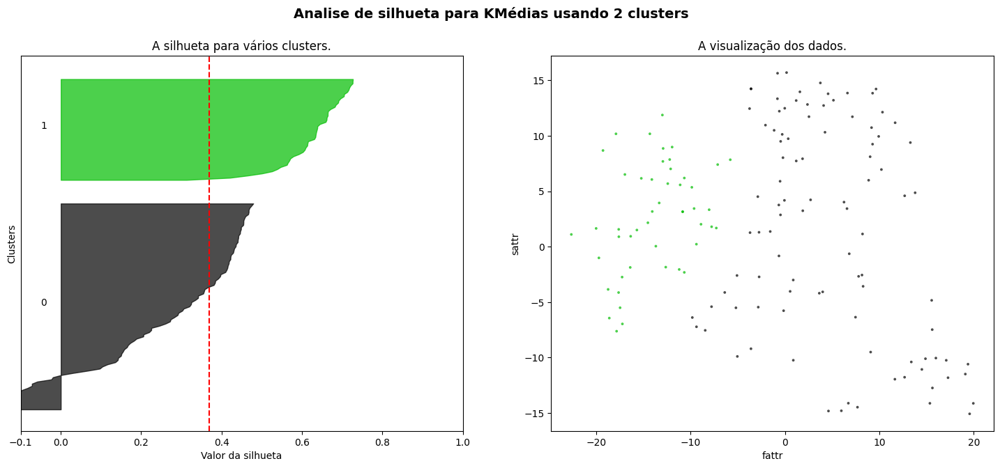

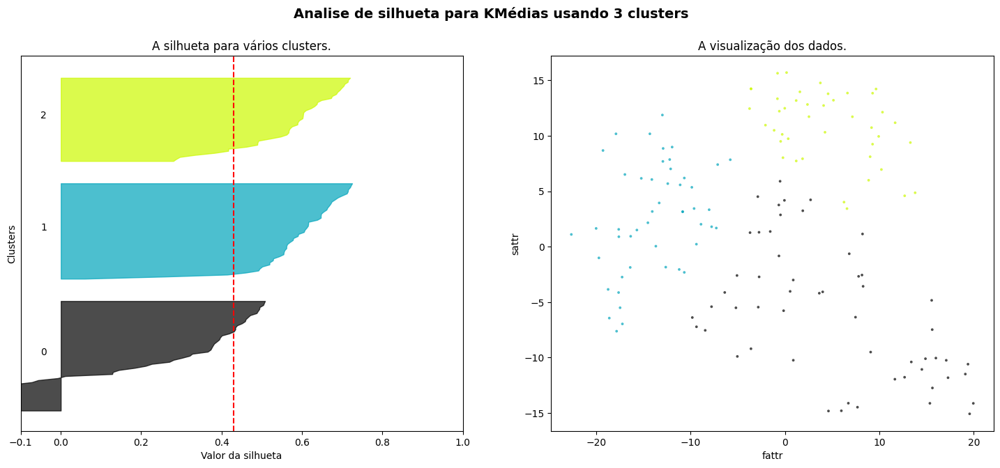

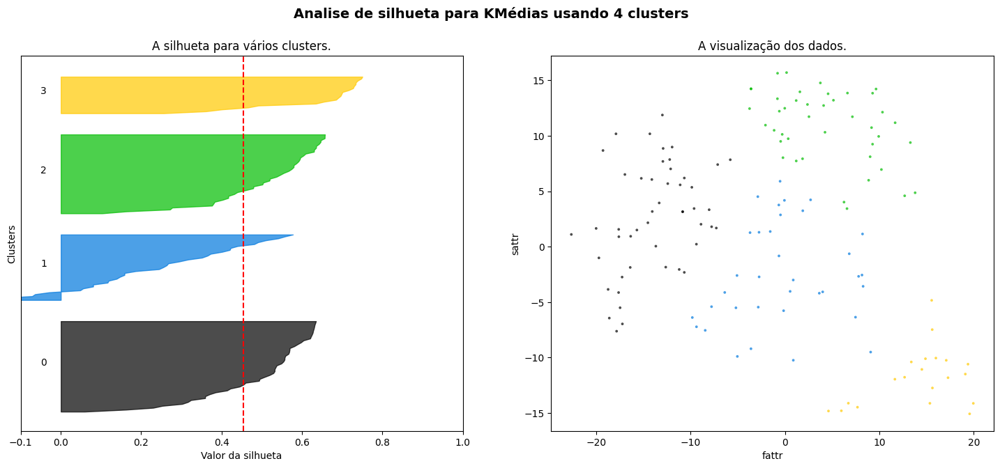

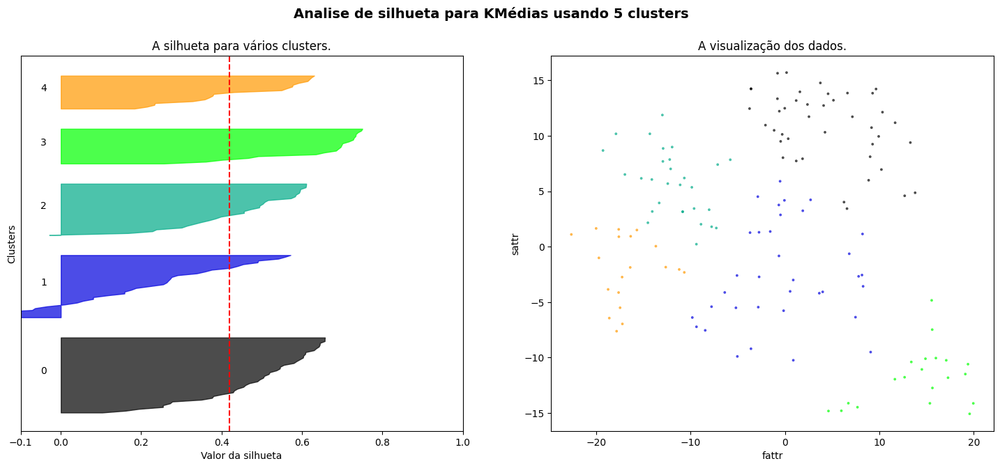

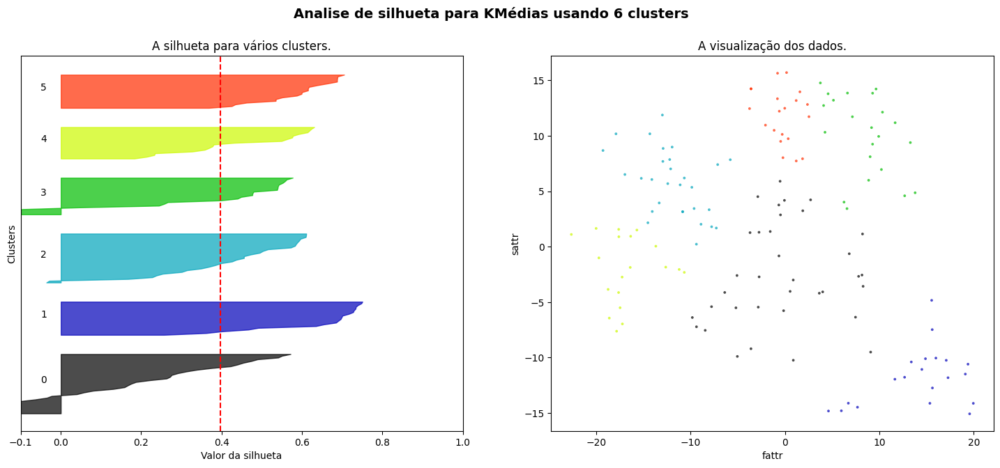

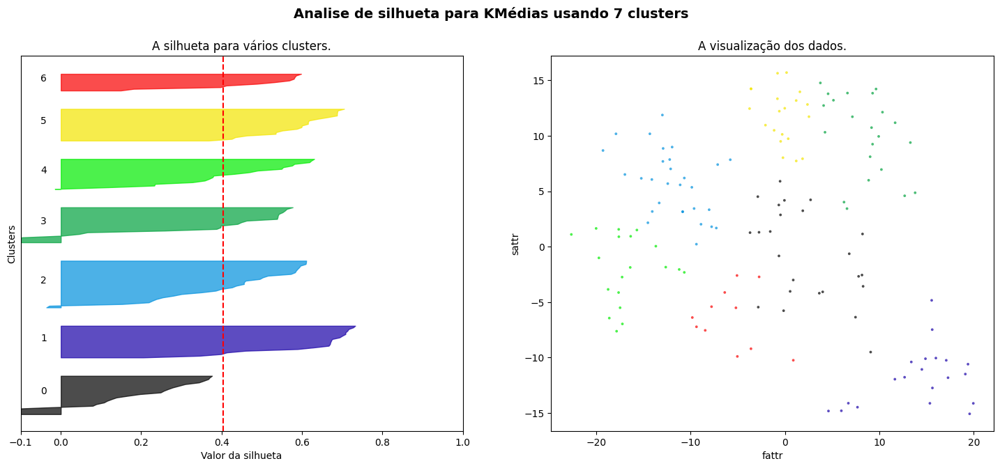

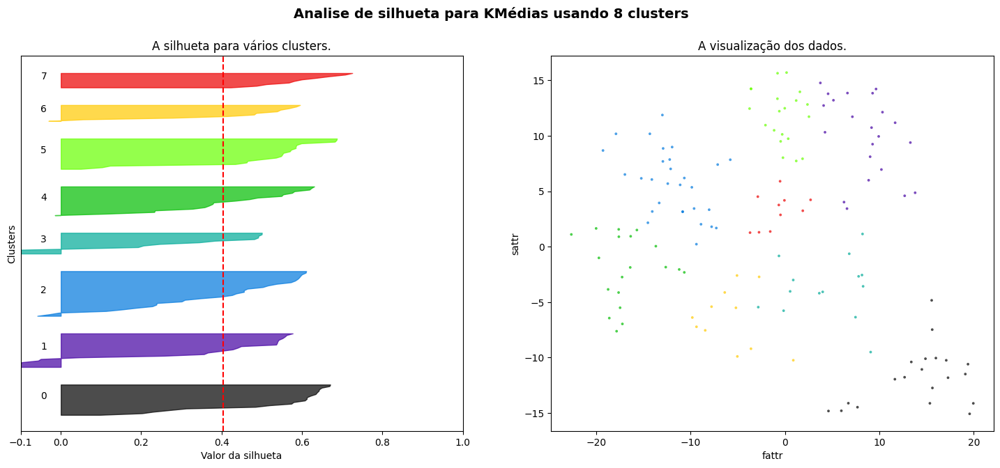

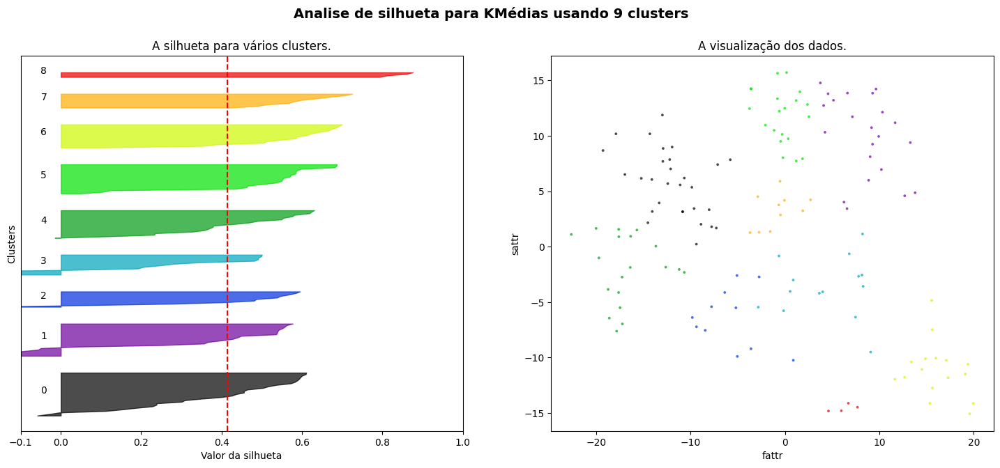

In [ ]:
siluetteFunction(data, 'fattr', 'sattr')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

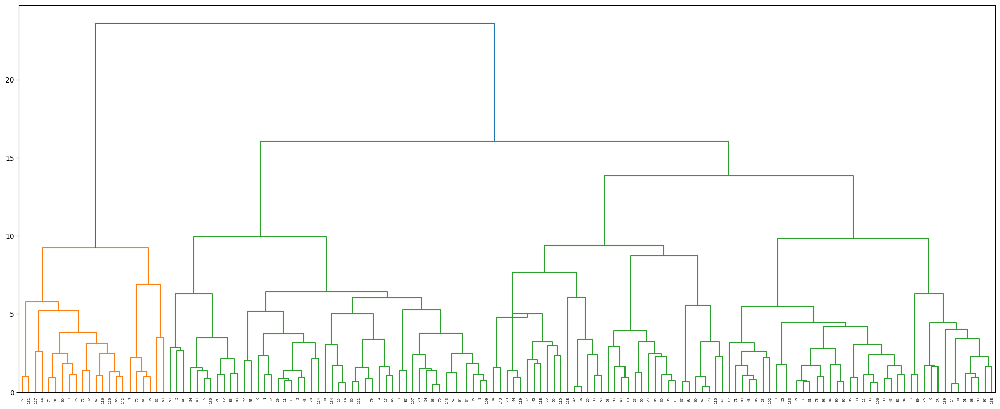

In [ ]:
completeLinkage = linkage(distances, 'centroid')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

###Selector 2



####KMédias

Selecionando linhas com selector 2:





In [ ]:
data = df2[df2['selector'] == 2][['fattr', 'sattr']].to_numpy()
data

array([[  4.7665796 , -14.514249  ],
       [  4.518206  ,  -7.7513647 ],
       [  5.740938  ,   1.2777194 ],
       [-12.17712   ,  12.187437  ],
       [-21.566042  ,   5.103413  ],
       [ 14.402586  , -15.566927  ],
       [ -8.768372  ,  -8.31022   ],
       [-21.009151  ,  -1.5465714 ],
       [  6.5518146 ,   6.3036566 ],
       [ -0.65482503,  -2.6022332 ],
       [ 13.773803  ,  -2.7499604 ],
       [  4.051896  ,  -1.6540451 ],
       [  6.91987   ,  13.01495   ],
       [ -0.03171249,  14.170202  ],
       [-11.238832  ,   9.090344  ],
       [-16.01527   ,   4.645244  ],
       [-20.619389  ,   4.113973  ],
       [  3.331733  ,  -8.77831   ],
       [ -1.596855  ,  11.445192  ],
       [ -4.439134  , -10.044728  ],
       [ -2.8987164 ,  11.311895  ],
       [-13.425003  ,   5.67463   ],
       [ 13.612837  , -11.45359   ],
       [  0.04660882,  -9.511853  ],
       [ -4.273387  ,  -5.7001476 ],
       [-12.456233  ,   3.9281235 ],
       [  1.204632  ,  11.414099  ],
 

Definido a função de silhueta:

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = KMeans(n_clusters=numberClusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(localData)
    silhouette_avg = silhouette_score(localData, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 0], localData[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 0] e localData[:, 1] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker="o", c="white", alpha=1, s=200, edgecolor="k",)
    # centers[:, 0] e centers[:, 1] Escolhe os valores das colunas 3 e 5 que compoem o vetor que representa os centroids

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Executando a função:

Número de clusters = 2 A média de silhueta : 0.46237567
Número de clusters = 3 A média de silhueta : 0.41501758
Número de clusters = 4 A média de silhueta : 0.45218346
Número de clusters = 5 A média de silhueta : 0.45640346
Número de clusters = 6 A média de silhueta : 0.4363146
Número de clusters = 7 A média de silhueta : 0.38421893
Número de clusters = 8 A média de silhueta : 0.3793016
Número de clusters = 9 A média de silhueta : 0.3684889


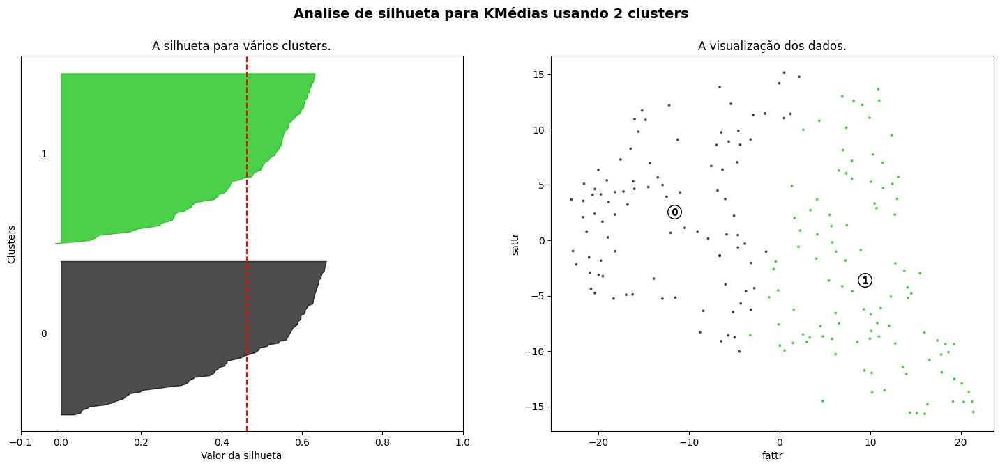

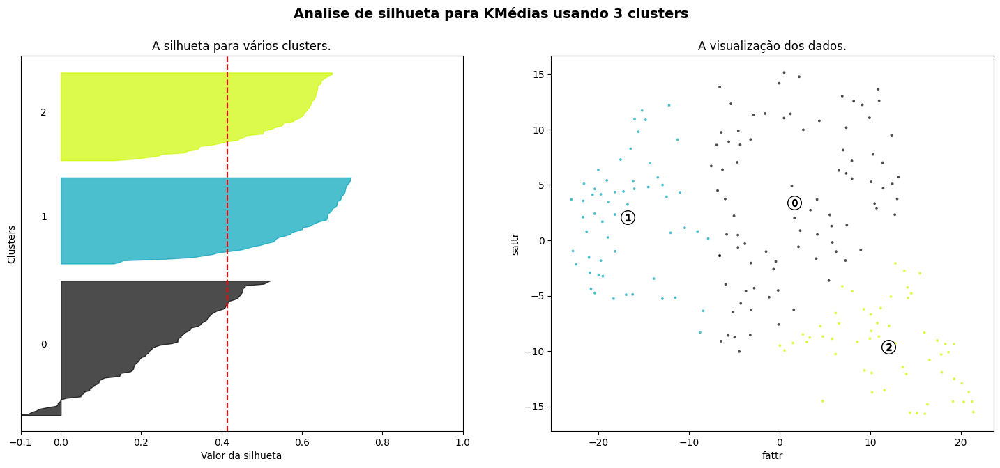

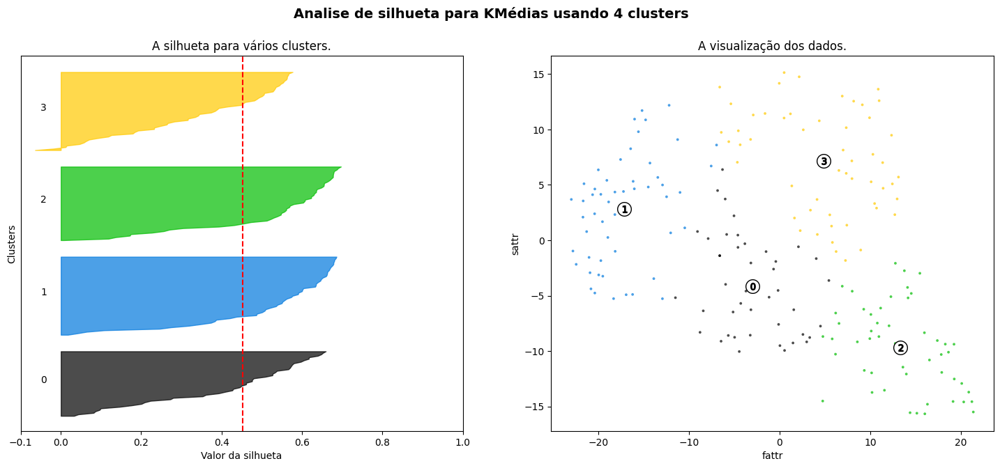

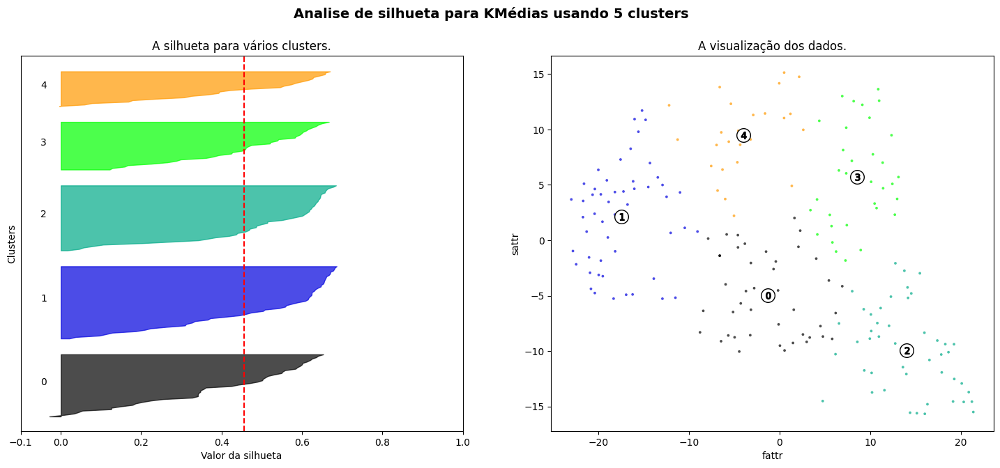

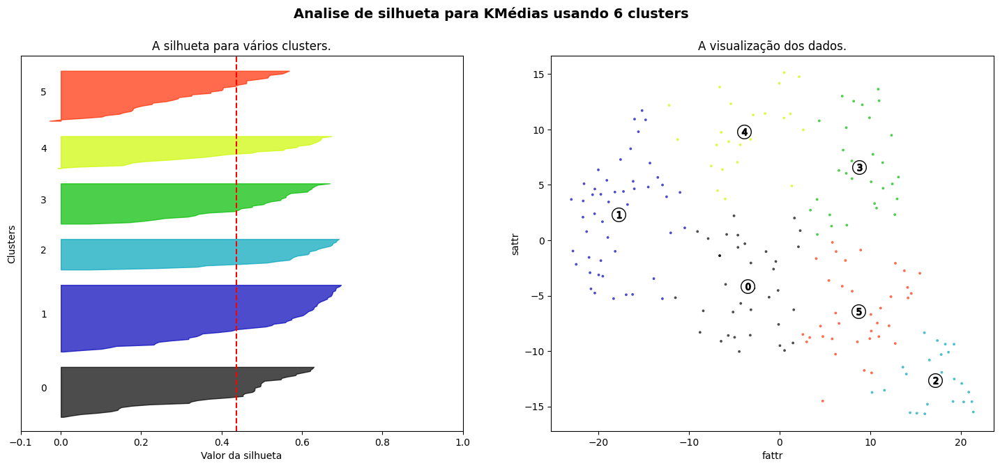

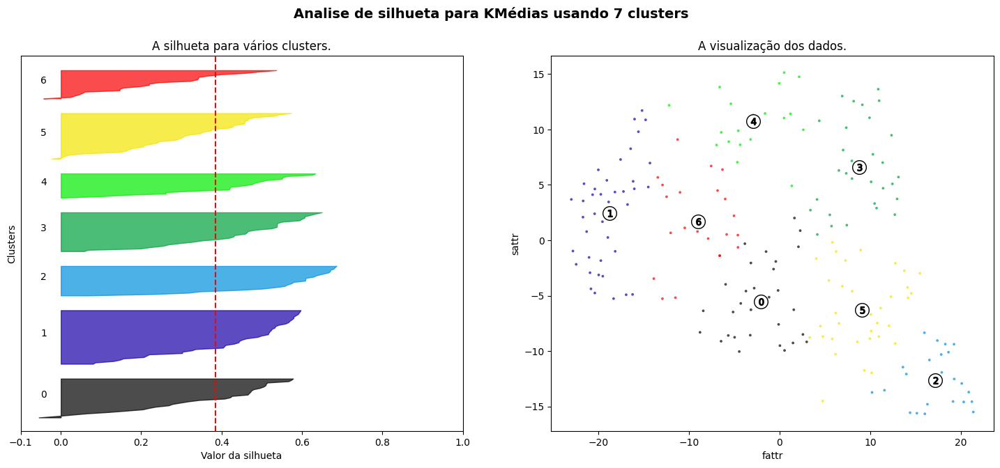

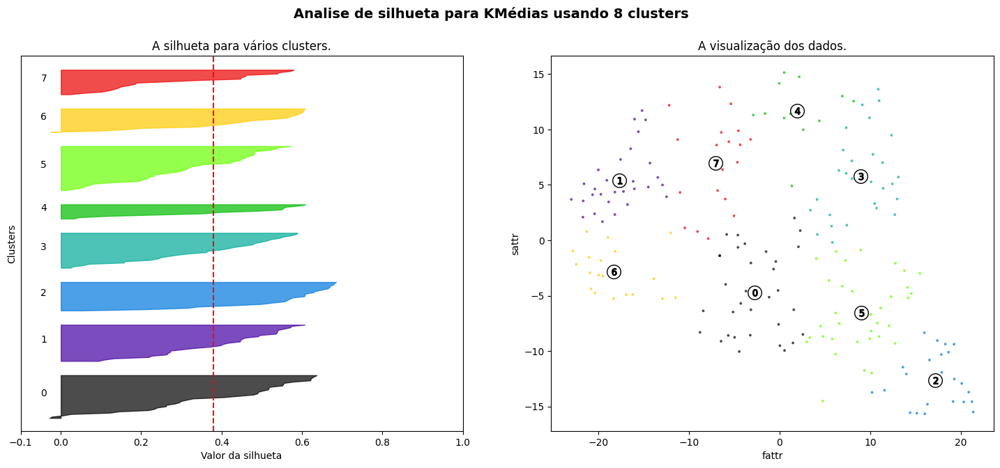

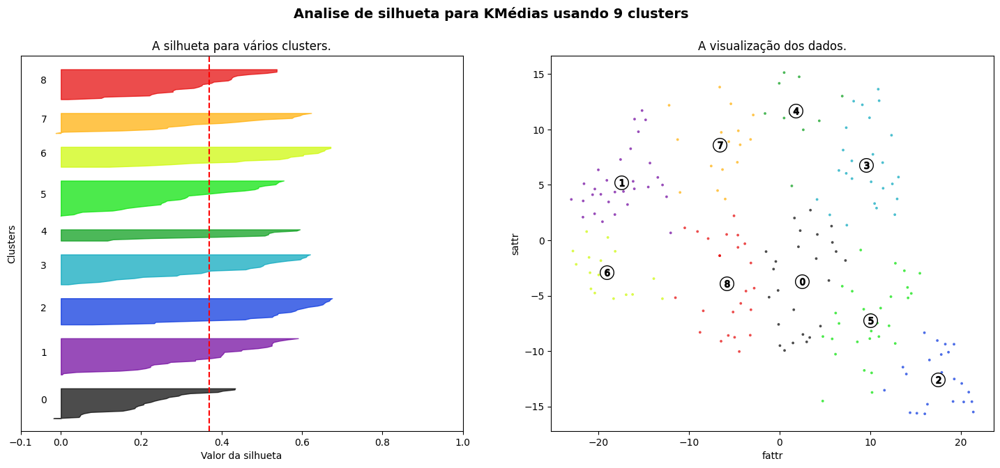

In [ ]:
siluetteFunction(data, 'fattr', 'sattr')

####Single Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='single')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 0], localData[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 0] e localData[:, 1] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : -0.0072939075
Número de clusters = 3 A média de silhueta : 0.11940139
Número de clusters = 4 A média de silhueta : -0.0792868
Número de clusters = 5 A média de silhueta : -0.06115343
Número de clusters = 6 A média de silhueta : -0.06410399
Número de clusters = 7 A média de silhueta : -0.12160859
Número de clusters = 8 A média de silhueta : -0.11824524
Número de clusters = 9 A média de silhueta : -0.013291078


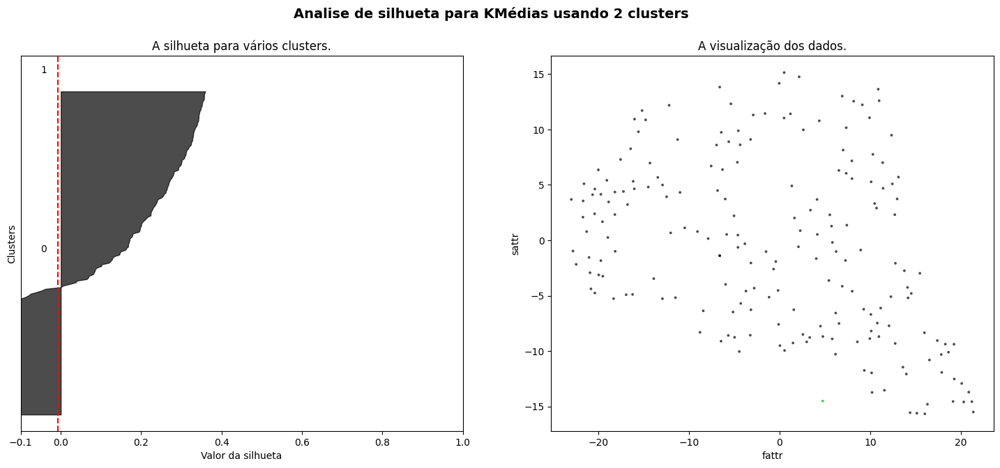

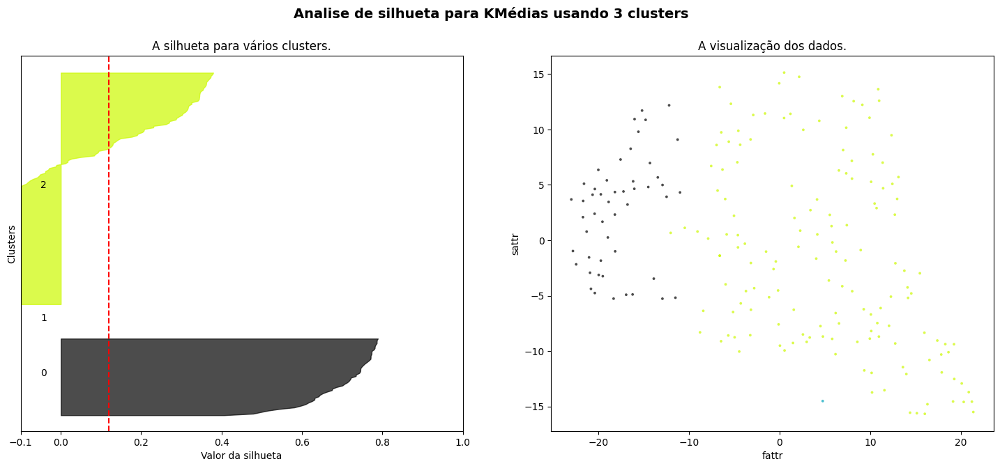

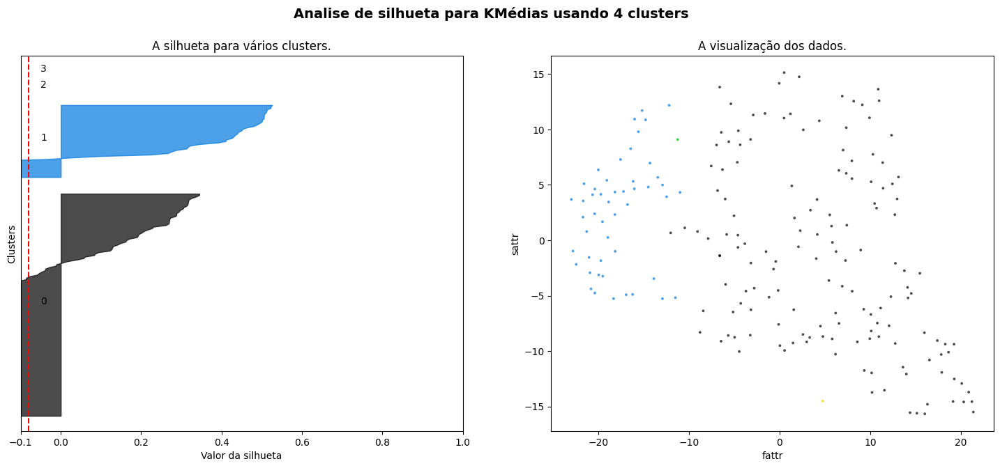

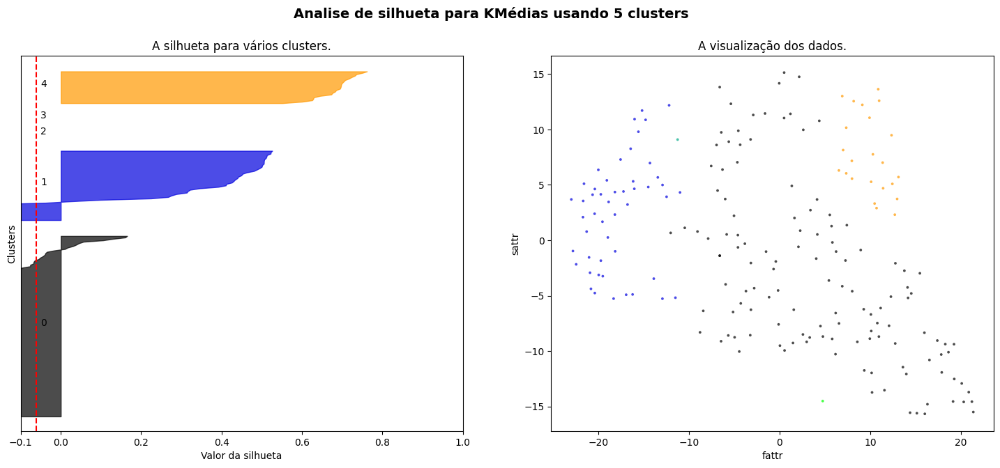

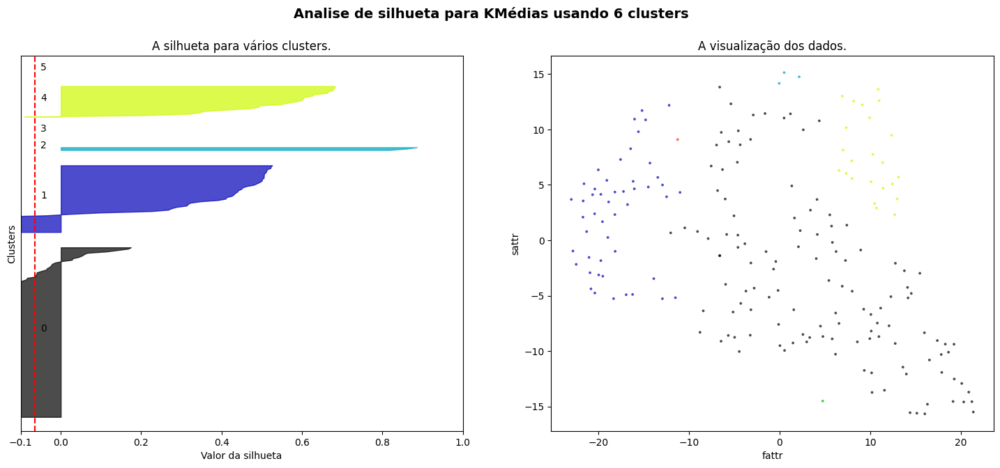

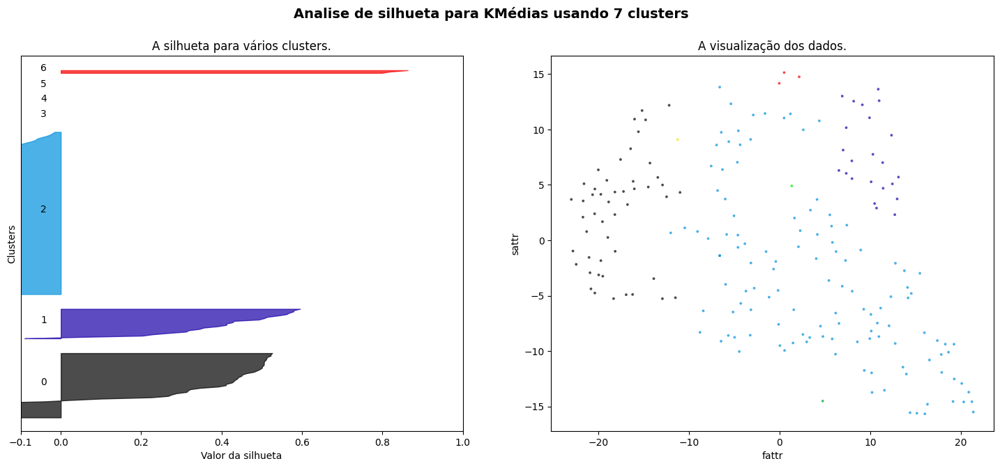

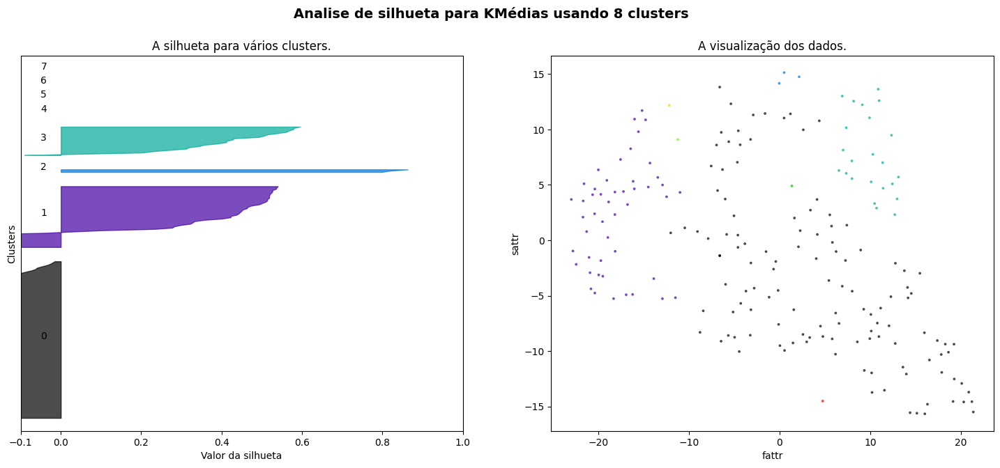

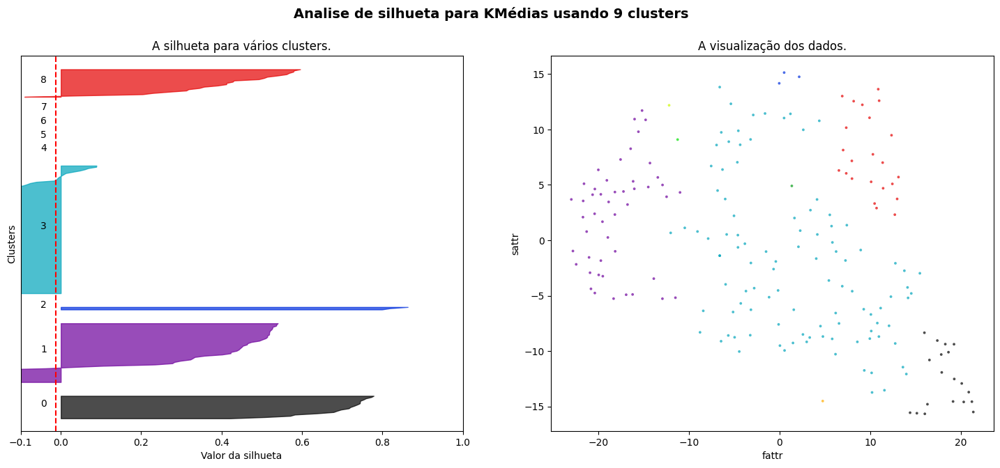

In [ ]:
siluetteFunction(data, 'fattr', 'sattr')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

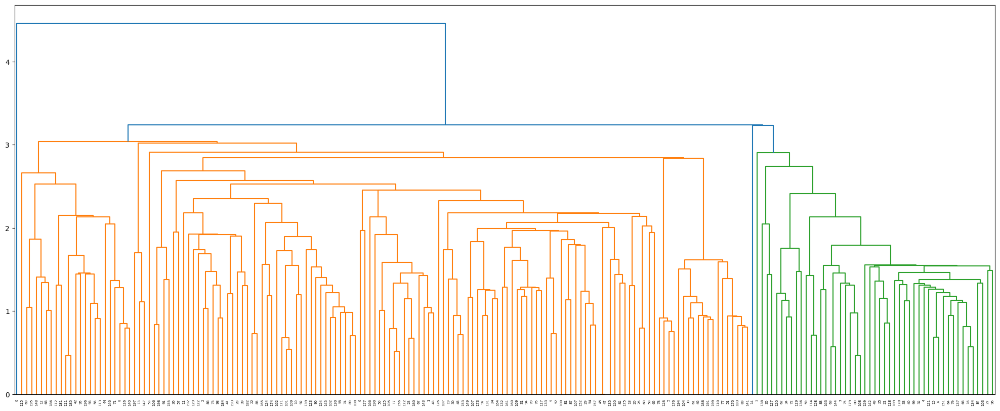

In [ ]:
singleLinkage = linkage(distances, 'single')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(singleLinkage)

####Complete Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='complete')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 0], localData[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 0] e localData[:, 1] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.36083794
Número de clusters = 3 A média de silhueta : 0.3797351
Número de clusters = 4 A média de silhueta : 0.4343748
Número de clusters = 5 A média de silhueta : 0.4134256
Número de clusters = 6 A média de silhueta : 0.37731656
Número de clusters = 7 A média de silhueta : 0.36426547
Número de clusters = 8 A média de silhueta : 0.37341544
Número de clusters = 9 A média de silhueta : 0.37204093


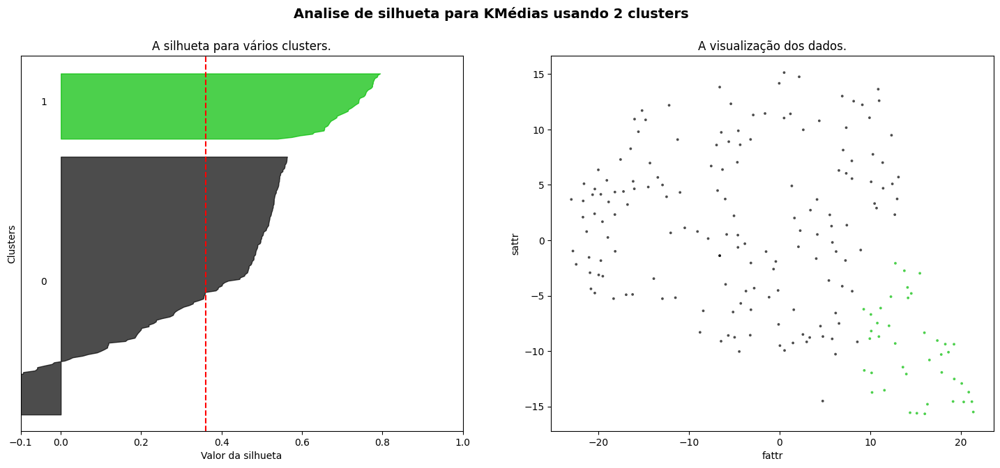

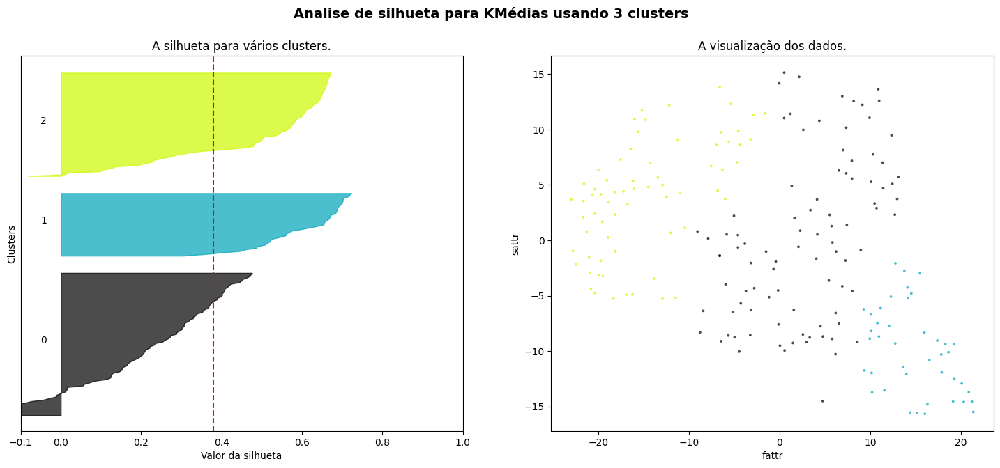

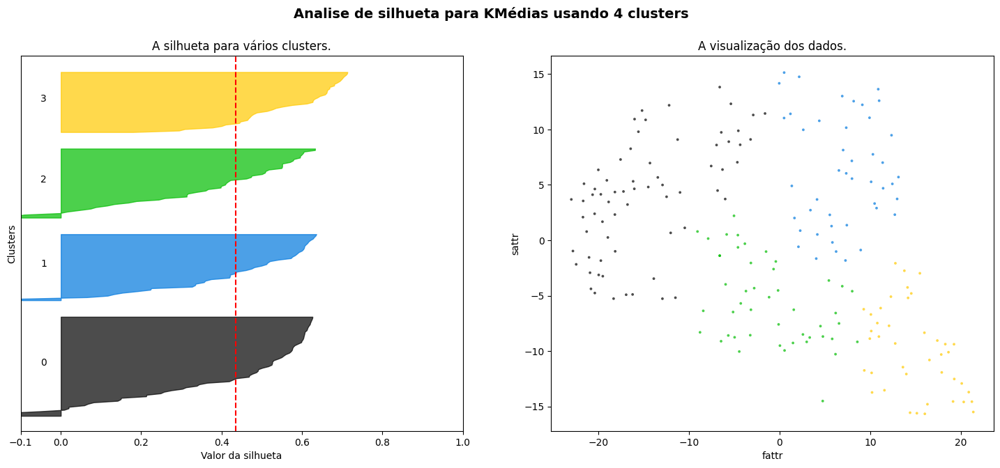

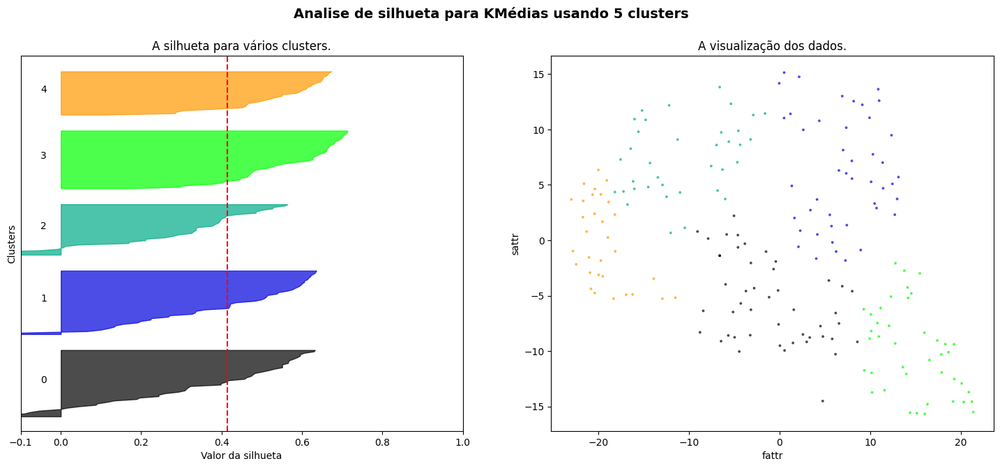

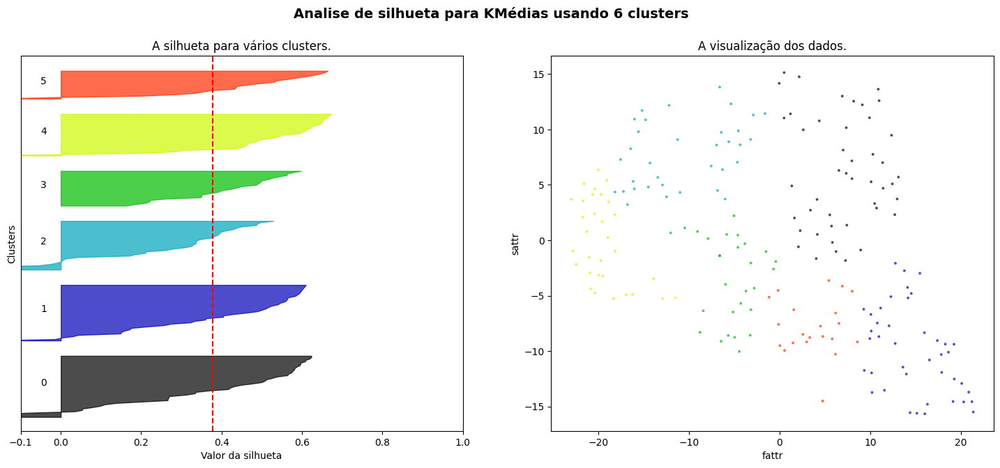

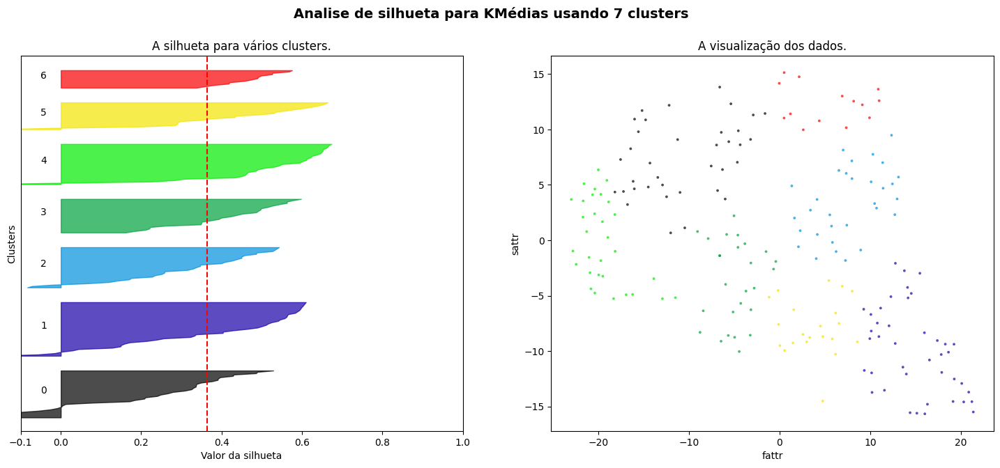

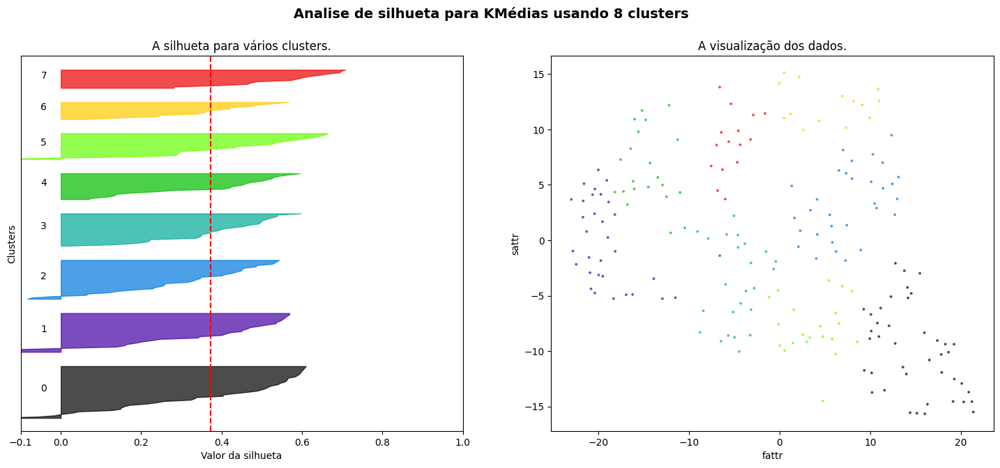

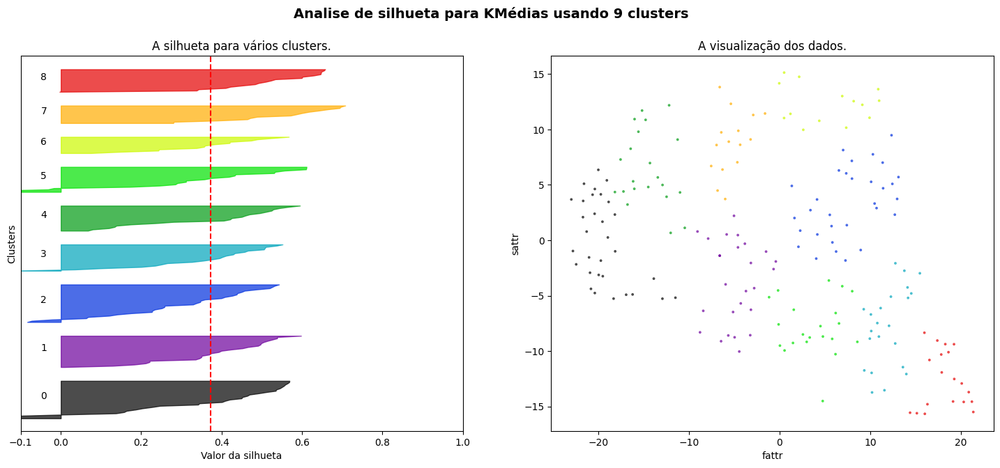

In [ ]:
siluetteFunction(data, 'fattr', 'sattr')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

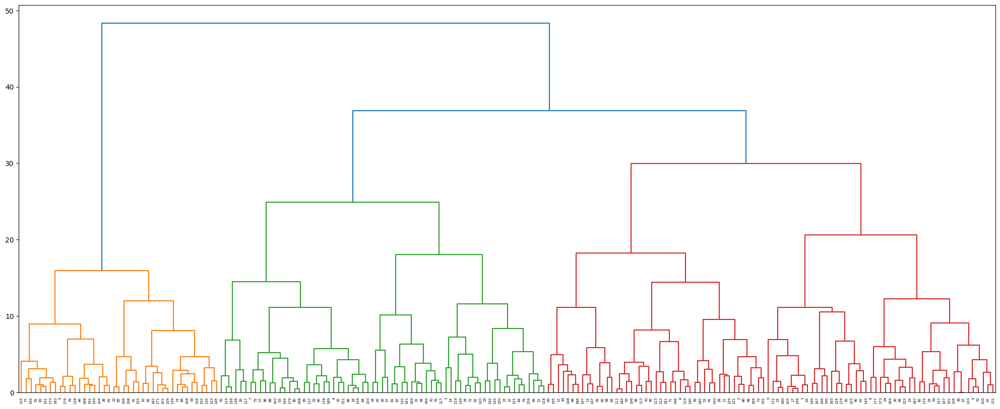

In [ ]:
completeLinkage = linkage(distances, 'complete')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

####Average Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='average')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 0], localData[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 0] e localData[:, 1] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.4328371
Número de clusters = 3 A média de silhueta : 0.39114055
Número de clusters = 4 A média de silhueta : 0.4425251
Número de clusters = 5 A média de silhueta : 0.4434459
Número de clusters = 6 A média de silhueta : 0.414435
Número de clusters = 7 A média de silhueta : 0.39939606
Número de clusters = 8 A média de silhueta : 0.40436733
Número de clusters = 9 A média de silhueta : 0.406203


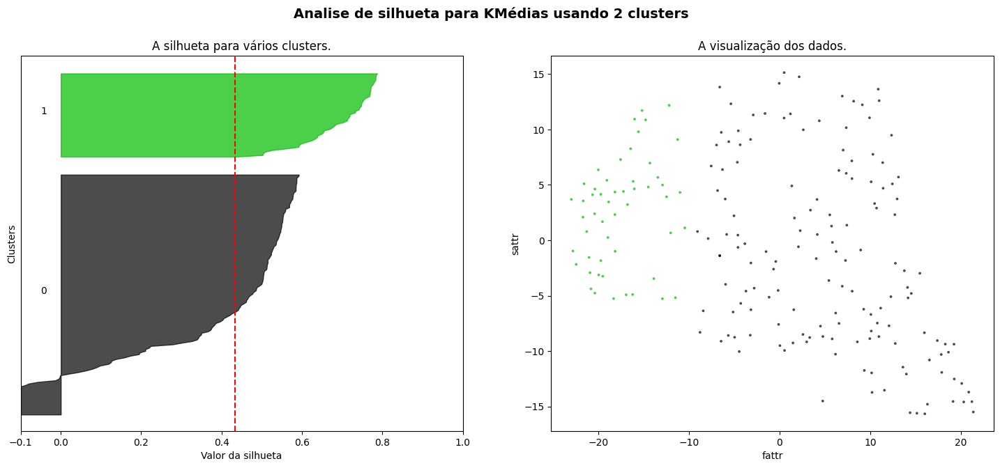

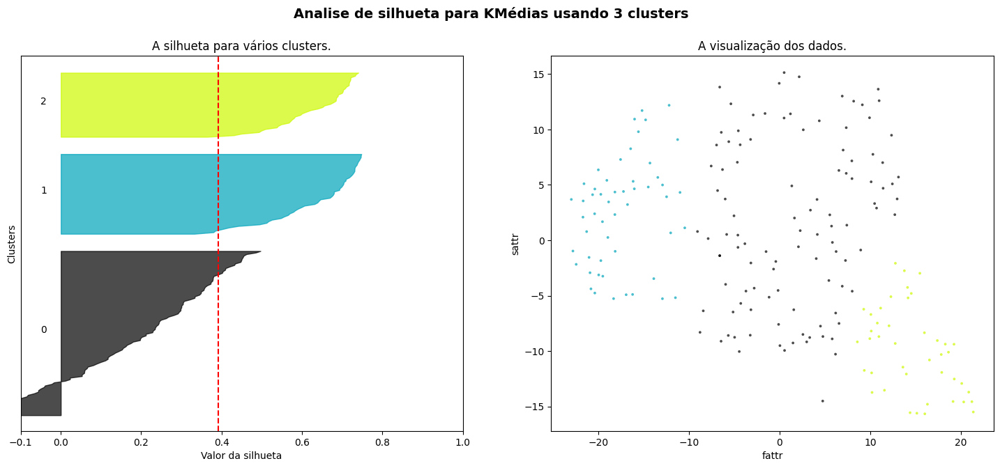

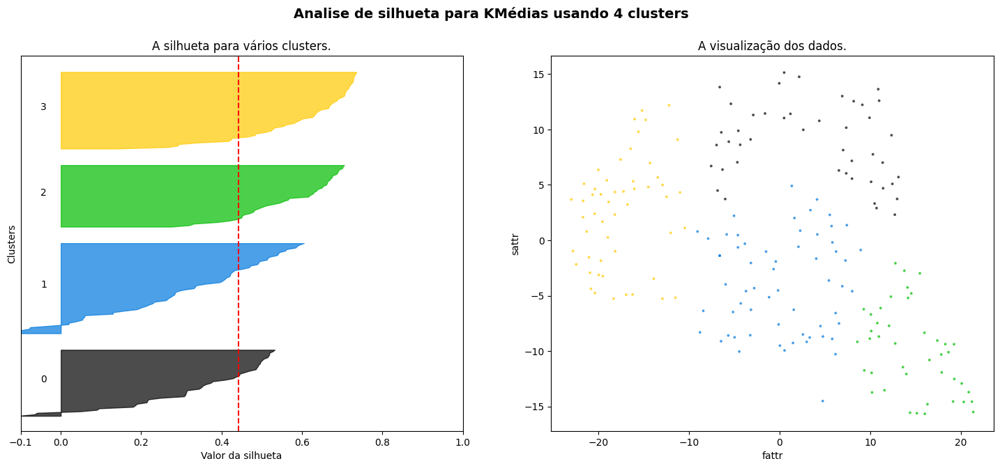

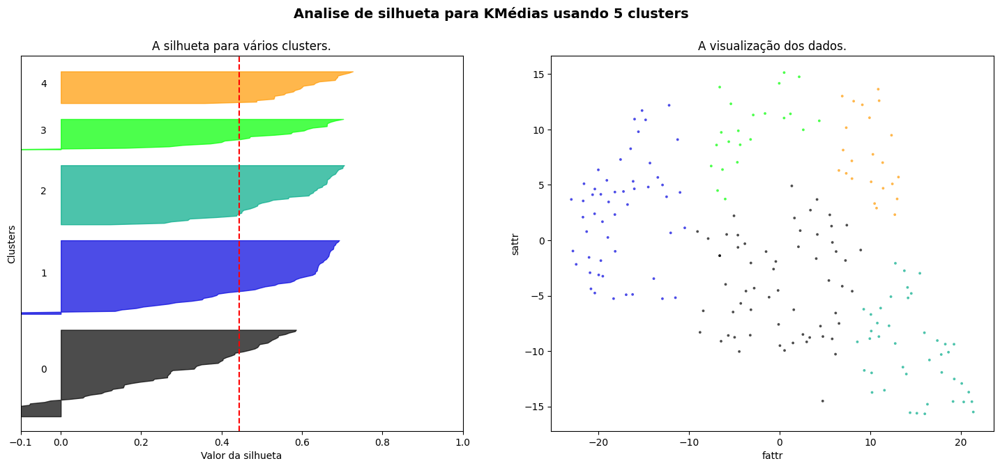

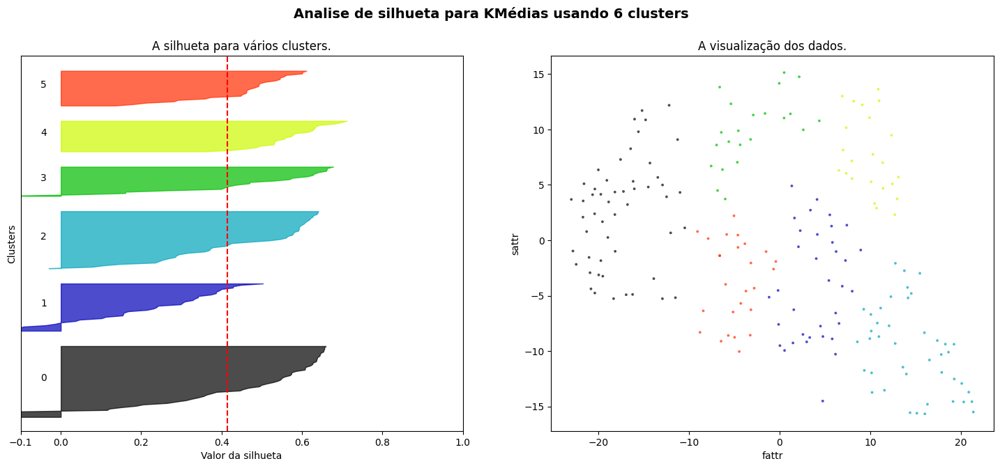

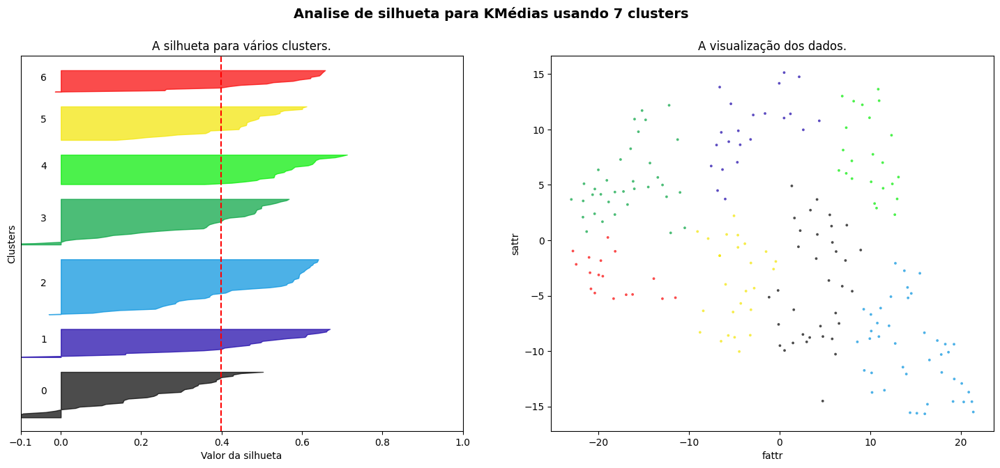

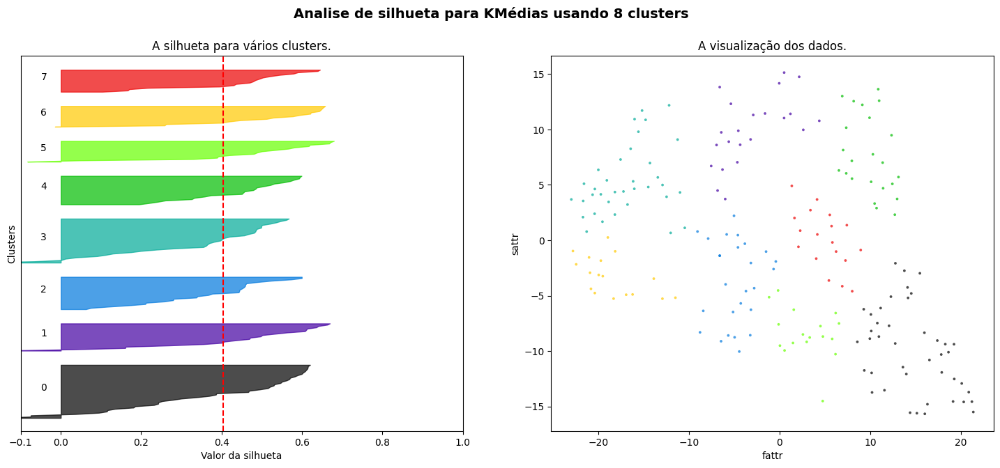

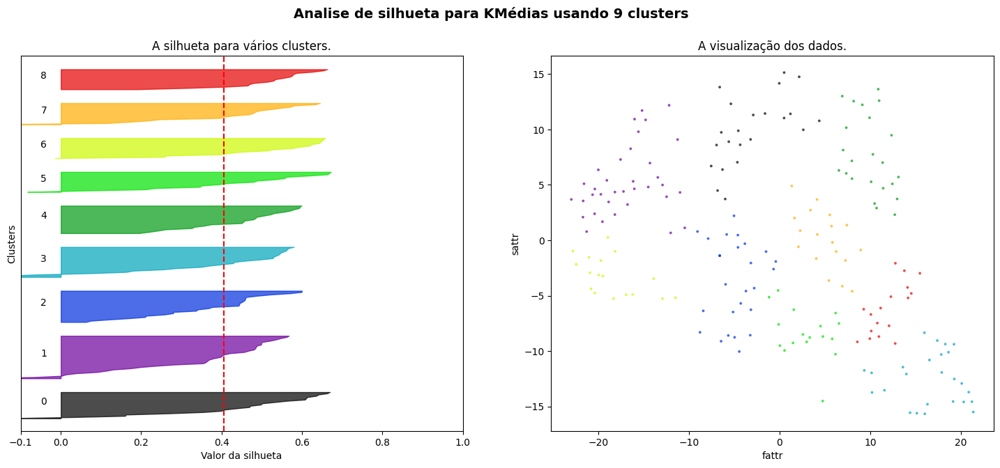

In [ ]:
siluetteFunction(data, 'fattr', 'sattr')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

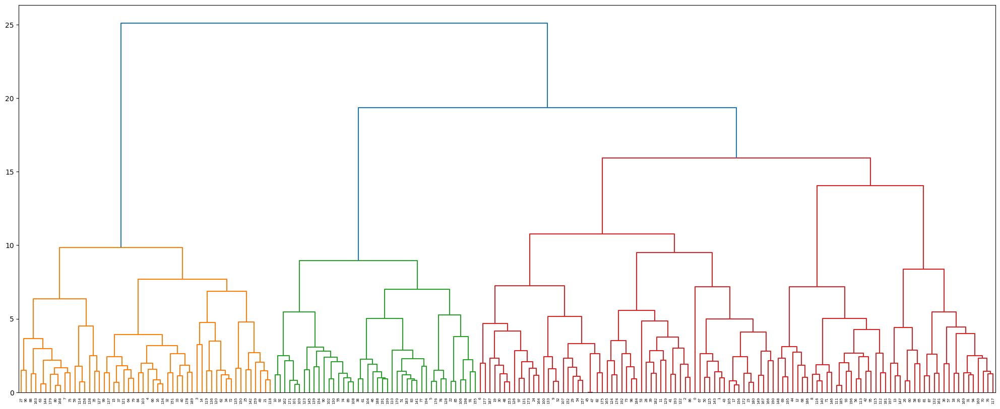

In [ ]:
completeLinkage = linkage(distances, 'average')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)

####Centroid Linkage

In [ ]:
def siluetteFunction(localData, columnName1, columnName2):
  for numberClusters in range(2,10,1):
    bestLocalMetric = 0
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(localData) + (numberClusters + 1) * 10])
    clusterer = AgglomerativeClustering(n_clusters=numberClusters, linkage='ward')
    cluster_labels = clusterer.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    print(
        "Número de clusters =", numberClusters, "A média de silhueta :", silhouette_avg,
    )
    sample_silhouette_values = silhouette_samples(localData, cluster_labels)

    y_lower = 10
    for i in range(numberClusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / numberClusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10 

    ax1.set_title("A silhueta para vários clusters.")
    ax1.set_xlabel("Valor da silhueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / numberClusters)
    ax2.scatter(
        localData[:, 0], localData[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        # localData[:, 0] e localData[:, 1] Escolhe as colunas 3 e 5 para serem plotadas, porém poderia ter escolhido qualquer uma
    )

    ax2.set_title("A visualização dos dados.")
    ax2.set_xlabel(columnName1)
    ax2.set_ylabel(columnName2)

    plt.suptitle(
        "Analise de silhueta para KMédias usando %d clusters"
        % numberClusters,
        fontsize=14,
        fontweight="bold",
    )

  plt.show()

Número de clusters = 2 A média de silhueta : 0.4259333
Número de clusters = 3 A média de silhueta : 0.40582615
Número de clusters = 4 A média de silhueta : 0.4275642
Número de clusters = 5 A média de silhueta : 0.409937
Número de clusters = 6 A média de silhueta : 0.38117218
Número de clusters = 7 A média de silhueta : 0.37564164
Número de clusters = 8 A média de silhueta : 0.38520095
Número de clusters = 9 A média de silhueta : 0.37182587


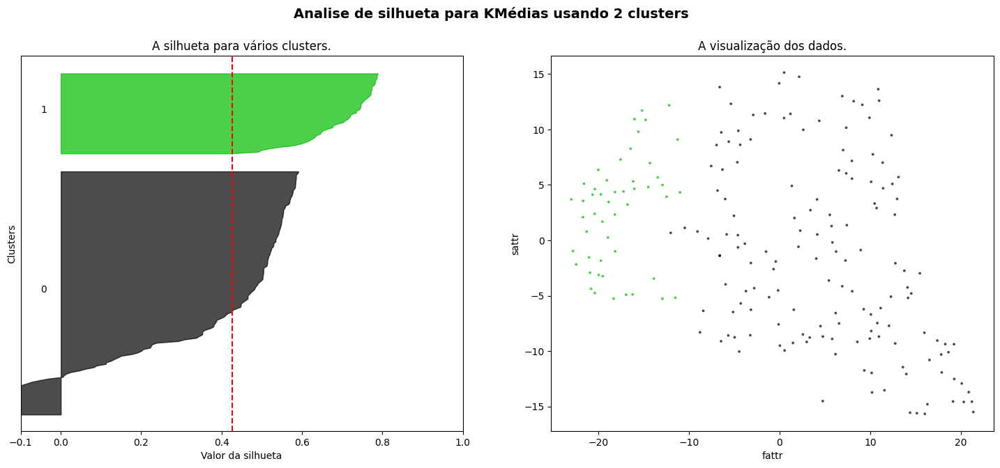

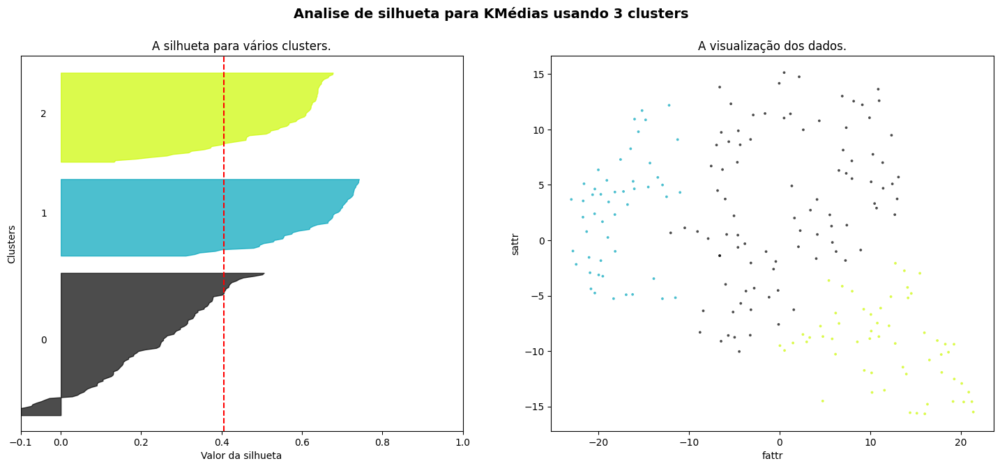

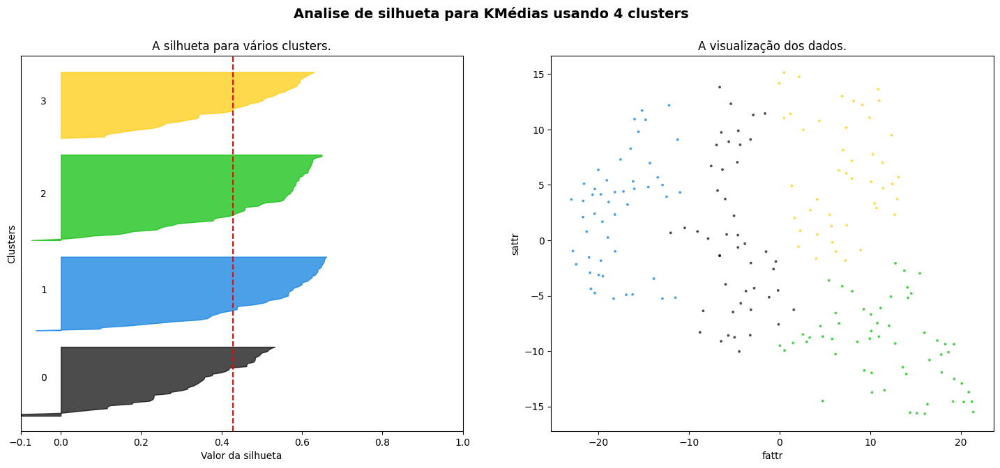

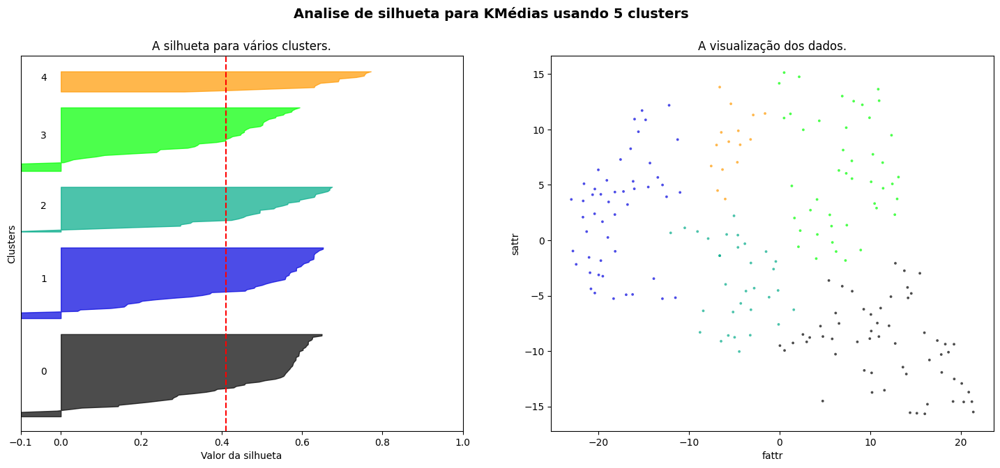

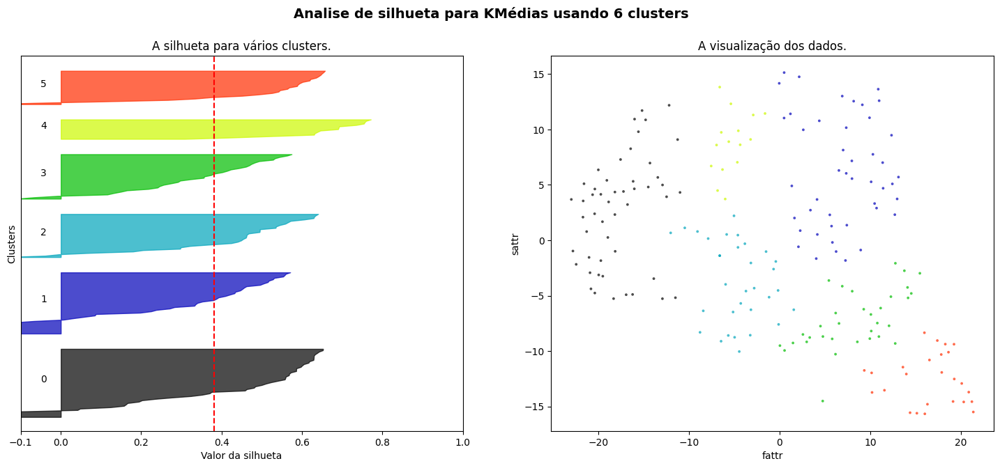

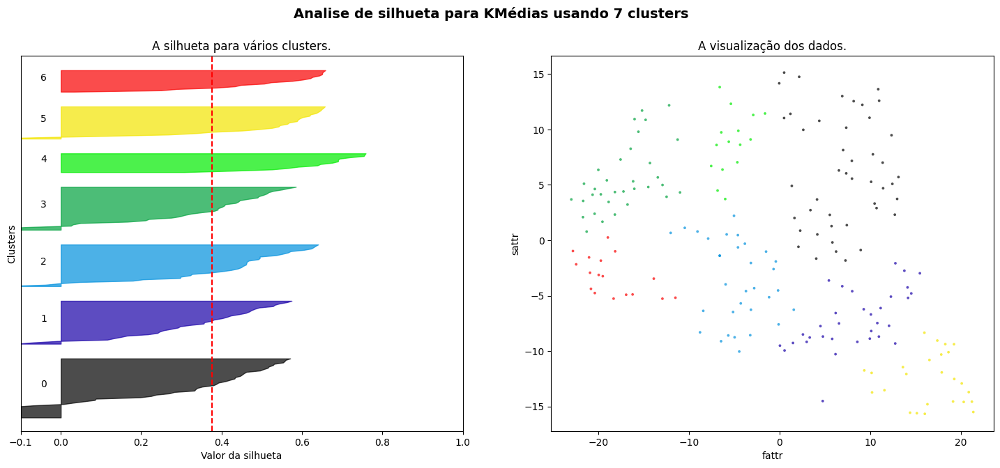

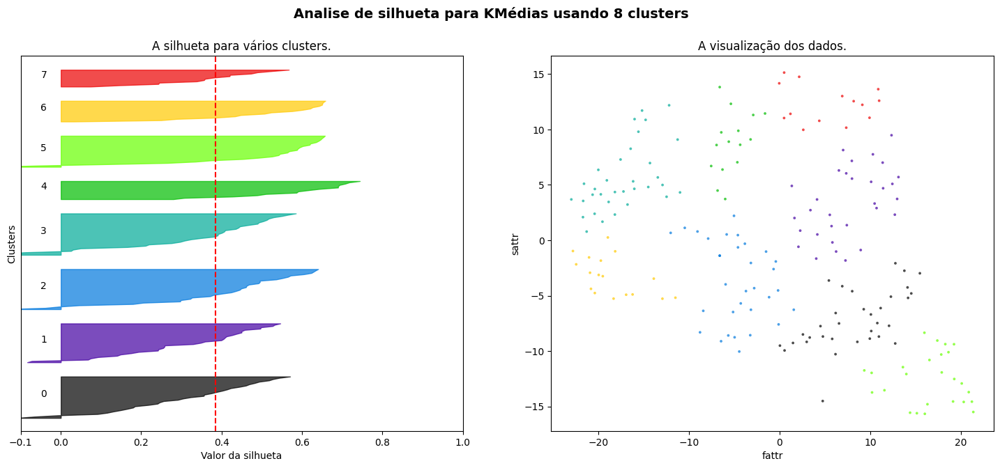

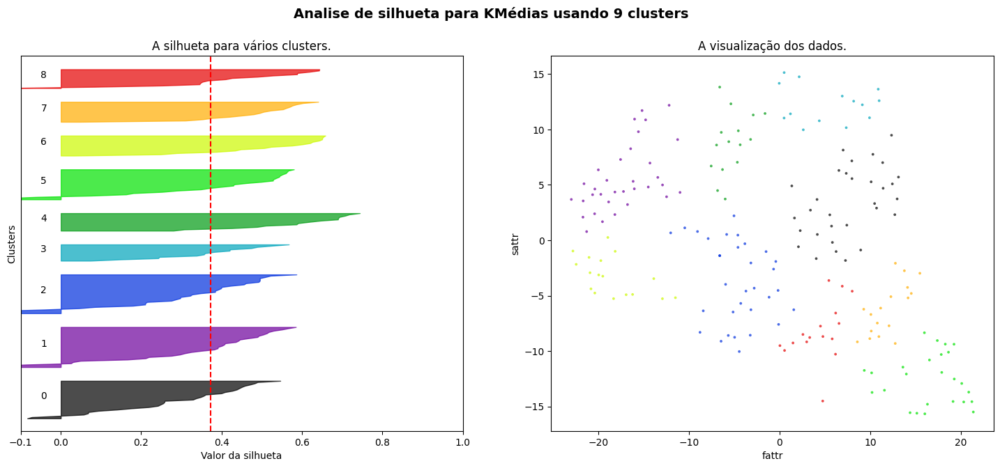

In [ ]:
siluetteFunction(data, 'fattr', 'sattr')

Definindo as distancias entre os elementos:

In [ ]:
distances = pdist(data)

Fazendo dendograma:

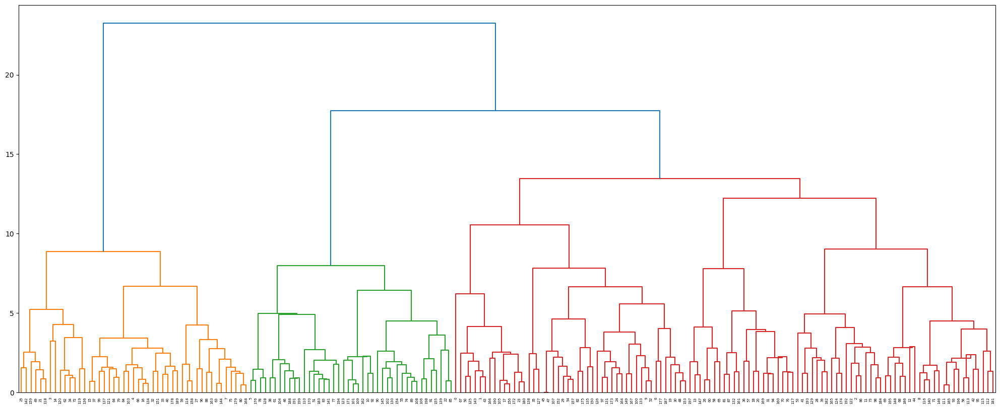

In [ ]:
completeLinkage = linkage(distances, 'centroid')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(completeLinkage)